# Load Library

In [1]:
# general imports
import sys
import os
import torch
import torch.nn as nn
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import multiprocessing as mp
import wandb
from sklearn.model_selection import train_test_split 

In [2]:
torch.__version__

'2.2.2'

In [3]:
# get the DGD modules (once the current version is public we can switch to the repo)
# git clone https://github.com/Center-for-Health-Data-Science/DeepGenerativeDecoder.git
# for now I added them to this repo, but the imports will stay the same
from base.dgd.nn import NB_Module, ZINB_Module
from base.dgd.DGD import DGD

# get the new stuff
from base.utils.helpers import set_seed, get_activation
from base.model.decoder import Decoder
from base.data.combined import GeneExpressionDatasetCombined, StratifiedBatchSampler
from base.engine.train import train_midgd

# Set seeds, device, and directory

In [4]:
# set random seeds, device and data directory
seed = 42
set_seed(seed)

num_workers = 14

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

datadir = "./data/"

cuda


# Load Data

In [5]:
# tcga_mrna_raw = pd.read_table("data/TCGA_mrna_counts_match_transposed.tsv", sep='\t', index_col=[0])
# tcga_mirna_raw = pd.read_table("data/TCGA_mirna_counts_match_transposed.tsv", sep='\t', index_col=[0])
tcga_mrna_raw = pd.read_table("data/TCGA_mrna_counts_match_iso.tsv", sep='\t', index_col=[0])
tcga_mirna_raw = pd.read_table("data/TCGA_mirna_counts_match_iso.tsv", sep='\t', index_col=[0])

In [6]:
tcga_mrna_raw

,ENSG00000186092.4,ENSG00000278566.1,ENSG00000273547.1,ENSG00000187634.11,ENSG00000188976.10,ENSG00000187961.13,ENSG00000187583.10,ENSG00000187642.9,ENSG00000188290.10,ENSG00000187608.8,...,ENSG00000172352.5,ENSG00000183795.8,ENSG00000187191.14,ENSG00000205916.11,ENSG00000185894.8,ENSG00000172288.7,tissue_type,sample_type,color,cancer_type
TCGA-EW-A6SA-01A-21R-A32P-07,0.0,0.0,1.0,1413.0,9723.0,1310.0,216.0,84.0,972.0,834.0,...,0.0,0.0,0.0,0.0,0.0,0.0,Tumor,Primary Tumor,#ED1E91,BRCA
TCGA-E2-A14W-01A-11R-A12D-07,0.0,0.0,0.0,1562.0,6455.0,299.0,489.0,249.0,69.0,538.0,...,0.0,0.0,0.0,0.0,0.0,0.0,Tumor,Primary Tumor,#ED1E91,BRCA
TCGA-EW-A1PD-01A-11R-A144-07,0.0,0.0,1.0,912.0,7050.0,439.0,86.0,23.0,357.0,1281.0,...,0.0,0.0,0.0,0.0,0.0,0.0,Tumor,Primary Tumor,#ED1E91,BRCA
TCGA-55-1594-01A-01R-0946-07,0.0,0.0,0.0,501.0,4238.0,459.0,29.0,13.0,134.0,1300.0,...,0.0,0.0,0.0,0.0,0.0,0.0,Tumor,Primary Tumor,#D2C3DF,LUAD
TCGA-49-6742-11A-01R-1858-07,0.0,0.0,0.0,321.0,1791.0,93.0,42.0,18.0,113.0,831.0,...,0.0,0.0,0.0,0.0,0.0,0.0,Normal,Solid Tissue Normal,#D2C3DF,LUAD
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TCGA-A8-A08R-01A-11R-A034-07,0.0,0.0,0.0,582.0,5661.0,339.0,202.0,67.0,154.0,9442.0,...,0.0,0.0,0.0,0.0,0.0,0.0,Tumor,Primary Tumor,#ED1E91,BRCA
TCGA-E9-A1RD-01A-11R-A157-07,0.0,0.0,1.0,503.0,3769.0,310.0,460.0,183.0,205.0,8146.0,...,0.0,0.0,0.0,0.0,0.0,0.0,Tumor,Primary Tumor,#ED1E91,BRCA
TCGA-HN-A2OB-01A-21R-A27Q-07,0.0,0.0,0.0,1333.0,4777.0,450.0,252.0,119.0,238.0,616.0,...,0.0,0.0,0.0,0.0,0.0,0.0,Tumor,Primary Tumor,#ED1E91,BRCA
TCGA-BH-A0BR-01A-21R-A115-07,0.0,0.0,1.0,1083.0,6323.0,204.0,372.0,160.0,287.0,1340.0,...,0.0,0.0,0.0,0.0,0.0,0.0,Tumor,Primary Tumor,#ED1E91,BRCA


In [7]:
def data_filtering(df, filter_zero=True, filter_tumor=True):
    if filter_zero:
        zero_counts = (df == 0).mean()
        selected_features = zero_counts[zero_counts < 0.99].index
        df = df[selected_features]
    if filter_tumor:
        df = df[df['sample_type'].isin(['Primary Tumor', 'Solid Tissue Normal', 'Primary Blood Derived Cancer - Peripheral Blood'])]
    return df

# Filter data
tcga_mrna = data_filtering(tcga_mrna_raw)
tcga_mirna = data_filtering(tcga_mirna_raw)

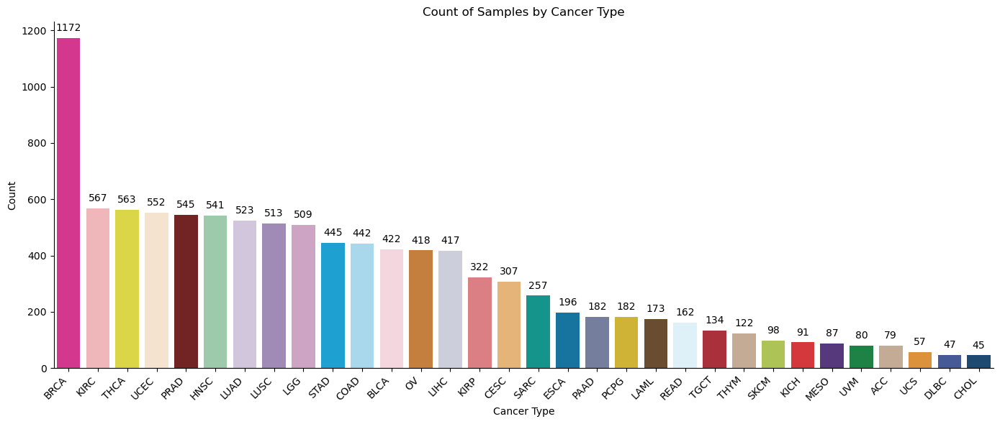

In [8]:
color_mapping = dict(zip(tcga_mrna['cancer_type'], tcga_mrna['color']))

primary_site_counts = tcga_mrna['cancer_type'].value_counts().reset_index()
primary_site_counts.columns = ['cancer_type', 'count']

# Create a bar plot
plt.figure(figsize=(14, 6))
barplot = sns.barplot(x='cancer_type', hue='cancer_type', y='count', data=primary_site_counts, palette=color_mapping)
plt.xlabel('Cancer Type')
plt.ylabel('Count')
plt.title('Count of Samples by Cancer Type')
plt.xticks(rotation=45, ha='right')  # Rotate the x labels to show them more clearly

# Annotate each bar with the count
for p in barplot.patches:
    barplot.annotate(format(p.get_height(), '.0f'),  # Format the count as a string with no decimal places
                     (p.get_x() + p.get_width() / 2., p.get_height()),  # Position the text at the center of the bar
                     ha='center', va='center',  # Center the text horizontally and vertically
                     xytext=(0, 10),  # Offset the text by 10 points vertically
                     textcoords='offset points')  # Use offset points for the text coordinates

plt.tight_layout()  # Adjust the layout to fit the x labels
sns.despine()
plt.show()

In [9]:
# shuffle the data
tcga_mrna = tcga_mrna.sample(frac=1, random_state=seed)
tcga_mirna = tcga_mirna.sample(frac=1, random_state=seed)

In [10]:
# make data split for train, validation, and test sets
train_ratio= 0.70
batch_size = 256
scaling_type = 'mean'

# Split data
train_mrna, val_mrna = train_test_split(tcga_mrna, train_size=train_ratio, stratify=tcga_mrna['cancer_type'], random_state=seed) 
val_mrna, test_mrna = train_test_split(val_mrna, test_size=0.50, stratify=val_mrna['cancer_type'], random_state=seed)

# Get the indices of the samples in each split
train_idx = train_mrna.index
val_idx = val_mrna.index
test_idx = test_mrna.index

# Use the same indices to split tcga_mirna
train_mirna = tcga_mirna.loc[train_idx]
val_mirna = tcga_mirna.loc[val_idx]
test_mirna = tcga_mirna.loc[test_idx]

# Default scaling_type = "mean"
train_dataset = GeneExpressionDatasetCombined(train_mrna, train_mirna, scaling_type=scaling_type)
validation_dataset = GeneExpressionDatasetCombined(val_mrna, val_mirna, scaling_type=scaling_type)
test_dataset = GeneExpressionDatasetCombined(test_mrna, test_mirna, scaling_type=scaling_type)

# Stratified Sampler
train_sampler = StratifiedBatchSampler(train_dataset.__getlabel__(), batch_size=batch_size)
validation_sampler = StratifiedBatchSampler(validation_dataset.__getlabel__(), batch_size=batch_size)
test_sampler = StratifiedBatchSampler(test_dataset.__getlabel__(), batch_size=batch_size)

# Data Loader
train_loader = torch.utils.data.DataLoader(train_dataset, 
                                           batch_size=batch_size,
                                           #batch_sampler=train_sampler,
                                           shuffle=True,
                                           num_workers=num_workers)
validation_loader = torch.utils.data.DataLoader(validation_dataset, 
                                                batch_size=batch_size, 
                                                #batch_sampler=validation_sampler,
                                                shuffle=False,
                                                num_workers=num_workers)
test_loader = torch.utils.data.DataLoader(test_dataset, 
                                          batch_size=batch_size, 
                                          #batch_sampler=test_sampler,
                                          shuffle=False,
                                          num_workers=num_workers)

In [11]:
# make data split for train and validation sets
mrna_out_dim = tcga_mrna.shape[1]-4
mirna_out_dim = tcga_mirna.shape[1]-4

In [12]:
print(train_dataset.mrna_data.shape)
print(validation_dataset.mrna_data.shape)
# print(test_dataset.mrna_data.shape)

print(train_dataset.mirna_data.shape)
print(validation_dataset.mirna_data.shape)
# print(test_dataset.mirna_data.shape)

print(mrna_out_dim)
print(mirna_out_dim)

torch.Size([7174, 19741])
torch.Size([1538, 19741])
torch.Size([7174, 2024])
torch.Size([1538, 2024])
19741
2024


In [13]:
n_tissues = len(np.unique(train_dataset.label))
n_tissues = 35
n_tissues

35

# Model Setup

In [14]:
# hyperparameters
latent_dim = 25
hidden_dims = [100, 100, 100]

fc_mirna_1 = 100
fc_mirna_2 = 128
fc_mrna_1 = 100
fc_mrna_2 = 128

activation = "leaky_relu"
reduction_type = "sum" # output loss reduction
r_init_mrna = 2
r_init_mirna = 2
pi_init = 0.5

In [15]:
# Decoder setup
big_mirna = True

# set up an output module for the miRNA expression data

if big_mirna:
    mirna_out_fc = nn.Sequential(
        nn.Linear(hidden_dims[-1], fc_mirna_1),
        get_activation(activation),
        nn.Linear(fc_mirna_1, fc_mirna_2),
        get_activation(activation),
        nn.Linear(fc_mirna_2, mirna_out_dim))
    output_mirna_layer = ZINB_Module(mirna_out_fc, mirna_out_dim, r_init=r_init_mirna, pi_init=pi_init, scaling_type=scaling_type)
    output_mirna_layer.n_features = mirna_out_dim
else:
    mirna_out_fc = nn.Sequential(
        nn.Linear(hidden_dims[-1], fc_mirna_2),
        get_activation(activation),
        nn.Linear(fc_mirna_2, mirna_out_dim))
    output_mirna_layer = ZINB_Module(mirna_out_fc, mirna_out_dim, r_init=r_init_mirna, pi_init=pi_init, scaling_type=scaling_type)
    output_mirna_layer.n_features = mirna_out_dim

# set up an output module for the mRNA expression data
mrna_out_fc = nn.Sequential(
    nn.Linear(hidden_dims[-1], fc_mrna_1),
    get_activation(activation),
    nn.Linear(fc_mrna_1, fc_mrna_2),
    get_activation(activation),
    nn.Linear(fc_mrna_2, mrna_out_dim))
output_mrna_layer = NB_Module(mrna_out_fc, mrna_out_dim, r_init=r_init_mrna, scaling_type=scaling_type)
output_mrna_layer.n_features = mrna_out_dim

# set up the decoder
decoder = Decoder(latent_dim, 
                  hidden_dims, 
                  output_module_mirna=output_mirna_layer, 
                  output_module_mrna=output_mrna_layer, 
                  activation=activation).to(device)

# setup gmm init
gmm_mean_scale = 5.0 # usually between 2 and 10
sd_mean_init = 0.4 * gmm_mean_scale / n_tissues # empirically good for single-cell data at dimensionality 20
gmm_spec = {"mean_init": (gmm_mean_scale, 5.0), "sd_init": (sd_mean_init, 1.0), "weight_alpha": 1}

In [16]:
# init a DGD model

dgd = DGD(
        decoder=decoder,
        n_mix=n_tissues,
        rep_dim=latent_dim,
        gmm_spec=gmm_spec
)

In [17]:
print(gmm_spec)

{'mean_init': (5.0, 5.0), 'sd_init': (0.05714285714285714, 1.0), 'weight_alpha': 1}


# Training

[1371, 1304, 34, 359]


  0%|                                                                                                    | 0/1500 [00:00<?, ?it/s]

0 train_loss: 22.825302634386425 train_loss_decoder: 18.427520152258502 train_recon_mirna: 7.447245278311365 train_recon_mrna: 10.980274873947138 train_gmm: 4.397782482127922 train_mse: 830888064.0 train_mae: 6467.33154296875 train_r2: -0.012075066566467285 train_spearman: 0.08595313131809235 train_pearson: 0.0370771624147892 train_msle: 45.011924743652344
0 test_loss: 21.88498821890129 test_loss_decoder: 18.325347035865576 test_recon_mirna: 7.367546902099827 test_recon_mrna: 10.957800133765751 test_gmm: 3.559641183035714 test_mse: 721403904.0 test_mae: 6106.1357421875 test_r2: -0.011992573738098145 test_spearman: 0.08105441182851791 test_pearson: 0.03079679235816002 test_msle: 44.944053649902344


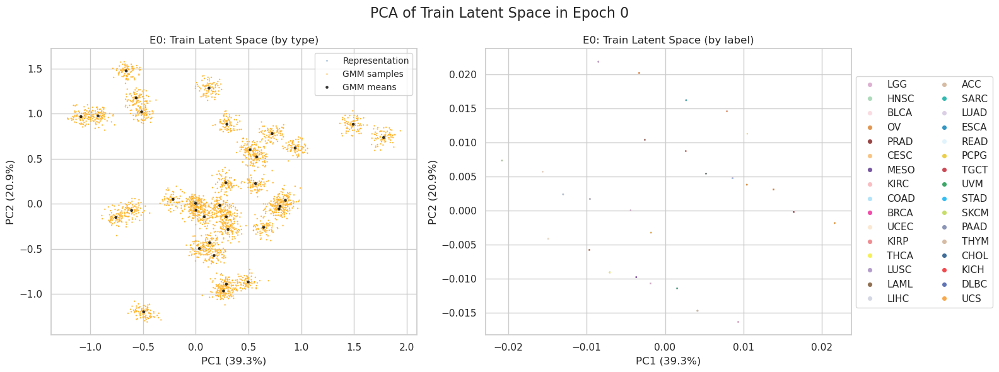

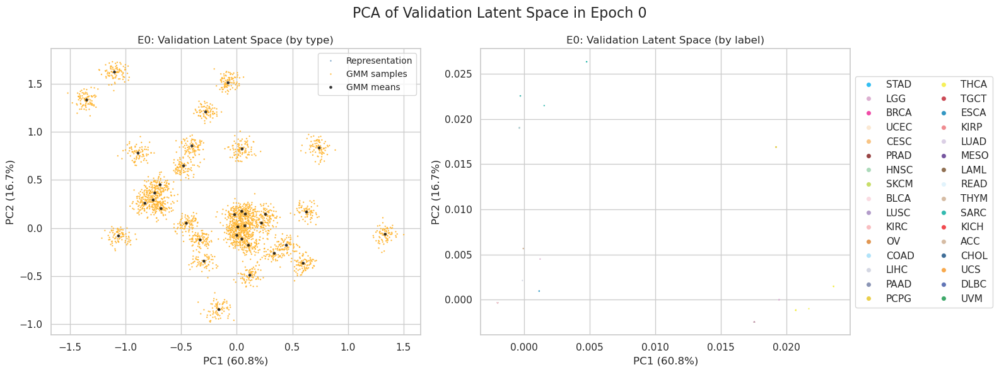

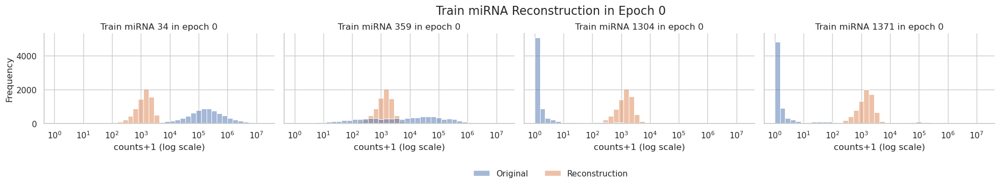

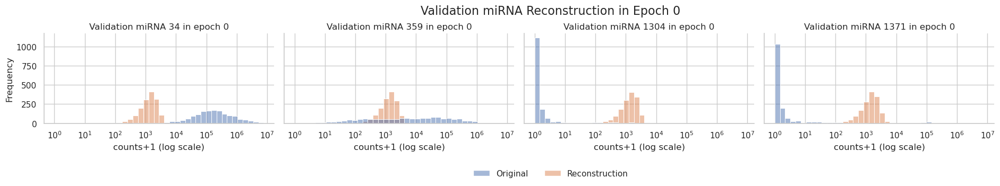

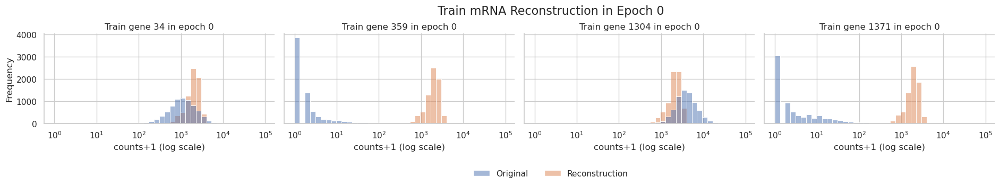

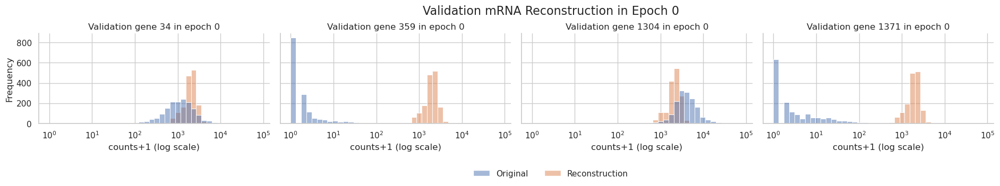

  0%|▎                                                                                         | 6/1500 [00:35<1:42:31,  4.12s/it]

5 train_loss: 19.130116999114293 train_loss_decoder: 17.020093107344906 train_recon_mirna: 6.718984516355036 train_recon_mrna: 10.301108590989868 train_gmm: 2.1100238917693854 train_mse: 828936832.0 train_mae: 6748.3720703125 train_r2: -0.00969839096069336 train_spearman: 0.08594740927219391 train_pearson: 0.037098828703165054 train_msle: 47.16643142700195
5 test_loss: 18.687681289073108 test_loss_decoder: 16.586195308178393 test_recon_mirna: 6.482934497907426 test_recon_mrna: 10.103260810270967 test_gmm: 2.101485980894715 test_mse: 719735552.0 test_mae: 6381.66845703125 test_r2: -0.009652137756347656 test_spearman: 0.08105242252349854 test_pearson: 0.030763158574700356 test_msle: 47.11125564575195


  1%|▋                                                                                        | 11/1500 [00:51<1:22:40,  3.33s/it]

10 train_loss: 14.311031441476445 train_loss_decoder: 12.218141408582362 train_recon_mirna: 3.86300232883713 train_recon_mrna: 8.355139079745232 train_gmm: 2.092890032894082 train_mse: 839024320.0 train_mae: 11897.1123046875 train_r2: -0.021985530853271484 train_spearman: 0.07853810489177704 train_pearson: 0.037306103855371475 train_msle: 66.30764770507812
10 test_loss: 13.847817706390074 test_loss_decoder: 11.754765414670192 test_recon_mirna: 3.5277291062446112 test_recon_mrna: 8.22703630842558 test_gmm: 2.093052291719882 test_mse: 732535936.0 test_mae: 11377.5478515625 test_r2: -0.027608752250671387 test_spearman: 0.06995325535535812 test_pearson: 0.027494443580508232 test_msle: 66.20140075683594


  1%|▉                                                                                        | 16/1500 [01:07<1:18:54,  3.19s/it]

15 train_loss: 12.452965486490598 train_loss_decoder: 10.35870591665259 train_recon_mirna: 2.6164158501117685 train_recon_mrna: 7.742290066540822 train_gmm: 2.094259569838006 train_mse: 981421184.0 train_mae: 18518.66796875 train_r2: -0.1954340934753418 train_spearman: 0.05772782862186432 train_pearson: 0.03573523089289665 train_msle: 77.01705169677734
15 test_loss: 12.393304315889653 test_loss_decoder: 10.298724819384452 test_recon_mirna: 2.579553743483393 test_recon_mrna: 7.719171075901059 test_gmm: 2.0945794965052014 test_mse: 867850816.0 test_mae: 17904.390625 test_r2: -0.2174297571182251 test_spearman: 0.0510508194565773 test_pearson: 0.033244986087083817 test_msle: 77.03731536865234


  1%|█▏                                                                                       | 21/1500 [01:23<1:19:29,  3.23s/it]

20 train_loss: 12.244694385050103 train_loss_decoder: 10.149604361925924 train_recon_mirna: 2.4696929489805255 train_recon_mrna: 7.6799114129453985 train_gmm: 2.0950900231241785 train_mse: 1007070528.0 train_mae: 19470.96484375 train_r2: -0.2266765832901001 train_spearman: 0.06519082188606262 train_pearson: 0.04997943341732025 train_msle: 78.17588806152344
20 test_loss: 12.233994680010545 test_loss_decoder: 10.138693052999004 test_recon_mirna: 2.468348380534147 test_recon_mrna: 7.670344672464857 test_gmm: 2.095301627011541 test_mse: 892670720.0 test_mae: 18828.03515625 test_r2: -0.25224733352661133 test_spearman: 0.05842890590429306 test_pearson: 0.04874545708298683 test_msle: 78.17687225341797


  2%|█▌                                                                                       | 26/1500 [01:40<1:19:55,  3.25s/it]

25 train_loss: 12.201901842475117 train_loss_decoder: 10.106901568668912 train_recon_mirna: 2.442541032538965 train_recon_mrna: 7.664360536129947 train_gmm: 2.095000273806205 train_mse: 980243648.0 train_mae: 18690.501953125 train_r2: -0.1939997673034668 train_spearman: 0.06631946563720703 train_pearson: 0.05118570104241371 train_msle: 77.25336456298828
25 test_loss: 12.192762692686882 test_loss_decoder: 10.097423389193825 test_recon_mirna: 2.441520803109757 test_recon_mrna: 7.655902586084067 test_gmm: 2.095339303493057 test_mse: 866665600.0 test_mae: 18058.25390625 test_r2: -0.21576714515686035 test_spearman: 0.060025185346603394 test_pearson: 0.050461847335100174 test_msle: 77.24836730957031


  2%|█▊                                                                                       | 31/1500 [01:56<1:17:45,  3.18s/it]

30 train_loss: 12.174219006487752 train_loss_decoder: 10.079288957594676 train_recon_mirna: 2.4258505740671636 train_recon_mrna: 7.653438383527512 train_gmm: 2.094930048893076 train_mse: 976038848.0 train_mae: 18561.91015625 train_r2: -0.18887805938720703 train_spearman: 0.06650060415267944 train_pearson: 0.05108769237995148 train_msle: 77.09954071044922
30 test_loss: 12.164169929145524 test_loss_decoder: 10.069102989895223 test_recon_mirna: 2.423678073953544 test_recon_mrna: 7.645424915941679 test_gmm: 2.095066939250302 test_mse: 862283456.0 test_mae: 17913.6328125 test_r2: -0.20961987972259521 test_spearman: 0.060263361781835556 test_pearson: 0.049566905945539474 test_msle: 77.07164001464844


  2%|██▏                                                                                      | 36/1500 [02:12<1:18:41,  3.23s/it]

35 train_loss: 12.15237383448245 train_loss_decoder: 10.057508264617063 train_recon_mirna: 2.4134696803466347 train_recon_mrna: 7.644038584270428 train_gmm: 2.094865569865387 train_mse: 972887744.0 train_mae: 18462.05859375 train_r2: -0.18503975868225098 train_spearman: 0.06665121763944626 train_pearson: 0.050935033708810806 train_msle: 76.97701263427734
35 test_loss: 12.14225146412021 test_loss_decoder: 10.047259400164528 test_recon_mirna: 2.41124637552997 test_recon_mrna: 7.636013024634557 test_gmm: 2.094992063955682 test_mse: 860350784.0 test_mae: 17849.53125 test_r2: -0.2069087028503418 test_spearman: 0.06072406470775604 test_pearson: 0.04928718879818916 test_msle: 76.99202728271484


  3%|██▍                                                                                      | 41/1500 [02:28<1:18:22,  3.22s/it]

40 train_loss: 12.134078525252907 train_loss_decoder: 10.039289938491187 train_recon_mirna: 2.40404169235793 train_recon_mrna: 7.635248246133258 train_gmm: 2.094788586761719 train_mse: 969493120.0 train_mae: 18359.21875 train_r2: -0.18090486526489258 train_spearman: 0.06728598475456238 train_pearson: 0.05114955082535744 train_msle: 76.85247039794922
40 test_loss: 12.123476567387291 test_loss_decoder: 10.02843408555792 test_recon_mirna: 2.401179313272428 test_recon_mrna: 7.627254772285492 test_gmm: 2.09504248182937 test_mse: 856563776.0 test_mae: 17720.427734375 test_r2: -0.20159626007080078 test_spearman: 0.06082652136683464 test_pearson: 0.0488511398434639 test_msle: 76.82831573486328


  3%|██▋                                                                                      | 46/1500 [02:44<1:16:54,  3.17s/it]

45 train_loss: 12.117456312130354 train_loss_decoder: 10.022732416129418 train_recon_mirna: 2.3958121578769087 train_recon_mrna: 7.62692025825251 train_gmm: 2.094723896000936 train_mse: 962875200.0 train_mae: 18156.55078125 train_r2: -0.1728438138961792 train_spearman: 0.06784804165363312 train_pearson: 0.05181213840842247 train_msle: 76.60182189941406
45 test_loss: 12.104918470253295 test_loss_decoder: 10.010151672580065 test_recon_mirna: 2.3911748418763525 test_recon_mrna: 7.618976830703712 test_gmm: 2.0947667976732305 test_mse: 853377152.0 test_mae: 17616.134765625 test_r2: -0.19712603092193604 test_spearman: 0.061686962842941284 test_pearson: 0.04853224381804466 test_msle: 76.69572448730469


  3%|███                                                                                      | 51/1500 [03:00<1:16:31,  3.17s/it]

50 train_loss: 12.10207134906876 train_loss_decoder: 10.007338598859672 train_recon_mirna: 2.3884391567894907 train_recon_mrna: 7.618899442070181 train_gmm: 2.0947327502090882 train_mse: 962505024.0 train_mae: 18126.484375 train_r2: -0.17239296436309814 train_spearman: 0.06802478432655334 train_pearson: 0.05039503425359726 train_msle: 76.5624008178711
50 test_loss: 12.088826455558003 test_loss_decoder: 9.994177389270037 test_recon_mirna: 2.3831125688392816 test_recon_mrna: 7.611064820430755 test_gmm: 2.0946490662879667 test_mse: 851448384.0 test_mae: 17561.40234375 test_r2: -0.19442033767700195 test_spearman: 0.06255534291267395 test_pearson: 0.049085117876529694 test_msle: 76.6294937133789


  4%|███▎                                                                                     | 56/1500 [03:16<1:17:12,  3.21s/it]

55 train_loss: 12.087531080075989 train_loss_decoder: 9.992674527769047 train_recon_mirna: 2.38138749454014 train_recon_mrna: 7.611287033228907 train_gmm: 2.0948565523069416 train_mse: 964069120.0 train_mae: 18184.9296875 train_r2: -0.17429816722869873 train_spearman: 0.06924944370985031 train_pearson: 0.0507480762898922 train_msle: 76.63935089111328
55 test_loss: 12.073250343130095 test_loss_decoder: 9.97862819898127 test_recon_mirna: 2.3751918342330067 test_recon_mrna: 7.603436364748262 test_gmm: 2.094622144148825 test_mse: 853711808.0 test_mae: 17653.095703125 test_r2: -0.197595477104187 test_spearman: 0.06365258246660233 test_pearson: 0.05015822872519493 test_msle: 76.75284576416016


  4%|███▌                                                                                     | 61/1500 [03:32<1:17:26,  3.23s/it]

60 train_loss: 12.07051239530297 train_loss_decoder: 9.975126165670417 train_recon_mirna: 2.371491686459026 train_recon_mrna: 7.603634479211391 train_gmm: 2.095386229632552 train_mse: 962056768.0 train_mae: 18112.84375 train_r2: -0.17184698581695557 train_spearman: 0.07054419070482254 train_pearson: 0.05066295340657234 train_msle: 76.5438461303711
60 test_loss: 12.05775688433343 test_loss_decoder: 9.962923221246223 test_recon_mirna: 2.366798186259662 test_recon_mrna: 7.596125034986561 test_gmm: 2.0948336630872073 test_mse: 847854656.0 test_mae: 17438.30859375 test_r2: -0.18937897682189941 test_spearman: 0.06456315517425537 test_pearson: 0.04845248907804489 test_msle: 76.47688293457031


  4%|███▉                                                                                     | 66/1500 [03:48<1:16:52,  3.22s/it]

65 train_loss: 12.045250327951063 train_loss_decoder: 9.94849120662629 train_recon_mirna: 2.3523779087737124 train_recon_mrna: 7.596113297852577 train_gmm: 2.096759121324774 train_mse: 966964416.0 train_mae: 18160.62890625 train_r2: -0.1778247356414795 train_spearman: 0.07211796939373016 train_pearson: 0.04504210501909256 train_msle: 76.55641174316406
65 test_loss: 12.04144231105462 test_loss_decoder: 9.945837231442008 test_recon_mirna: 2.3569273831639594 test_recon_mrna: 7.588909848278049 test_gmm: 2.0956050796126116 test_mse: 850245632.0 test_mae: 17500.376953125 test_r2: -0.1927330493927002 test_spearman: 0.06649388372898102 test_pearson: 0.0461057685315609 test_msle: 76.56153106689453


  5%|████▏                                                                                    | 71/1500 [04:04<1:15:51,  3.19s/it]

70 train_loss: 11.999491194978626 train_loss_decoder: 9.90165009778738 train_recon_mirna: 2.3134190261795036 train_recon_mrna: 7.5882310716078765 train_gmm: 2.097841097191246 train_mse: 996721728.0 train_mae: 18691.849609375 train_r2: -0.2140711545944214 train_spearman: 0.07494606822729111 train_pearson: 0.031985804438591 train_msle: 76.96566772460938
70 test_loss: 12.028877388479923 test_loss_decoder: 9.930041882750078 test_recon_mirna: 2.348820093495355 test_recon_mrna: 7.581221789254724 test_gmm: 2.098835505729844 test_mse: 862960128.0 test_mae: 17844.53125 test_r2: -0.21056914329528809 test_spearman: 0.06993579119443893 test_pearson: 0.039559826254844666 test_msle: 76.98863983154297


  5%|████▍                                                                                    | 75/1500 [04:16<1:15:44,  3.19s/it]

75 train_loss: 11.975673489410136 train_loss_decoder: 9.87731894584508 train_recon_mirna: 2.296840068540664 train_recon_mrna: 7.580478877304415 train_gmm: 2.0983545435650566 train_mse: 1025707968.0 train_mae: 19315.814453125 train_r2: -0.24937820434570312 train_spearman: 0.07180614769458771 train_pearson: 0.028222808614373207 train_msle: 77.5431900024414
75 test_loss: 12.021013542780647 test_loss_decoder: 9.923403656913102 test_recon_mirna: 2.349635933984401 test_recon_mrna: 7.573767722928702 test_gmm: 2.097609885867546 test_mse: 877486976.0 test_mae: 18202.38671875 test_r2: -0.23094749450683594 test_spearman: 0.06889170408248901 test_pearson: 0.03287648782134056 test_msle: 77.39642333984375


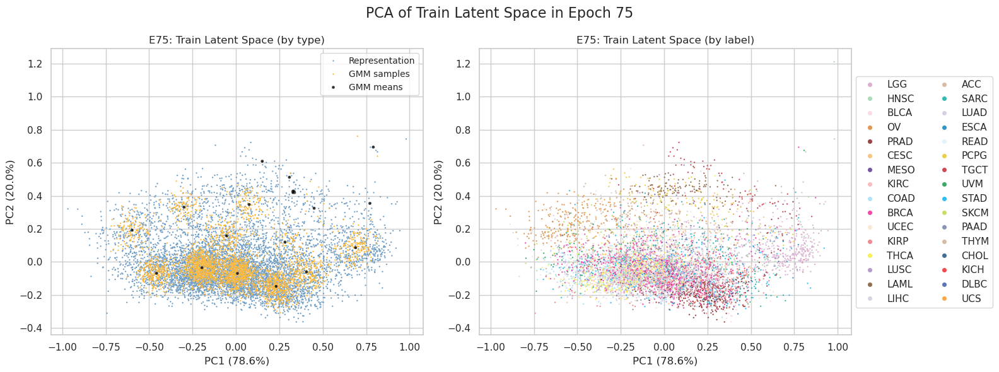

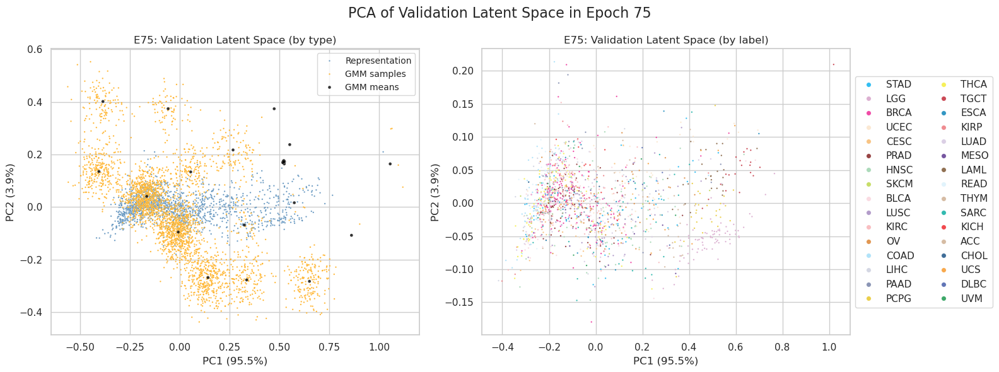

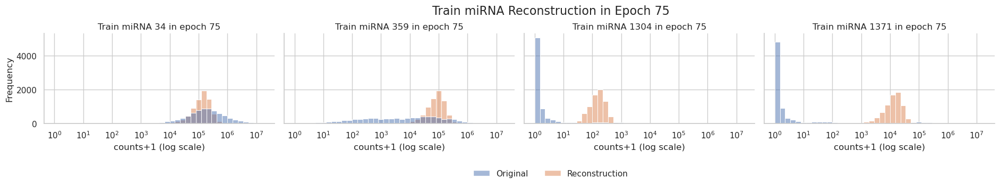

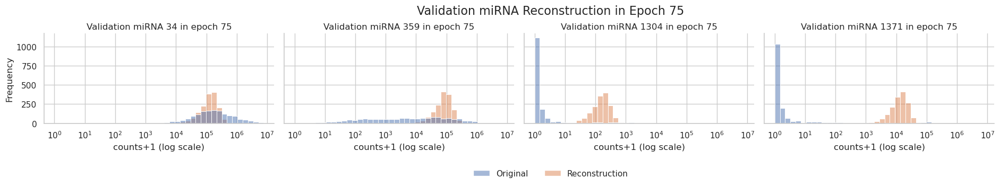

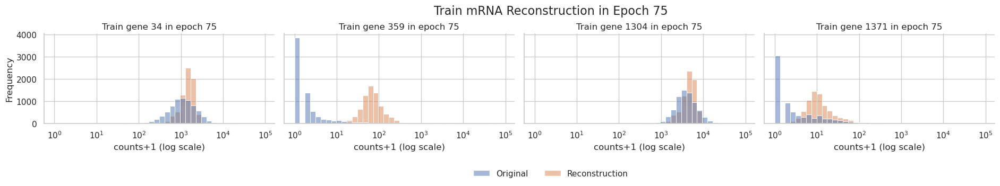

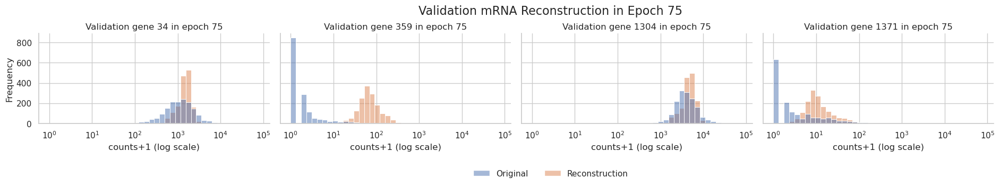

  5%|████▊                                                                                    | 81/1500 [04:51<1:35:40,  4.05s/it]

80 train_loss: 11.960263950664947 train_loss_decoder: 9.861779487922504 train_recon_mirna: 2.290732997517988 train_recon_mrna: 7.571046490404516 train_gmm: 2.098484462742443 train_mse: 1037460800.0 train_mae: 19501.68359375 train_r2: -0.2636939287185669 train_spearman: 0.06909740716218948 train_pearson: 0.02337074838578701 train_msle: 77.69538116455078
80 test_loss: 12.01586905368024 test_loss_decoder: 9.918200564991892 test_recon_mirna: 2.3543699496644943 test_recon_mrna: 7.563830615327397 test_gmm: 2.0976684886883477 test_mse: 882868800.0 test_mae: 18189.623046875 test_r2: -0.23849713802337646 test_spearman: 0.06824760884046555 test_pearson: 0.023813702166080475 test_msle: 77.29037475585938


  6%|█████                                                                                    | 86/1500 [05:07<1:18:55,  3.35s/it]

85 train_loss: 11.94417170570561 train_loss_decoder: 9.845516120463516 train_recon_mirna: 2.2941998903801166 train_recon_mrna: 7.551316230083399 train_gmm: 2.0986555852420943 train_mse: 1060111168.0 train_mae: 19862.279296875 train_r2: -0.2912834882736206 train_spearman: 0.06726047396659851 train_pearson: 0.012088190764188766 train_msle: 78.03108978271484
85 test_loss: 12.01106598535593 test_loss_decoder: 9.912564975050048 test_recon_mirna: 2.3721985921436866 test_recon_mrna: 7.540366382906361 test_gmm: 2.098501010305882 test_mse: 912978176.0 test_mae: 18652.26953125 test_r2: -0.2807348966598511 test_spearman: 0.06584446132183075 test_pearson: 0.0036136717535555363 test_msle: 77.63041687011719


  6%|█████▍                                                                                   | 91/1500 [05:24<1:15:45,  3.23s/it]

90 train_loss: 11.906196007215577 train_loss_decoder: 9.807016032841348 train_recon_mirna: 2.3104768416557504 train_recon_mrna: 7.496539191185597 train_gmm: 2.0991799743742283 train_mse: 1072076992.0 train_mae: 20293.392578125 train_r2: -0.3058586120605469 train_spearman: 0.06686615198850632 train_pearson: 0.010768420994281769 train_msle: 78.66160583496094
90 test_loss: 11.937845395523388 test_loss_decoder: 9.838625787425556 test_recon_mirna: 2.3595246471403324 test_recon_mrna: 7.479101140285224 test_gmm: 2.099219608097831 test_mse: 949505920.0 test_mae: 19522.0234375 test_r2: -0.33197641372680664 test_spearman: 0.06236600503325462 test_pearson: 0.0016046817181631923 test_msle: 78.5411605834961


  6%|█████▋                                                                                   | 96/1500 [05:39<1:14:41,  3.19s/it]

95 train_loss: 11.845414790332606 train_loss_decoder: 9.745619347525745 train_recon_mirna: 2.3194757381255227 train_recon_mrna: 7.426143609400222 train_gmm: 2.099795442806862 train_mse: 1044002432.0 train_mae: 19878.78125 train_r2: -0.27166199684143066 train_spearman: 0.0656629279255867 train_pearson: 0.01863226853311062 train_msle: 78.36625671386719
95 test_loss: 11.842260360652487 test_loss_decoder: 9.741774014385884 test_recon_mirna: 2.3319137454736913 test_recon_mrna: 7.409860268912192 test_gmm: 2.100486346266603 test_mse: 928911168.0 test_mae: 19228.755859375 test_r2: -0.30308592319488525 test_spearman: 0.05765770748257637 test_pearson: 0.010301563888788223 test_msle: 78.3264389038086


  7%|█████▉                                                                                  | 101/1500 [05:56<1:15:05,  3.22s/it]

100 train_loss: 11.784112074563838 train_loss_decoder: 9.684048935475264 train_recon_mirna: 2.31860235412156 train_recon_mrna: 7.365446581353705 train_gmm: 2.100063139088574 train_mse: 1037175936.0 train_mae: 19793.0390625 train_r2: -0.26334691047668457 train_spearman: 0.06332440674304962 train_pearson: 0.021669907495379448 train_msle: 78.3211898803711
100 test_loss: 11.774314281246967 test_loss_decoder: 9.673730660611112 test_recon_mirna: 2.3227664218498427 test_recon_mrna: 7.350964238761269 test_gmm: 2.100583620635856 test_mse: 922243584.0 test_mae: 19157.552734375 test_r2: -0.2937324047088623 test_spearman: 0.05525066331028938 test_pearson: 0.014235123991966248 test_msle: 78.3206787109375


  7%|██████▏                                                                                 | 106/1500 [06:11<1:14:24,  3.20s/it]

105 train_loss: 11.723575324535268 train_loss_decoder: 9.623452461779383 train_recon_mirna: 2.307162134798676 train_recon_mrna: 7.316290326980706 train_gmm: 2.1001228627558843 train_mse: 1021510144.0 train_mae: 19488.65234375 train_r2: -0.24426496028900146 train_spearman: 0.06400885432958603 train_pearson: 0.027988960966467857 train_msle: 78.02336120605469
105 test_loss: 11.710484355924795 test_loss_decoder: 9.609785821113235 test_recon_mirna: 2.30602653695293 test_recon_mrna: 7.303759284160305 test_gmm: 2.1006985348115594 test_mse: 907950144.0 test_mae: 18867.02734375 test_r2: -0.27368152141571045 test_spearman: 0.05519270896911621 test_pearson: 0.021865924820303917 test_msle: 78.0336685180664


  7%|██████▌                                                                                 | 111/1500 [06:27<1:13:46,  3.19s/it]

110 train_loss: 11.672482742517607 train_loss_decoder: 9.572327949602219 train_recon_mirna: 2.293088840443463 train_recon_mrna: 7.279239109158755 train_gmm: 2.1001547929153888 train_mse: 966759424.0 train_mae: 18248.54296875 train_r2: -0.17757511138916016 train_spearman: 0.06719490885734558 train_pearson: 0.05064431205391884 train_msle: 76.67252349853516
110 test_loss: 11.657657924376704 test_loss_decoder: 9.557144841196727 test_recon_mirna: 2.289549001239635 test_recon_mrna: 7.267595839957093 test_gmm: 2.100513083179976 test_mse: 855951488.0 test_mae: 17648.365234375 test_r2: -0.20073723793029785 test_spearman: 0.05726046487689018 test_pearson: 0.04690418019890785 test_msle: 76.67863464355469


  8%|██████▊                                                                                 | 116/1500 [06:43<1:13:00,  3.16s/it]

115 train_loss: 11.629357407794862 train_loss_decoder: 9.529210034716483 train_recon_mirna: 2.283702478397559 train_recon_mrna: 7.245507556318924 train_gmm: 2.100147373078378 train_mse: 890905600.0 train_mae: 16057.5224609375 train_r2: -0.08518028259277344 train_spearman: 0.07139423489570618 train_pearson: 0.09055759757757187 train_msle: 73.87002563476562
115 test_loss: 11.61480616487906 test_loss_decoder: 9.514337325803787 test_recon_mirna: 2.2796044453563495 test_recon_mrna: 7.234732880447438 test_gmm: 2.1004688390752717 test_mse: 785825408.0 test_mae: 15545.1181640625 test_r2: -0.1023637056350708 test_spearman: 0.061050958931446075 test_pearson: 0.08574238419532776 test_msle: 73.94424438476562


  8%|███████                                                                                 | 121/1500 [06:59<1:14:19,  3.23s/it]

120 train_loss: 11.592867663005208 train_loss_decoder: 9.492672278475508 train_recon_mirna: 2.276538241109517 train_recon_mrna: 7.2161340373659915 train_gmm: 2.1001953845297003 train_mse: 824192512.0 train_mae: 13229.2490234375 train_r2: -0.003919482231140137 train_spearman: 0.06495066732168198 train_pearson: 0.14904950559139252 train_msle: 69.17772674560547
120 test_loss: 11.579374872854999 test_loss_decoder: 9.47885047058454 test_recon_mirna: 2.2722999381663174 test_recon_mrna: 7.206550532418223 test_gmm: 2.100524402270458 test_mse: 720484864.0 test_mae: 12669.4716796875 test_r2: -0.010703325271606445 test_spearman: 0.057447995990514755 test_pearson: 0.14386151731014252 test_msle: 69.08332824707031


  8%|███████▍                                                                                | 126/1500 [07:15<1:12:54,  3.18s/it]

125 train_loss: 11.562325562166889 train_loss_decoder: 9.462062291277965 train_recon_mirna: 2.269634081322861 train_recon_mrna: 7.1924282099551045 train_gmm: 2.100263270888924 train_mse: 784659968.0 train_mae: 10126.8623046875 train_r2: 0.044233739376068115 train_spearman: 0.054210830479860306 train_pearson: 0.22676333785057068 train_msle: 60.82997512817383
125 test_loss: 11.550831346703434 test_loss_decoder: 9.450304861414098 test_recon_mirna: 2.266340254845182 test_recon_mrna: 7.1839646065689164 test_gmm: 2.1005264852893366 test_mse: 682470080.0 test_mae: 9698.490234375 test_r2: 0.04262417554855347 test_spearman: 0.04647478461265564 test_pearson: 0.22056274116039276 test_msle: 60.938072204589844


  9%|███████▋                                                                                | 131/1500 [07:31<1:12:51,  3.19s/it]

130 train_loss: 11.53412618126288 train_loss_decoder: 9.433789314844216 train_recon_mirna: 2.262101757339882 train_recon_mrna: 7.171687557504334 train_gmm: 2.100336866418665 train_mse: 772337280.0 train_mae: 8048.57373046875 train_r2: 0.05924355983734131 train_spearman: 0.050413284450769424 train_pearson: 0.32115867733955383 train_msle: 51.565040588378906
130 test_loss: 11.521721264979348 test_loss_decoder: 9.421242718513623 test_recon_mirna: 2.2572562338987177 test_recon_mrna: 7.163986484614905 test_gmm: 2.1004785464657254 test_mse: 669860160.0 test_mae: 7635.8515625 test_r2: 0.06031346321105957 test_spearman: 0.04305887967348099 test_pearson: 0.3124223053455353 test_msle: 51.54901885986328


  9%|███████▉                                                                                | 136/1500 [07:47<1:10:47,  3.11s/it]

135 train_loss: 11.507294758604097 train_loss_decoder: 9.40685717583995 train_recon_mirna: 2.2543564304398753 train_recon_mrna: 7.152500745400073 train_gmm: 2.1004375827641484 train_mse: 764718528.0 train_mae: 7344.69091796875 train_r2: 0.06852370500564575 train_spearman: 0.04171992465853691 train_pearson: 0.38171738386154175 train_msle: 46.50164031982422
135 test_loss: 11.497356873130915 test_loss_decoder: 9.396739592383074 test_recon_mirna: 2.250488340228137 test_recon_mrna: 7.146251252154938 test_gmm: 2.1006172807478403 test_mse: 662286208.0 test_mae: 6955.8310546875 test_r2: 0.07093828916549683 test_spearman: 0.036516349762678146 test_pearson: 0.37448492646217346 test_msle: 46.645652770996094


  9%|████████▎                                                                               | 141/1500 [08:03<1:12:44,  3.21s/it]

140 train_loss: 11.481189348648051 train_loss_decoder: 9.38060429666221 train_recon_mirna: 2.2460147580812726 train_recon_mrna: 7.134589538580937 train_gmm: 2.1005850519858416 train_mse: 753588032.0 train_mae: 7172.72314453125 train_r2: 0.0820813775062561 train_spearman: 0.03944144770503044 train_pearson: 0.4224543273448944 train_msle: 44.45234298706055
140 test_loss: 11.47263700857747 test_loss_decoder: 9.371775959107495 test_recon_mirna: 2.2436152076014357 test_recon_mrna: 7.12816075150606 test_gmm: 2.100861049469975 test_mse: 652438912.0 test_mae: 6770.9130859375 test_r2: 0.08475220203399658 test_spearman: 0.03606630489230156 test_pearson: 0.4136664569377899 test_msle: 44.369476318359375


 10%|████████▌                                                                               | 146/1500 [08:19<1:12:43,  3.22s/it]

145 train_loss: 11.455389811140586 train_loss_decoder: 9.354568310072741 train_recon_mirna: 2.236467264368903 train_recon_mrna: 7.118101045703838 train_gmm: 2.1008215010678444 train_mse: 743874624.0 train_mae: 7037.787109375 train_r2: 0.09391295909881592 train_spearman: 0.0398150272667408 train_pearson: 0.4565235376358032 train_msle: 42.88788986206055
145 test_loss: 11.448819446252447 test_loss_decoder: 9.347967031459929 test_recon_mirna: 2.2357146955944103 test_recon_mrna: 7.112252335865518 test_gmm: 2.1008524147925183 test_mse: 643901312.0 test_mae: 6663.15234375 test_r2: 0.09672880172729492 test_spearman: 0.0360347181558609 test_pearson: 0.4442465901374817 test_msle: 43.0518684387207


 10%|████████▊                                                                               | 150/1500 [08:32<1:11:57,  3.20s/it]

150 train_loss: 11.429693758435148 train_loss_decoder: 9.328607866984374 train_recon_mirna: 2.225368312915723 train_recon_mrna: 7.103239554068652 train_gmm: 2.1010858914507744 train_mse: 729589440.0 train_mae: 6756.17138671875 train_r2: 0.11131316423416138 train_spearman: 0.042126622051000595 train_pearson: 0.5163864493370056 train_msle: 40.539466857910156
150 test_loss: 11.427594772746497 test_loss_decoder: 9.326569695245569 test_recon_mirna: 2.22832571100729 test_recon_mrna: 7.0982439842382785 test_gmm: 2.1010250775009287 test_mse: 630281792.0 test_mae: 6328.3330078125 test_r2: 0.11583441495895386 test_spearman: 0.039410270750522614 test_pearson: 0.511186420917511 test_msle: 40.179931640625


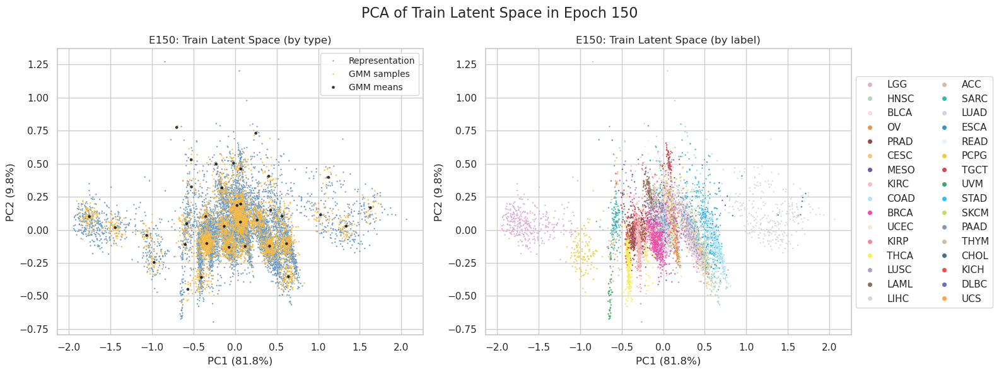

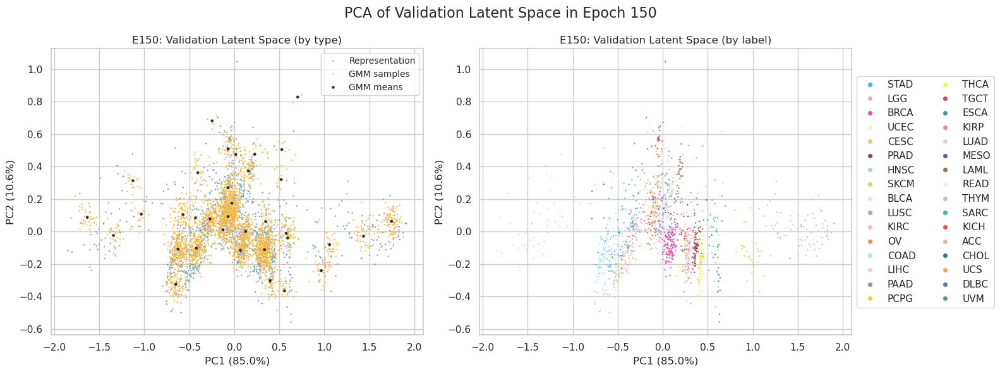

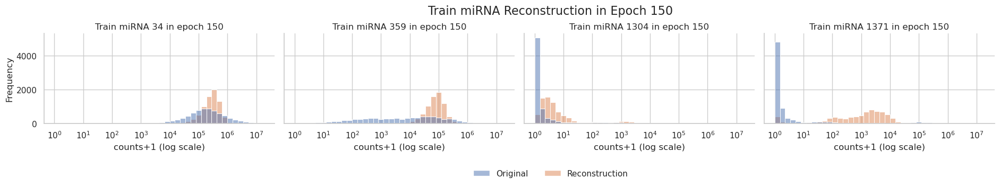

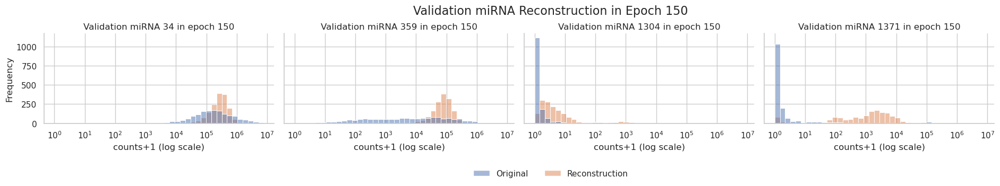

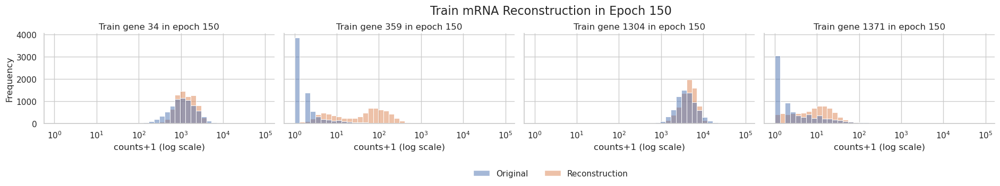

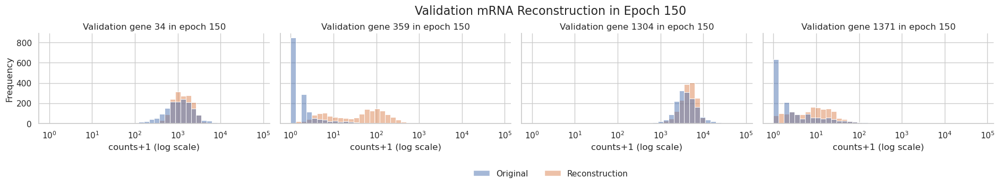

 10%|█████████▏                                                                              | 156/1500 [09:08<1:32:43,  4.14s/it]

155 train_loss: 11.401632023863103 train_loss_decoder: 9.300197653810283 train_recon_mirna: 2.2106835862012364 train_recon_mrna: 7.089514067609047 train_gmm: 2.1014343700528197 train_mse: 718618816.0 train_mae: 6538.5009765625 train_r2: 0.12467610836029053 train_spearman: 0.042721204459667206 train_pearson: 0.5557993650436401 train_msle: 38.55238723754883
155 test_loss: 11.40809111928239 test_loss_decoder: 9.306726784549493 test_recon_mirna: 2.2209826755650637 test_recon_mrna: 7.08574410898443 test_gmm: 2.1013643347328976 test_mse: 620888576.0 test_mae: 6195.9052734375 test_r2: 0.129011332988739 test_spearman: 0.037047456949949265 test_pearson: 0.5383618474006653 test_msle: 38.70513153076172


 11%|█████████▍                                                                              | 161/1500 [09:24<1:17:27,  3.47s/it]

160 train_loss: 11.371249782770162 train_loss_decoder: 9.269405928225975 train_recon_mirna: 2.1928525710320246 train_recon_mrna: 7.07655335719395 train_gmm: 2.1018438545441875 train_mse: 709404096.0 train_mae: 6392.2138671875 train_r2: 0.13590025901794434 train_spearman: 0.04230806976556778 train_pearson: 0.5837082266807556 train_msle: 37.20536804199219
160 test_loss: 11.386859036365486 test_loss_decoder: 9.285063853977064 test_recon_mirna: 2.211996079442155 test_recon_mrna: 7.073067774534908 test_gmm: 2.101795182388422 test_mse: 612411328.0 test_mae: 6026.53515625 test_r2: 0.1409032940864563 test_spearman: 0.0370178185403347 test_pearson: 0.5695374608039856 test_msle: 37.271636962890625


 11%|█████████▋                                                                              | 166/1500 [09:41<1:13:44,  3.32s/it]

165 train_loss: 11.34247123969439 train_loss_decoder: 9.240131135828495 train_recon_mirna: 2.176526779175662 train_recon_mrna: 7.063604356652833 train_gmm: 2.102340103865895 train_mse: 700512448.0 train_mae: 6246.78759765625 train_r2: 0.14673078060150146 train_spearman: 0.041089363396167755 train_pearson: 0.6108291745185852 train_msle: 35.9610481262207
165 test_loss: 11.36899020330905 test_loss_decoder: 9.266518557183515 test_recon_mirna: 2.206022819228427 test_recon_mrna: 7.060495737955088 test_gmm: 2.102471646125534 test_mse: 604421888.0 test_mae: 5899.119140625 test_r2: 0.15211093425750732 test_spearman: 0.03605802357196808 test_pearson: 0.5910081267356873 test_msle: 35.94839859008789


 11%|██████████                                                                              | 171/1500 [09:57<1:12:53,  3.29s/it]

170 train_loss: 11.320373374580088 train_loss_decoder: 9.217659014969241 train_recon_mirna: 2.167028671755597 train_recon_mrna: 7.050630343213644 train_gmm: 2.1027143596108466 train_mse: 690240832.0 train_mae: 6096.47265625 train_r2: 0.15924233198165894 train_spearman: 0.03973774239420891 train_pearson: 0.6382880806922913 train_msle: 34.581459045410156
170 test_loss: 11.353595743460067 test_loss_decoder: 9.251032571495085 test_recon_mirna: 2.20272346523679 test_recon_mrna: 7.048309106258294 test_gmm: 2.102563171964982 test_mse: 595620928.0 test_mae: 5785.26416015625 test_r2: 0.1644570231437683 test_spearman: 0.03393610566854477 test_pearson: 0.6136605739593506 test_msle: 34.883121490478516


 12%|██████████▎                                                                             | 176/1500 [10:14<1:12:18,  3.28s/it]

175 train_loss: 11.300270965823119 train_loss_decoder: 9.197271970349632 train_recon_mirna: 2.159485659385258 train_recon_mrna: 7.037786310964374 train_gmm: 2.102998995473486 train_mse: 677241472.0 train_mae: 6023.67724609375 train_r2: 0.17507630586624146 train_spearman: 0.03805976361036301 train_pearson: 0.6532694697380066 train_msle: 33.72610855102539
175 test_loss: 11.335033652764164 test_loss_decoder: 9.23217454589706 test_recon_mirna: 2.1967908042548867 test_recon_mrna: 7.035383741642172 test_gmm: 2.102859106867105 test_mse: 583111360.0 test_mae: 5694.8154296875 test_r2: 0.18200552463531494 test_spearman: 0.03308767452836037 test_pearson: 0.6282077431678772 test_msle: 33.710445404052734


 12%|██████████▌                                                                             | 181/1500 [10:30<1:11:51,  3.27s/it]

180 train_loss: 11.281297028678363 train_loss_decoder: 9.178111856964536 train_recon_mirna: 2.1527828373085836 train_recon_mrna: 7.025329019655953 train_gmm: 2.103185171713828 train_mse: 665118976.0 train_mae: 6007.5068359375 train_r2: 0.18984228372573853 train_spearman: 0.0357513353228569 train_pearson: 0.6550219058990479 train_msle: 33.03800582885742
180 test_loss: 11.318221507417944 test_loss_decoder: 9.215115828588178 test_recon_mirna: 2.1920298415268005 test_recon_mrna: 7.023085987061378 test_gmm: 2.103105678829765 test_mse: 573520512.0 test_mae: 5674.90234375 test_r2: 0.19545972347259521 test_spearman: 0.029882535338401794 test_pearson: 0.629006028175354 test_msle: 32.981964111328125


 12%|██████████▉                                                                             | 186/1500 [10:46<1:11:40,  3.27s/it]

185 train_loss: 11.263136908031049 train_loss_decoder: 9.159807624332972 train_recon_mirna: 2.1464546375526887 train_recon_mrna: 7.013352986780283 train_gmm: 2.1033292836980766 train_mse: 652141760.0 train_mae: 5980.93408203125 train_r2: 0.20564943552017212 train_spearman: 0.03416956588625908 train_pearson: 0.6596407890319824 train_msle: 32.37251281738281
185 test_loss: 11.302007990644062 test_loss_decoder: 9.198944897957887 test_recon_mirna: 2.1873171218166765 test_recon_mrna: 7.011627776141211 test_gmm: 2.103063092686176 test_mse: 562235328.0 test_mae: 5634.7138671875 test_r2: 0.21129071712493896 test_spearman: 0.02660464309155941 test_pearson: 0.6362960934638977 test_msle: 32.29770278930664


 13%|███████████▏                                                                            | 191/1500 [11:02<1:10:12,  3.22s/it]

190 train_loss: 11.245883663078931 train_loss_decoder: 9.142474402144106 train_recon_mirna: 2.140511747563356 train_recon_mrna: 7.001962654580751 train_gmm: 2.103409260934824 train_mse: 641217792.0 train_mae: 5894.013671875 train_r2: 0.21895551681518555 train_spearman: 0.03367377817630768 train_pearson: 0.6680576801300049 train_msle: 31.1412296295166
190 test_loss: 11.284816925202865 test_loss_decoder: 9.181095411873866 test_recon_mirna: 2.180735051942271 test_recon_mrna: 7.000360359931595 test_gmm: 2.1037215133289986 test_mse: 552974592.0 test_mae: 5582.1328125 test_r2: 0.22428172826766968 test_spearman: 0.025818457826972008 test_pearson: 0.6396999955177307 test_msle: 31.143123626708984


 13%|███████████▍                                                                            | 196/1500 [11:19<1:10:08,  3.23s/it]

195 train_loss: 11.229432293671987 train_loss_decoder: 9.12596968891 train_recon_mirna: 2.1350472596555043 train_recon_mrna: 6.990922429254496 train_gmm: 2.1034626047619875 train_mse: 627617408.0 train_mae: 5963.38037109375 train_r2: 0.2355216145515442 train_spearman: 0.032030533999204636 train_pearson: 0.6622745990753174 train_msle: 31.406301498413086
195 test_loss: 11.26859386859288 test_loss_decoder: 9.164772545786999 test_recon_mirna: 2.1749204640923834 test_recon_mrna: 6.989852081694616 test_gmm: 2.103821322805882 test_mse: 540789056.0 test_mae: 5664.18994140625 test_r2: 0.24137574434280396 test_spearman: 0.024400092661380768 test_pearson: 0.6345626711845398 test_msle: 31.609460830688477


 13%|███████████▊                                                                            | 201/1500 [11:35<1:10:52,  3.27s/it]

200 train_loss: 11.214050749129825 train_loss_decoder: 9.110399085383758 train_recon_mirna: 2.1303747398081643 train_recon_mrna: 6.980024345575594 train_gmm: 2.103651663746067 train_mse: 614066752.0 train_mae: 5967.9853515625 train_r2: 0.2520272135734558 train_spearman: 0.03264139965176582 train_pearson: 0.6624497771263123 train_msle: 30.902841567993164
200 test_loss: 11.252345691605788 test_loss_decoder: 9.148107315293787 test_recon_mirna: 2.1692155951841676 test_recon_mrna: 6.97889172010962 test_gmm: 2.1042383763120007 test_mse: 528954784.0 test_mae: 5651.90966796875 test_r2: 0.2579769492149353 test_spearman: 0.023877926170825958 test_pearson: 0.6379939913749695 test_msle: 30.953962326049805


 14%|████████████                                                                            | 206/1500 [11:51<1:11:33,  3.32s/it]

205 train_loss: 11.199558239356119 train_loss_decoder: 9.095659803100691 train_recon_mirna: 2.1268619966818068 train_recon_mrna: 6.968797806418884 train_gmm: 2.1038984362554265 train_mse: 601888576.0 train_mae: 5956.49755859375 train_r2: 0.2668610215187073 train_spearman: 0.03470301628112793 train_pearson: 0.6650908589363098 train_msle: 30.737850189208984
205 test_loss: 11.235727072043984 test_loss_decoder: 9.131229264638145 test_recon_mirna: 2.1631363639638805 test_recon_mrna: 6.9680929006742645 test_gmm: 2.104497807405838 test_mse: 519932032.0 test_mae: 5702.408203125 test_r2: 0.27063417434692383 test_spearman: 0.02532174251973629 test_pearson: 0.6364215612411499 test_msle: 30.98055076599121


 14%|████████████▍                                                                           | 211/1500 [12:08<1:10:53,  3.30s/it]

210 train_loss: 11.185482581970907 train_loss_decoder: 9.081223334166335 train_recon_mirna: 2.1245691375077858 train_recon_mrna: 6.9566541966585485 train_gmm: 2.104259247804572 train_mse: 590781824.0 train_mae: 5963.7666015625 train_r2: 0.2803897261619568 train_spearman: 0.03798285126686096 train_pearson: 0.6642417311668396 train_msle: 30.127079010009766
210 test_loss: 11.2159721851636 test_loss_decoder: 9.110978840773566 test_recon_mirna: 2.1551681971321686 test_recon_mrna: 6.955810643641398 test_gmm: 2.104993344390036 test_mse: 508285696.0 test_mae: 5647.82373046875 test_r2: 0.2869717478752136 test_spearman: 0.026768360286951065 test_pearson: 0.643871009349823 test_msle: 30.0427303314209


 14%|████████████▋                                                                           | 216/1500 [12:24<1:10:46,  3.31s/it]

215 train_loss: 11.171840398251721 train_loss_decoder: 9.067235147457684 train_recon_mirna: 2.123367673775958 train_recon_mrna: 6.943867473681725 train_gmm: 2.104605250794038 train_mse: 580467648.0 train_mae: 5914.76513671875 train_r2: 0.29295313358306885 train_spearman: 0.042979709804058075 train_pearson: 0.6684455275535583 train_msle: 29.685163497924805
215 test_loss: 11.194915682911944 test_loss_decoder: 9.089485462230225 test_recon_mirna: 2.1467804424236654 test_recon_mrna: 6.94270501980656 test_gmm: 2.105430220681718 test_mse: 499414304.0 test_mae: 5573.6513671875 test_r2: 0.29941660165786743 test_spearman: 0.030859490856528282 test_pearson: 0.6509373188018799 test_msle: 29.338563919067383


 15%|████████████▉                                                                           | 221/1500 [12:41<1:09:25,  3.26s/it]

220 train_loss: 11.15783768275499 train_loss_decoder: 9.052907991832411 train_recon_mirna: 2.1221333271890095 train_recon_mrna: 6.930774664643402 train_gmm: 2.1049296909225776 train_mse: 572707520.0 train_mae: 5834.5966796875 train_r2: 0.3024054169654846 train_spearman: 0.049061913043260574 train_pearson: 0.6747639775276184 train_msle: 29.161090850830078
220 test_loss: 11.17327180857777 test_loss_decoder: 9.067272801286297 test_recon_mirna: 2.1374140228641823 test_recon_mrna: 6.929858778422114 test_gmm: 2.105999007291473 test_mse: 492088736.0 test_mae: 5522.8115234375 test_r2: 0.30969303846359253 test_spearman: 0.034889206290245056 test_pearson: 0.6571628451347351 test_msle: 29.02727508544922


 15%|█████████████▏                                                                          | 225/1500 [12:54<1:09:00,  3.25s/it]

225 train_loss: 11.143956933184853 train_loss_decoder: 9.038737502714206 train_recon_mirna: 2.1203762237508776 train_recon_mrna: 6.918361278963328 train_gmm: 2.105219430470648 train_mse: 563744256.0 train_mae: 5760.125 train_r2: 0.31332331895828247 train_spearman: 0.05704764276742935 train_pearson: 0.680289089679718 train_msle: 28.622817993164062
225 test_loss: 11.154072121616997 test_loss_decoder: 9.047632784598257 test_recon_mirna: 2.1298059495568378 test_recon_mrna: 6.91782683504142 test_gmm: 2.1064393370187395 test_mse: 487006656.0 test_mae: 5481.61376953125 test_r2: 0.3168221712112427 test_spearman: 0.04207741469144821 test_pearson: 0.661246657371521 test_msle: 28.643388748168945


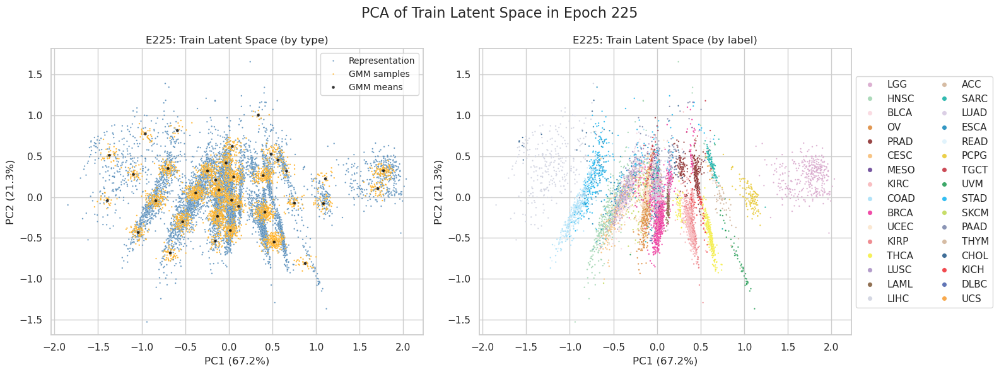

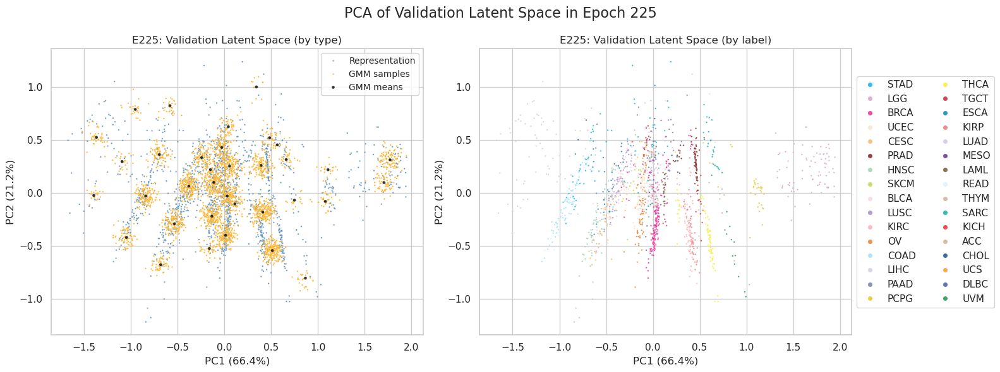

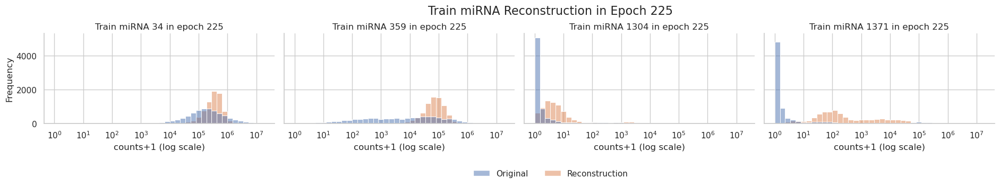

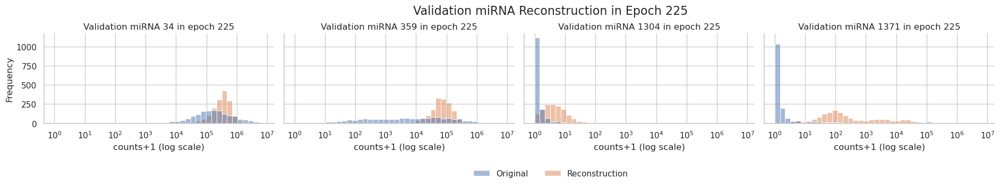

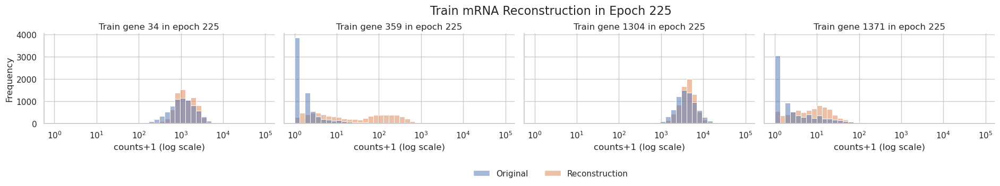

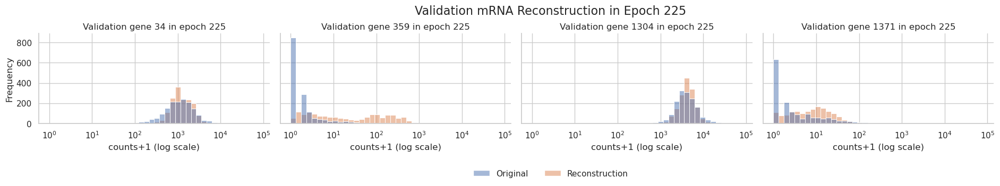

 15%|█████████████▌                                                                          | 231/1500 [13:29<1:24:02,  3.97s/it]

230 train_loss: 11.129213976317825 train_loss_decoder: 9.02379509140604 train_recon_mirna: 2.1172748609310075 train_recon_mrna: 6.906520230475033 train_gmm: 2.1054188849117845 train_mse: 556853440.0 train_mae: 5600.64404296875 train_r2: 0.3217167258262634 train_spearman: 0.06617523729801178 train_pearson: 0.6932108402252197 train_msle: 27.397462844848633
230 test_loss: 11.134652743053788 test_loss_decoder: 9.028249345276642 test_recon_mirna: 2.1220089647282534 test_recon_mrna: 6.906240380548388 test_gmm: 2.1064033977771457 test_mse: 477583968.0 test_mae: 5294.4189453125 test_r2: 0.33004045486450195 test_spearman: 0.053026553243398666 test_pearson: 0.6797813177108765 test_msle: 27.18357276916504


 16%|█████████████▊                                                                          | 236/1500 [13:45<1:09:53,  3.32s/it]

235 train_loss: 11.11343033295014 train_loss_decoder: 9.007995187216787 train_recon_mirna: 2.1129200196053923 train_recon_mrna: 6.895075167611395 train_gmm: 2.1054351457333524 train_mse: 551201664.0 train_mae: 5462.77880859375 train_r2: 0.3286009430885315 train_spearman: 0.07691822946071625 train_pearson: 0.7056669592857361 train_msle: 26.537118911743164
235 test_loss: 11.117980857630148 test_loss_decoder: 9.011320401680862 test_recon_mirna: 2.116791101354114 test_recon_mrna: 6.894529300326748 test_gmm: 2.1066604559492847 test_mse: 472053152.0 test_mae: 5142.435546875 test_r2: 0.3377991318702698 test_spearman: 0.06433749198913574 test_pearson: 0.6954382658004761 test_msle: 26.322364807128906


 16%|██████████████▏                                                                         | 241/1500 [14:01<1:07:47,  3.23s/it]

240 train_loss: 11.09783607577353 train_loss_decoder: 8.992366087111597 train_recon_mirna: 2.1080639113271595 train_recon_mrna: 6.884302175784438 train_gmm: 2.105469988661934 train_mse: 544137280.0 train_mae: 5309.68994140625 train_r2: 0.33720582723617554 train_spearman: 0.08776053786277771 train_pearson: 0.7188305258750916 train_msle: 24.983116149902344
240 test_loss: 11.101300395802102 test_loss_decoder: 8.994654794741763 test_recon_mirna: 2.1112447714815037 test_recon_mrna: 6.883410023260258 test_gmm: 2.1066456010603405 test_mse: 465257568.0 test_mae: 5044.0615234375 test_r2: 0.34733206033706665 test_spearman: 0.07388868182897568 test_pearson: 0.7042685151100159 test_msle: 25.07598304748535


 16%|██████████████▍                                                                         | 246/1500 [14:17<1:06:59,  3.21s/it]

245 train_loss: 11.082486190681344 train_loss_decoder: 8.977052224648247 train_recon_mirna: 2.10292439136714 train_recon_mrna: 6.874127833281108 train_gmm: 2.105433966033096 train_mse: 536252480.0 train_mae: 5210.802734375 train_r2: 0.3468100428581238 train_spearman: 0.09505239874124527 train_pearson: 0.7296748161315918 train_msle: 24.41112518310547
245 test_loss: 11.085562352934955 test_loss_decoder: 8.978931265520004 test_recon_mirna: 2.1053565139781094 test_recon_mrna: 6.873574751541895 test_gmm: 2.1066310874149523 test_mse: 458917920.0 test_mae: 4937.7763671875 test_r2: 0.3562253713607788 test_spearman: 0.08000138401985168 test_pearson: 0.7150194644927979 test_msle: 24.290618896484375


 17%|██████████████▋                                                                         | 251/1500 [14:33<1:06:56,  3.22s/it]

250 train_loss: 11.068423943185126 train_loss_decoder: 8.96303501142759 train_recon_mirna: 2.0988185740923955 train_recon_mrna: 6.864216437335194 train_gmm: 2.105388931757537 train_mse: 530471808.0 train_mae: 5119.55908203125 train_r2: 0.3538512587547302 train_spearman: 0.10195522010326385 train_pearson: 0.73851478099823 train_msle: 23.596969604492188
250 test_loss: 11.069788970549714 test_loss_decoder: 8.963228340586172 test_recon_mirna: 2.0996544026115056 test_recon_mrna: 6.863573937974666 test_gmm: 2.1065606299635427 test_mse: 453674976.0 test_mae: 4800.8466796875 test_r2: 0.36358022689819336 test_spearman: 0.08708932250738144 test_pearson: 0.7281543612480164 test_msle: 22.97130012512207


 17%|███████████████                                                                         | 256/1500 [14:49<1:06:46,  3.22s/it]

255 train_loss: 11.054629289868965 train_loss_decoder: 8.949244314922232 train_recon_mirna: 2.094770404916881 train_recon_mrna: 6.854473910005352 train_gmm: 2.105384974946732 train_mse: 524898624.0 train_mae: 5053.68115234375 train_r2: 0.360639750957489 train_spearman: 0.10979585349559784 train_pearson: 0.7452446818351746 train_msle: 23.186832427978516
255 test_loss: 11.056999286924105 test_loss_decoder: 8.950451376219979 test_recon_mirna: 2.096050722688475 test_recon_mrna: 6.854400653531504 test_gmm: 2.1065479107041263 test_mse: 448441120.0 test_mae: 4768.50341796875 test_r2: 0.370922327041626 test_spearman: 0.09108781814575195 test_pearson: 0.7309240698814392 test_msle: 22.788909912109375


 17%|███████████████▎                                                                        | 261/1500 [15:05<1:05:44,  3.18s/it]

260 train_loss: 11.041143850756278 train_loss_decoder: 8.935726040533847 train_recon_mirna: 2.091049681114833 train_recon_mrna: 6.844676359419015 train_gmm: 2.10541781022243 train_mse: 519030816.0 train_mae: 4945.60205078125 train_r2: 0.36778712272644043 train_spearman: 0.1144866794347763 train_pearson: 0.7585353851318359 train_msle: 22.281431198120117
260 test_loss: 11.042581451881874 test_loss_decoder: 8.93614270301391 test_recon_mirna: 2.0915202807140467 test_recon_mrna: 6.844622422299863 test_gmm: 2.106438748867964 test_mse: 443155840.0 test_mae: 4700.52880859375 test_r2: 0.3783365488052368 test_spearman: 0.09305936098098755 test_pearson: 0.7402700781822205 test_msle: 22.28268814086914


 18%|███████████████▌                                                                        | 266/1500 [15:21<1:05:44,  3.20s/it]

265 train_loss: 11.027873550134107 train_loss_decoder: 8.922415944824506 train_recon_mirna: 2.087137247370056 train_recon_mrna: 6.8352786974544495 train_gmm: 2.1054576053096 train_mse: 511705088.0 train_mae: 4904.71337890625 train_r2: 0.37671029567718506 train_spearman: 0.12037532031536102 train_pearson: 0.7631615400314331 train_msle: 21.958860397338867
265 test_loss: 11.029792094993113 test_loss_decoder: 8.923439976634391 test_recon_mirna: 2.087861491839524 test_recon_mrna: 6.835578484794868 test_gmm: 2.1063521183587217 test_mse: 436022816.0 test_mae: 4616.6982421875 test_r2: 0.38834285736083984 test_spearman: 0.09662839770317078 test_pearson: 0.750287652015686 test_msle: 21.736295700073242


 18%|███████████████▉                                                                        | 271/1500 [15:37<1:06:19,  3.24s/it]

270 train_loss: 11.015377144631355 train_loss_decoder: 8.909851451963885 train_recon_mirna: 2.083607202079541 train_recon_mrna: 6.826244249884343 train_gmm: 2.1055256926674697 train_mse: 507497024.0 train_mae: 4833.22900390625 train_r2: 0.3818359971046448 train_spearman: 0.12567538022994995 train_pearson: 0.7720419764518738 train_msle: 21.403268814086914
270 test_loss: 11.016908253413481 test_loss_decoder: 8.910585915403484 test_recon_mirna: 2.0836339841634315 test_recon_mrna: 6.826951931240052 test_gmm: 2.106322338009997 test_mse: 433227648.0 test_mae: 4570.43798828125 test_r2: 0.3922639489173889 test_spearman: 0.10201260447502136 test_pearson: 0.7555682063102722 test_msle: 21.163219451904297


 18%|████████████████▏                                                                       | 276/1500 [15:53<1:06:45,  3.27s/it]

275 train_loss: 11.002579387197326 train_loss_decoder: 8.897172849545239 train_recon_mirna: 2.079647248249608 train_recon_mrna: 6.81752560129563 train_gmm: 2.1054065376520867 train_mse: 501412448.0 train_mae: 4797.51318359375 train_r2: 0.38924741744995117 train_spearman: 0.1304474174976349 train_pearson: 0.7758853435516357 train_msle: 21.006885528564453
275 test_loss: 11.005127743114393 test_loss_decoder: 8.89908253242507 test_recon_mirna: 2.080102342426882 test_recon_mrna: 6.818980189998188 test_gmm: 2.106045210689323 test_mse: 428006784.0 test_mae: 4504.09716796875 test_r2: 0.39958781003952026 test_spearman: 0.10751242190599442 test_pearson: 0.7646151781082153 test_msle: 20.526504516601562


 19%|████████████████▍                                                                       | 281/1500 [16:09<1:05:15,  3.21s/it]

280 train_loss: 10.990259987312506 train_loss_decoder: 8.884809364527847 train_recon_mirna: 2.0757000447278497 train_recon_mrna: 6.809109319799997 train_gmm: 2.1054506227846588 train_mse: 496950560.0 train_mae: 4715.28271484375 train_r2: 0.39468228816986084 train_spearman: 0.13742132484912872 train_pearson: 0.7867506146430969 train_msle: 20.17510986328125
280 test_loss: 10.993708029616174 test_loss_decoder: 8.88738903673639 test_recon_mirna: 2.0772244782000944 test_recon_mrna: 6.810164558536296 test_gmm: 2.1063189928797836 test_mse: 423598112.0 test_mae: 4456.3720703125 test_r2: 0.40577232837677 test_spearman: 0.115048848092556 test_pearson: 0.7718052268028259 test_msle: 19.743227005004883


 19%|████████████████▊                                                                       | 286/1500 [16:26<1:07:02,  3.31s/it]

285 train_loss: 10.978894359943462 train_loss_decoder: 8.873261443988277 train_recon_mirna: 2.0722419061178217 train_recon_mrna: 6.801019537870454 train_gmm: 2.1056329159551854 train_mse: 491602528.0 train_mae: 4678.0693359375 train_r2: 0.40119653940200806 train_spearman: 0.14406123757362366 train_pearson: 0.7917865514755249 train_msle: 20.171205520629883
285 test_loss: 10.980612624454535 test_loss_decoder: 8.874328256275778 test_recon_mirna: 2.071820573312615 test_recon_mrna: 6.802507682963164 test_gmm: 2.1062843681787573 test_mse: 419966688.0 test_mae: 4395.48046875 test_r2: 0.41086649894714355 test_spearman: 0.11528123170137405 test_pearson: 0.7821122407913208 test_msle: 19.871854782104492


 19%|█████████████████                                                                       | 291/1500 [16:42<1:05:48,  3.27s/it]

290 train_loss: 10.967171659827299 train_loss_decoder: 8.861368729043019 train_recon_mirna: 2.0682431678923003 train_recon_mrna: 6.793125561150719 train_gmm: 2.1058029307842805 train_mse: 487082080.0 train_mae: 4625.84619140625 train_r2: 0.4067026972770691 train_spearman: 0.14751067757606506 train_pearson: 0.7993025779724121 train_msle: 20.04044532775879
290 test_loss: 10.971347780013017 test_loss_decoder: 8.864903614788004 test_recon_mirna: 2.0689223911176757 test_recon_mrna: 6.795981223670328 test_gmm: 2.106444165225014 test_mse: 413744448.0 test_mae: 4330.55224609375 test_r2: 0.4195951819419861 test_spearman: 0.12831264734268188 test_pearson: 0.7893592119216919 test_msle: 19.45746612548828


 20%|█████████████████▎                                                                      | 296/1500 [16:58<1:04:16,  3.20s/it]

295 train_loss: 10.956581271694375 train_loss_decoder: 8.850546766667543 train_recon_mirna: 2.0648832452599057 train_recon_mrna: 6.7856635214076375 train_gmm: 2.106034505026833 train_mse: 483340992.0 train_mae: 4578.978515625 train_r2: 0.41125959157943726 train_spearman: 0.15581797063350677 train_pearson: 0.8052921891212463 train_msle: 19.801342010498047
295 test_loss: 10.959989037117634 test_loss_decoder: 8.853285443520024 test_recon_mirna: 2.0650594431481077 test_recon_mrna: 6.788226000371917 test_gmm: 2.1067035935976106 test_mse: 412476032.0 test_mae: 4299.05859375 test_r2: 0.42137449979782104 test_spearman: 0.13433043658733368 test_pearson: 0.7947614789009094 test_msle: 19.358179092407227


 20%|█████████████████▌                                                                      | 300/1500 [17:11<1:04:27,  3.22s/it]

300 train_loss: 10.94587113831654 train_loss_decoder: 8.839527928461509 train_recon_mirna: 2.0610853524337016 train_recon_mrna: 6.778442576027807 train_gmm: 2.106343209855032 train_mse: 481302784.0 train_mae: 4515.990234375 train_r2: 0.4137422442436218 train_spearman: 0.15993817150592804 train_pearson: 0.8131846189498901 train_msle: 19.297719955444336
300 test_loss: 10.950842715472175 test_loss_decoder: 8.844077559069786 test_recon_mirna: 2.0625948920576618 test_recon_mrna: 6.781482667012124 test_gmm: 2.1067651564023895 test_mse: 408410816.0 test_mae: 4223.44384765625 test_r2: 0.4270772337913513 test_spearman: 0.13647900521755219 test_pearson: 0.8051037192344666 test_msle: 18.956573486328125


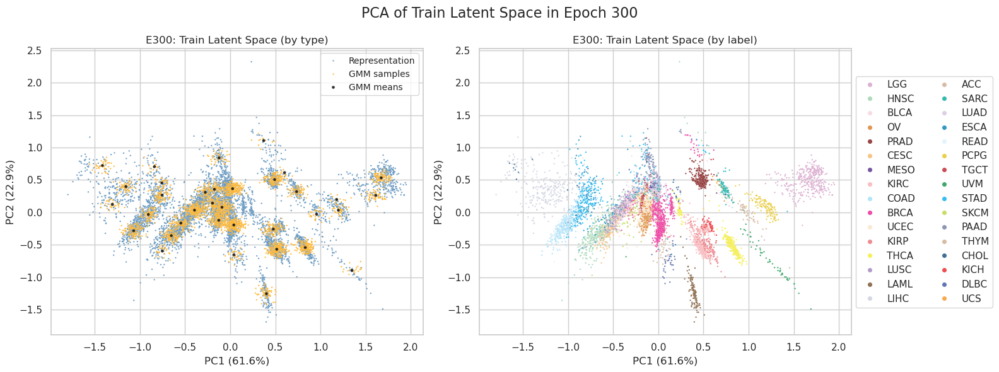

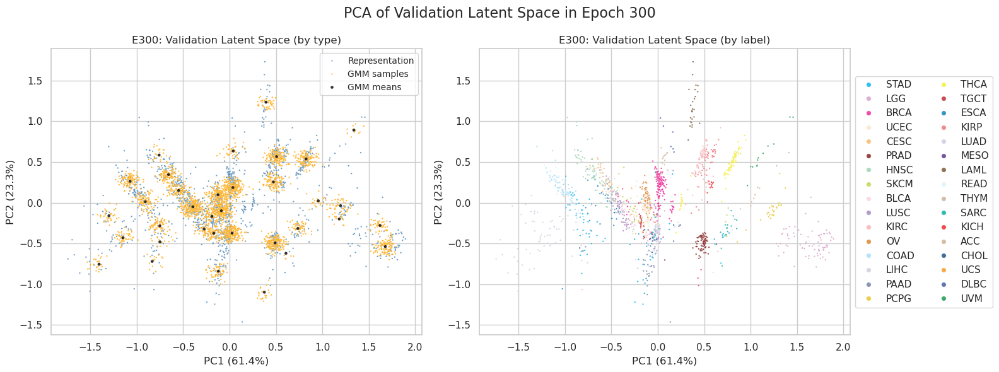

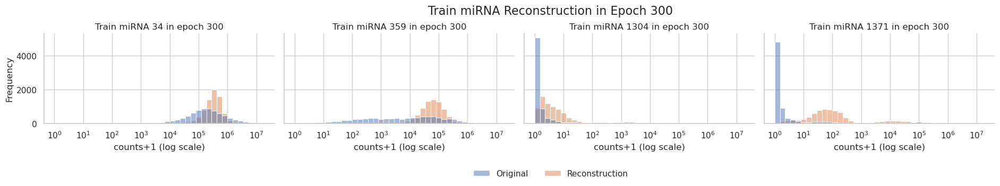

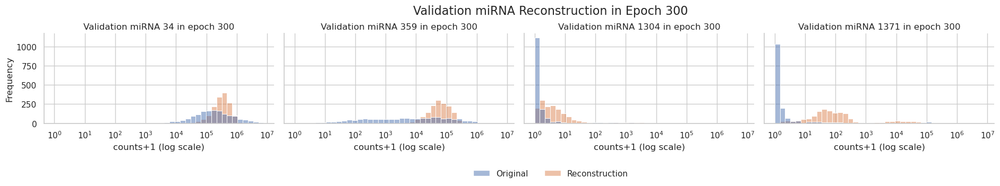

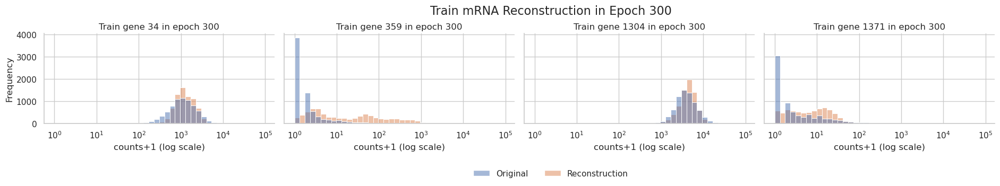

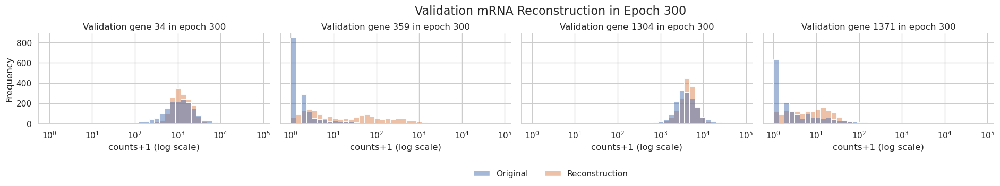

 20%|█████████████████▉                                                                      | 306/1500 [17:47<1:20:23,  4.04s/it]

305 train_loss: 10.935513990923837 train_loss_decoder: 8.828902682011943 train_recon_mirna: 2.0572721003218213 train_recon_mrna: 6.771630581690122 train_gmm: 2.1066113089118943 train_mse: 478854080.0 train_mae: 4445.4111328125 train_r2: 0.4167249798774719 train_spearman: 0.1638432741165161 train_pearson: 0.8230569362640381 train_msle: 19.192514419555664
305 test_loss: 10.939778651228776 test_loss_decoder: 8.832790738071905 test_recon_mirna: 2.057897765947327 test_recon_mrna: 6.7748929721245785 test_gmm: 2.106987913156871 test_mse: 403473120.0 test_mae: 4189.78076171875 test_r2: 0.43400388956069946 test_spearman: 0.14431588351726532 test_pearson: 0.8092475533485413 test_msle: 19.02663230895996


 21%|██████████████████▏                                                                     | 311/1500 [18:02<1:05:22,  3.30s/it]

310 train_loss: 10.92560615870999 train_loss_decoder: 8.818622892625118 train_recon_mirna: 2.0537673269787673 train_recon_mrna: 6.76485556564635 train_gmm: 2.10698326608487 train_mse: 475707296.0 train_mae: 4390.42529296875 train_r2: 0.42055797576904297 train_spearman: 0.1651032418012619 train_pearson: 0.8292921781539917 train_msle: 18.60154914855957
310 test_loss: 10.93108192670913 test_loss_decoder: 8.823917761709072 test_recon_mirna: 2.0553497015013593 test_recon_mrna: 6.768568060207714 test_gmm: 2.107164165000058 test_mse: 401997408.0 test_mae: 4149.51611328125 test_r2: 0.43607401847839355 test_spearman: 0.14138711988925934 test_pearson: 0.8147673606872559 test_msle: 18.579418182373047


 21%|██████████████████▌                                                                     | 316/1500 [18:19<1:05:16,  3.31s/it]

315 train_loss: 10.916151697675385 train_loss_decoder: 8.808757861675344 train_recon_mirna: 2.0502209169320245 train_recon_mrna: 6.7585369447433195 train_gmm: 2.10739383600004 train_mse: 474256672.0 train_mae: 4355.62060546875 train_r2: 0.42232489585876465 train_spearman: 0.1673666536808014 train_pearson: 0.8342446684837341 train_msle: 18.634593963623047
315 test_loss: 10.921020556346724 test_loss_decoder: 8.813667460881254 test_recon_mirna: 2.0514086462440555 test_recon_mrna: 6.762258814637198 test_gmm: 2.10735309546547 test_mse: 400734816.0 test_mae: 4068.14697265625 test_r2: 0.4378451704978943 test_spearman: 0.14775700867176056 test_pearson: 0.8255972266197205 test_msle: 18.306350708007812


 21%|██████████████████▊                                                                     | 321/1500 [18:35<1:05:19,  3.32s/it]

320 train_loss: 10.906278439970945 train_loss_decoder: 8.798498776335645 train_recon_mirna: 2.046295657149318 train_recon_mrna: 6.752203119186326 train_gmm: 2.1077796636353 train_mse: 471717888.0 train_mae: 4299.69970703125 train_r2: 0.42541730403900146 train_spearman: 0.16629773378372192 train_pearson: 0.8411487936973572 train_msle: 18.554489135742188
320 test_loss: 10.913391258646893 test_loss_decoder: 8.805525638037162 test_recon_mirna: 2.0485894442446493 test_recon_mrna: 6.756936193792513 test_gmm: 2.107865620609732 test_mse: 396521856.0 test_mae: 4013.33154296875 test_r2: 0.44375520944595337 test_spearman: 0.15223489701747894 test_pearson: 0.8314922451972961 test_msle: 18.17333984375


 22%|███████████████████▏                                                                    | 326/1500 [18:51<1:03:20,  3.24s/it]

325 train_loss: 10.896846245815228 train_loss_decoder: 8.7885369824846 train_recon_mirna: 2.0425334750053135 train_recon_mrna: 6.746003507479286 train_gmm: 2.1083092633306286 train_mse: 472535840.0 train_mae: 4221.3203125 train_r2: 0.42442095279693604 train_spearman: 0.1669570654630661 train_pearson: 0.8521211743354797 train_msle: 18.144577026367188
325 test_loss: 10.906207640237673 test_loss_decoder: 8.797797577235514 test_recon_mirna: 2.0469539968223485 test_recon_mrna: 6.750843580413164 test_gmm: 2.1084100630021596 test_mse: 399770880.0 test_mae: 3966.862060546875 test_r2: 0.4391974210739136 test_spearman: 0.15043088793754578 test_pearson: 0.8407675623893738 test_msle: 18.011892318725586


 22%|███████████████████▍                                                                    | 331/1500 [19:08<1:03:37,  3.27s/it]

330 train_loss: 10.887192451369103 train_loss_decoder: 8.778184910341732 train_recon_mirna: 2.038329844882734 train_recon_mrna: 6.739855065458999 train_gmm: 2.1090075410273705 train_mse: 474618528.0 train_mae: 4157.05615234375 train_r2: 0.42188411951065063 train_spearman: 0.16340632736682892 train_pearson: 0.8600243330001831 train_msle: 17.68648910522461
330 test_loss: 10.896316633507183 test_loss_decoder: 8.78778079839839 test_recon_mirna: 2.0434699578145197 test_recon_mrna: 6.7443108405838705 test_gmm: 2.1085358351087917 test_mse: 400016736.0 test_mae: 3915.33251953125 test_r2: 0.43885254859924316 test_spearman: 0.14997631311416626 test_pearson: 0.8477877378463745 test_msle: 17.43507194519043


 22%|███████████████████▋                                                                    | 336/1500 [19:24<1:02:55,  3.24s/it]

335 train_loss: 10.877663078733544 train_loss_decoder: 8.767883541733614 train_recon_mirna: 2.034205035849772 train_recon_mrna: 6.733678505883842 train_gmm: 2.1097795369999304 train_mse: 477264768.0 train_mae: 4113.84912109375 train_r2: 0.41866081953048706 train_spearman: 0.1619032323360443 train_pearson: 0.8675475716590881 train_msle: 17.617570877075195
335 test_loss: 10.888026373018256 test_loss_decoder: 8.778583904940222 test_recon_mirna: 2.0400474988832804 test_recon_mrna: 6.738536406056942 test_gmm: 2.109442468078035 test_mse: 401536736.0 test_mae: 3863.605224609375 test_r2: 0.43672025203704834 test_spearman: 0.14504073560237885 test_pearson: 0.8559399843215942 test_msle: 17.632688522338867


 23%|████████████████████                                                                    | 341/1500 [19:40<1:03:09,  3.27s/it]

340 train_loss: 10.868196143570646 train_loss_decoder: 8.757438612344293 train_recon_mirna: 2.02981851608152 train_recon_mrna: 6.727620096262773 train_gmm: 2.110757531226353 train_mse: 480641728.0 train_mae: 4045.82666015625 train_r2: 0.41454750299453735 train_spearman: 0.1599198430776596 train_pearson: 0.8772569298744202 train_msle: 17.44092559814453
340 test_loss: 10.88259692524002 test_loss_decoder: 8.772655376397017 test_recon_mirna: 2.0384570229177696 test_recon_mrna: 6.734198353479247 test_gmm: 2.1099415488430013 test_mse: 405505664.0 test_mae: 3831.414794921875 test_r2: 0.4311526417732239 test_spearman: 0.14618228375911713 test_pearson: 0.8599302172660828 test_msle: 17.60822868347168


 23%|████████████████████▎                                                                   | 346/1500 [19:57<1:02:41,  3.26s/it]

345 train_loss: 10.858508715517958 train_loss_decoder: 8.746678991240806 train_recon_mirna: 2.0255887512572164 train_recon_mrna: 6.721090239983589 train_gmm: 2.1118297242771518 train_mse: 484694304.0 train_mae: 3993.103515625 train_r2: 0.40961122512817383 train_spearman: 0.15930621325969696 train_pearson: 0.8839449286460876 train_msle: 16.646249771118164
345 test_loss: 10.871307142323605 test_loss_decoder: 8.760405708919253 test_recon_mirna: 2.0338193285740167 test_recon_mrna: 6.726586380345236 test_gmm: 2.1109014334043517 test_mse: 406135616.0 test_mae: 3758.6865234375 test_r2: 0.43026888370513916 test_spearman: 0.14652758836746216 test_pearson: 0.8687008619308472 test_msle: 16.752294540405273


 23%|████████████████████▌                                                                   | 351/1500 [20:13<1:01:44,  3.22s/it]

350 train_loss: 10.84904963730043 train_loss_decoder: 8.736026253317098 train_recon_mirna: 2.0214636608270107 train_recon_mrna: 6.714562592490087 train_gmm: 2.113023383983333 train_mse: 487266816.0 train_mae: 3939.9873046875 train_r2: 0.40647774934768677 train_spearman: 0.1596909612417221 train_pearson: 0.8910884857177734 train_msle: 16.319091796875
350 test_loss: 10.86468541780392 test_loss_decoder: 8.753074326245425 test_recon_mirna: 2.032686788038519 test_recon_mrna: 6.720387538206905 test_gmm: 2.1116110915584945 test_mse: 410872384.0 test_mae: 3697.598876953125 test_r2: 0.4236241579055786 test_spearman: 0.1472516506910324 test_pearson: 0.8766601085662842 test_msle: 16.31592559814453


 24%|████████████████████▉                                                                   | 356/1500 [20:29<1:01:43,  3.24s/it]

355 train_loss: 10.839584822068588 train_loss_decoder: 8.725466436977584 train_recon_mirna: 2.017594448730339 train_recon_mrna: 6.707871988247244 train_gmm: 2.114118385091003 train_mse: 490399552.0 train_mae: 3908.709716796875 train_r2: 0.4026618003845215 train_spearman: 0.16369356215000153 train_pearson: 0.8956925272941589 train_msle: 16.059961318969727
355 test_loss: 10.858536752534427 test_loss_decoder: 8.745658746652193 test_recon_mirna: 2.031207489782427 test_recon_mrna: 6.714451256869767 test_gmm: 2.1128780058822336 test_mse: 413679552.0 test_mae: 3660.4716796875 test_r2: 0.4196861982345581 test_spearman: 0.15086619555950165 test_pearson: 0.8822801113128662 test_msle: 16.202421188354492


 24%|█████████████████████▏                                                                  | 361/1500 [20:45<1:01:04,  3.22s/it]

360 train_loss: 10.8305045686197 train_loss_decoder: 8.715277874194893 train_recon_mirna: 2.0139306154609455 train_recon_mrna: 6.701347258733947 train_gmm: 2.1152266944248077 train_mse: 494025280.0 train_mae: 3867.275634765625 train_r2: 0.3982454538345337 train_spearman: 0.16139662265777588 train_pearson: 0.9004103541374207 train_msle: 15.608101844787598
360 test_loss: 10.851678478371117 test_loss_decoder: 8.738122941662672 test_recon_mirna: 2.0302517417021826 test_recon_mrna: 6.70787119996049 test_gmm: 2.1135555367084455 test_mse: 414553120.0 test_mae: 3610.78857421875 test_r2: 0.4184607267379761 test_spearman: 0.1501711755990982 test_pearson: 0.8873507380485535 test_msle: 15.692750930786133


 24%|█████████████████████▍                                                                  | 366/1500 [21:01<1:00:40,  3.21s/it]

365 train_loss: 10.821525862775244 train_loss_decoder: 8.705417283368956 train_recon_mirna: 2.0102570173574774 train_recon_mrna: 6.695160266011478 train_gmm: 2.1161085794062884 train_mse: 494628736.0 train_mae: 3834.034912109375 train_r2: 0.3975104093551636 train_spearman: 0.1661468893289566 train_pearson: 0.9032646417617798 train_msle: 15.326172828674316
365 test_loss: 10.846696024187569 test_loss_decoder: 8.731982395743566 test_recon_mirna: 2.0304584559936365 test_recon_mrna: 6.70152393974993 test_gmm: 2.114713628444002 test_mse: 417920288.0 test_mae: 3582.069580078125 test_r2: 0.4137372374534607 test_spearman: 0.15133681893348694 test_pearson: 0.8913675546646118 test_msle: 15.259550094604492


 25%|█████████████████████▊                                                                  | 371/1500 [21:17<1:01:02,  3.24s/it]

370 train_loss: 10.81295497152329 train_loss_decoder: 8.696033636045971 train_recon_mirna: 2.006959594909094 train_recon_mrna: 6.689074041136877 train_gmm: 2.116921335477319 train_mse: 497868128.0 train_mae: 3808.149169921875 train_r2: 0.3935645818710327 train_spearman: 0.16805227100849152 train_pearson: 0.9066404700279236 train_msle: 14.822949409484863
370 test_loss: 10.83818948297655 test_loss_decoder: 8.722503072561237 test_recon_mirna: 2.0268631051638706 test_recon_mrna: 6.6956399673973666 test_gmm: 2.115686410415312 test_mse: 422434240.0 test_mae: 3555.4921875 test_r2: 0.4074050188064575 test_spearman: 0.1541263461112976 test_pearson: 0.8949154019355774 test_msle: 14.982994079589844


 25%|██████████████████████                                                                  | 375/1500 [21:30<1:01:08,  3.26s/it]

375 train_loss: 10.804917140440189 train_loss_decoder: 8.687202729023964 train_recon_mirna: 2.003947831957667 train_recon_mrna: 6.6832548970662975 train_gmm: 2.1177144114162254 train_mse: 500153472.0 train_mae: 3790.219970703125 train_r2: 0.3907809257507324 train_spearman: 0.17378324270248413 train_pearson: 0.9094691872596741 train_msle: 14.713661193847656
375 test_loss: 10.834627175041941 test_loss_decoder: 8.717875498394974 test_recon_mirna: 2.0271674997985207 test_recon_mrna: 6.690707998596453 test_gmm: 2.116751676646967 test_mse: 423158112.0 test_mae: 3528.775390625 test_r2: 0.40638959407806396 test_spearman: 0.15941672027111053 test_pearson: 0.8979983925819397 test_msle: 14.833367347717285


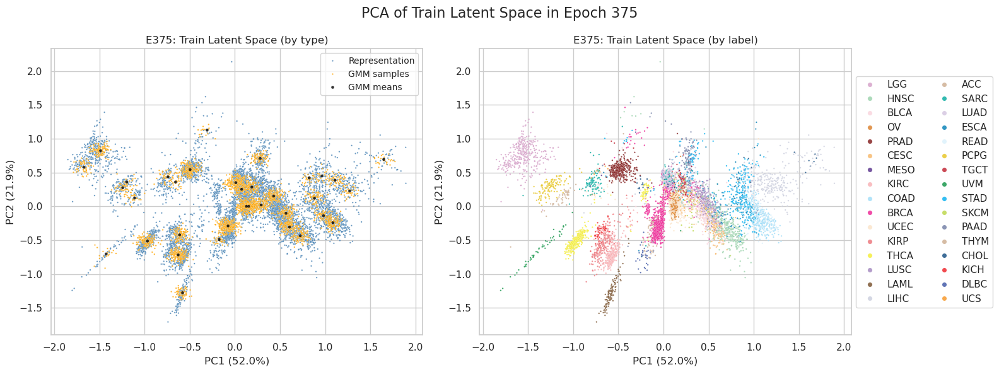

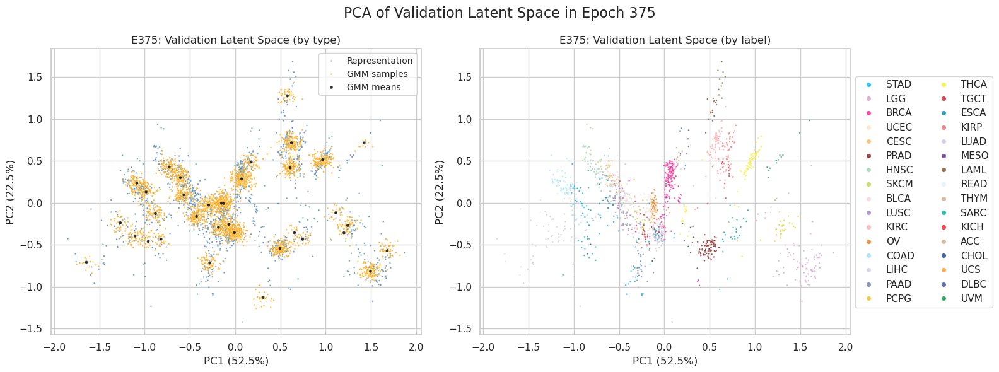

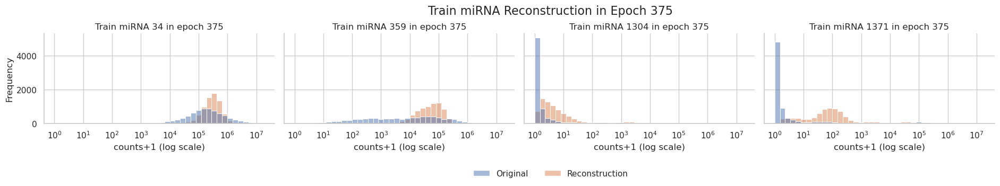

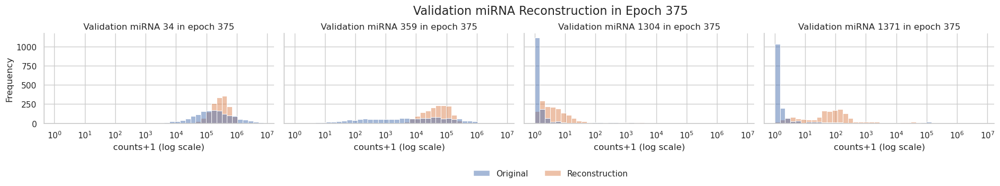

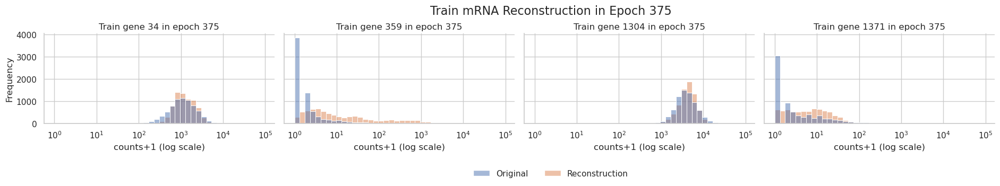

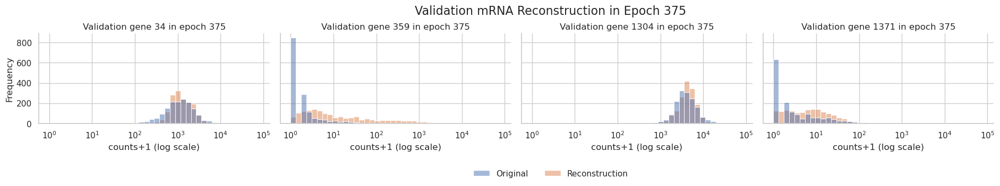

 25%|██████████████████████▎                                                                 | 381/1500 [22:04<1:13:16,  3.93s/it]

380 train_loss: 10.79720668664686 train_loss_decoder: 8.678730515720847 train_recon_mirna: 2.001324759844078 train_recon_mrna: 6.677405755876769 train_gmm: 2.1184761709260127 train_mse: 501057280.0 train_mae: 3764.546875 train_r2: 0.38968002796173096 train_spearman: 0.17412947118282318 train_pearson: 0.9103159308433533 train_msle: 13.908415794372559
380 test_loss: 10.826264425867723 test_loss_decoder: 8.708464029219712 test_recon_mirna: 2.0239764913108793 test_recon_mrna: 6.684487537908832 test_gmm: 2.117800396648012 test_mse: 422738272.0 test_mae: 3504.2041015625 test_r2: 0.4069785475730896 test_spearman: 0.15993863344192505 test_pearson: 0.8989604711532593 test_msle: 14.195381164550781


 26%|██████████████████████▋                                                                 | 386/1500 [22:21<1:01:49,  3.33s/it]

385 train_loss: 10.789634663330265 train_loss_decoder: 8.67052717323707 train_recon_mirna: 1.9986116809659367 train_recon_mrna: 6.6719154922711335 train_gmm: 2.1191074900931937 train_mse: 504433184.0 train_mae: 3759.218017578125 train_r2: 0.38556796312332153 train_spearman: 0.17198897898197174 train_pearson: 0.9123725891113281 train_msle: 13.709325790405273
385 test_loss: 10.820570076652906 test_loss_decoder: 8.701856487031934 test_recon_mirna: 2.023530335508852 test_recon_mrna: 6.678326151523082 test_gmm: 2.1187135896209712 test_mse: 422959840.0 test_mae: 3482.9765625 test_r2: 0.40666770935058594 test_spearman: 0.15910108387470245 test_pearson: 0.8998108506202698 test_msle: 14.040529251098633


 26%|███████████████████████▍                                                                  | 391/1500 [22:36<59:01,  3.19s/it]

390 train_loss: 10.782042807886047 train_loss_decoder: 8.662333319692072 train_recon_mirna: 1.9959047776273942 train_recon_mrna: 6.666428542064677 train_gmm: 2.1197094881939744 train_mse: 501659904.0 train_mae: 3731.622314453125 train_r2: 0.388945996761322 train_spearman: 0.17365838587284088 train_pearson: 0.911882221698761 train_msle: 13.140406608581543
390 test_loss: 10.815689132644414 test_loss_decoder: 8.696634373303665 test_recon_mirna: 2.023237060605853 test_recon_mrna: 6.673397312697811 test_gmm: 2.1190547593407487 test_mse: 427609024.0 test_mae: 3471.05908203125 test_r2: 0.40014582872390747 test_spearman: 0.1607777327299118 test_pearson: 0.9022712111473083 test_msle: 13.054753303527832


 26%|███████████████████████▊                                                                  | 396/1500 [22:52<59:13,  3.22s/it]

395 train_loss: 10.774999912855513 train_loss_decoder: 8.654747362724086 train_recon_mirna: 1.9936919241823412 train_recon_mrna: 6.661055438541744 train_gmm: 2.120252550131427 train_mse: 506397920.0 train_mae: 3734.43701171875 train_r2: 0.3831747770309448 train_spearman: 0.1740562915802002 train_pearson: 0.91371750831604 train_msle: 12.666897773742676
395 test_loss: 10.80932220574582 test_loss_decoder: 8.689298533130643 test_recon_mirna: 2.020931583275664 test_recon_mrna: 6.6683669498549785 test_gmm: 2.1200236726151775 test_mse: 427984512.0 test_mae: 3474.495361328125 test_r2: 0.39961904287338257 test_spearman: 0.1580675095319748 test_pearson: 0.9027897119522095 test_msle: 13.14026165008545


 27%|████████████████████████                                                                  | 401/1500 [23:08<58:27,  3.19s/it]

400 train_loss: 10.768150289961142 train_loss_decoder: 8.647496558667083 train_recon_mirna: 1.9916620526575832 train_recon_mrna: 6.6558345060095 train_gmm: 2.120653731294058 train_mse: 508345856.0 train_mae: 3738.133056640625 train_r2: 0.38080209493637085 train_spearman: 0.17875808477401733 train_pearson: 0.9144130349159241 train_msle: 12.650697708129883
400 test_loss: 10.802982735258492 test_loss_decoder: 8.682535962178019 test_recon_mirna: 2.019225591413683 test_recon_mrna: 6.663310370764337 test_gmm: 2.1204467730804732 test_mse: 428626144.0 test_mae: 3464.7978515625 test_r2: 0.3987189531326294 test_spearman: 0.16105931997299194 test_pearson: 0.9038398265838623 test_msle: 12.945149421691895


 27%|████████████████████████▎                                                                 | 406/1500 [23:24<58:49,  3.23s/it]

405 train_loss: 10.761385675500664 train_loss_decoder: 8.6403925673273 train_recon_mirna: 1.9897154814424254 train_recon_mrna: 6.650677085884874 train_gmm: 2.120993108173364 train_mse: 509163648.0 train_mae: 3731.132080078125 train_r2: 0.3798059821128845 train_spearman: 0.17695802450180054 train_pearson: 0.914721667766571 train_msle: 12.100984573364258
405 test_loss: 10.796773341823664 test_loss_decoder: 8.675757570602343 test_recon_mirna: 2.0172003966989953 test_recon_mrna: 6.658557173903349 test_gmm: 2.121015771221322 test_mse: 428365184.0 test_mae: 3452.77734375 test_r2: 0.39908504486083984 test_spearman: 0.16397283971309662 test_pearson: 0.9047840237617493 test_msle: 12.477252960205078


 27%|████████████████████████▋                                                                 | 411/1500 [23:40<57:44,  3.18s/it]

410 train_loss: 10.754875519669117 train_loss_decoder: 8.633581781617025 train_recon_mirna: 1.9878287211306445 train_recon_mrna: 6.6457530604863795 train_gmm: 2.121293738052093 train_mse: 509643808.0 train_mae: 3731.6259765625 train_r2: 0.3792210817337036 train_spearman: 0.1782638132572174 train_pearson: 0.9150139689445496 train_msle: 12.0704927444458
410 test_loss: 10.79007391750224 test_loss_decoder: 8.66855403974762 test_recon_mirna: 2.0145614561986593 test_recon_mrna: 6.653992583548962 test_gmm: 2.121519877754621 test_mse: 429712896.0 test_mae: 3456.28857421875 test_r2: 0.39719444513320923 test_spearman: 0.17056235671043396 test_pearson: 0.904624342918396 test_msle: 12.514725685119629


 28%|████████████████████████▉                                                                 | 416/1500 [23:56<57:48,  3.20s/it]

415 train_loss: 10.748306189349542 train_loss_decoder: 8.62678662682963 train_recon_mirna: 1.9859437476644566 train_recon_mrna: 6.640842879165172 train_gmm: 2.121519562519913 train_mse: 510284864.0 train_mae: 3732.4208984375 train_r2: 0.378440260887146 train_spearman: 0.1808909773826599 train_pearson: 0.9149831533432007 train_msle: 11.86398983001709
415 test_loss: 10.784538655000377 test_loss_decoder: 8.662713787869478 test_recon_mirna: 2.0131487077114714 test_recon_mrna: 6.649565080158007 test_gmm: 2.1218248671308984 test_mse: 432276320.0 test_mae: 3459.9736328125 test_r2: 0.3935984969139099 test_spearman: 0.17511072754859924 test_pearson: 0.9047163128852844 test_msle: 12.16196060180664


 28%|█████████████████████████▎                                                                | 421/1500 [24:13<59:12,  3.29s/it]

420 train_loss: 10.742180303277506 train_loss_decoder: 8.620415815039971 train_recon_mirna: 1.9843090529687795 train_recon_mrna: 6.636106762071192 train_gmm: 2.121764488237534 train_mse: 509591200.0 train_mae: 3727.9169921875 train_r2: 0.37928515672683716 train_spearman: 0.1790093034505844 train_pearson: 0.9156463742256165 train_msle: 11.643266677856445
420 test_loss: 10.777433507726197 test_loss_decoder: 8.655163765852183 test_recon_mirna: 2.0108612914945576 test_recon_mrna: 6.644302474357626 test_gmm: 2.122269741874013 test_mse: 428228064.0 test_mae: 3442.511474609375 test_r2: 0.39927738904953003 test_spearman: 0.17565858364105225 test_pearson: 0.9042595028877258 test_msle: 12.06834888458252


 28%|████████████████████████▉                                                               | 426/1500 [24:32<1:10:19,  3.93s/it]

425 train_loss: 10.735906416509097 train_loss_decoder: 8.613874482615872 train_recon_mirna: 1.982477625685503 train_recon_mrna: 6.631396856930368 train_gmm: 2.1220319338932256 train_mse: 507317760.0 train_mae: 3718.8642578125 train_r2: 0.3820543885231018 train_spearman: 0.17843939363956451 train_pearson: 0.9155025482177734 train_msle: 11.677552223205566
425 test_loss: 10.772339505147865 test_loss_decoder: 8.649838354970223 test_recon_mirna: 2.0095952274374644 test_recon_mrna: 6.6402431275327585 test_gmm: 2.1225011501776425 test_mse: 430095424.0 test_mae: 3447.77587890625 test_r2: 0.3966578245162964 test_spearman: 0.17598170042037964 test_pearson: 0.9042527079582214 test_msle: 11.885700225830078


 29%|█████████████████████████▎                                                              | 431/1500 [24:54<1:18:10,  4.39s/it]

430 train_loss: 10.729931224418527 train_loss_decoder: 8.607658654075223 train_recon_mirna: 1.9808940289360129 train_recon_mrna: 6.62676462513921 train_gmm: 2.1222725703433034 train_mse: 507950752.0 train_mae: 3722.390380859375 train_r2: 0.38128334283828735 train_spearman: 0.17597146332263947 train_pearson: 0.9157465100288391 train_msle: 11.56782054901123
430 test_loss: 10.7638389191352 test_loss_decoder: 8.641095483311483 test_recon_mirna: 2.0051937894711807 test_recon_mrna: 6.635901693840303 test_gmm: 2.122743435823716 test_mse: 427727904.0 test_mae: 3438.614990234375 test_r2: 0.3999790549278259 test_spearman: 0.17696622014045715 test_pearson: 0.9027069807052612 test_msle: 11.946722984313965


 29%|█████████████████████████▌                                                              | 436/1500 [25:16<1:18:26,  4.42s/it]

435 train_loss: 10.723972315606302 train_loss_decoder: 8.60144396032906 train_recon_mirna: 1.9791163637259803 train_recon_mrna: 6.62232759660308 train_gmm: 2.1225283552772414 train_mse: 505599264.0 train_mae: 3710.384521484375 train_r2: 0.384147584438324 train_spearman: 0.17849360406398773 train_pearson: 0.9166610240936279 train_msle: 11.300969123840332
435 test_loss: 10.756408853068748 test_loss_decoder: 8.633563713966192 test_recon_mirna: 2.002529321633269 test_recon_mrna: 6.631034392332922 test_gmm: 2.1228451391025565 test_mse: 425198208.0 test_mae: 3425.57080078125 test_r2: 0.40352773666381836 test_spearman: 0.17990419268608093 test_pearson: 0.902911901473999 test_msle: 11.574069023132324


 29%|█████████████████████████▊                                                              | 441/1500 [25:33<1:02:29,  3.54s/it]

440 train_loss: 10.717995948023482 train_loss_decoder: 8.595224238458435 train_recon_mirna: 1.977400490902495 train_recon_mrna: 6.61782374755594 train_gmm: 2.1227717095650465 train_mse: 505293984.0 train_mae: 3708.694580078125 train_r2: 0.38451945781707764 train_spearman: 0.1762508600950241 train_pearson: 0.9161725640296936 train_msle: 11.197647094726562
440 test_loss: 10.748474608778805 test_loss_decoder: 8.625428555956262 test_recon_mirna: 1.9990817689165021 test_recon_mrna: 6.626346787039759 test_gmm: 2.123046052822543 test_mse: 427087840.0 test_mae: 3432.0625 test_r2: 0.4008769392967224 test_spearman: 0.17827442288398743 test_pearson: 0.9030401706695557 test_msle: 11.39648723602295


 30%|██████████████████████████▏                                                             | 446/1500 [25:52<1:07:19,  3.83s/it]

445 train_loss: 10.712664855937078 train_loss_decoder: 8.589614858612912 train_recon_mirna: 1.9759467102878092 train_recon_mrna: 6.613668148325103 train_gmm: 2.1230499973241668 train_mse: 503490560.0 train_mae: 3699.1015625 train_r2: 0.3867161273956299 train_spearman: 0.17874440550804138 train_pearson: 0.9158350229263306 train_msle: 11.098851203918457
445 test_loss: 10.744354038298882 test_loss_decoder: 8.621042334715263 test_recon_mirna: 1.998442627709802 test_recon_mrna: 6.6225997070054605 test_gmm: 2.1233117035836195 test_mse: 421955584.0 test_mae: 3409.0595703125 test_r2: 0.40807652473449707 test_spearman: 0.18510748445987701 test_pearson: 0.9016017317771912 test_msle: 11.285168647766113


 30%|██████████████████████████▍                                                             | 450/1500 [26:08<1:09:15,  3.96s/it]

450 train_loss: 10.706857832294506 train_loss_decoder: 8.583534758707845 train_recon_mirna: 1.9740932747001483 train_recon_mrna: 6.6094414840076965 train_gmm: 2.123323073586662 train_mse: 497316000.0 train_mae: 3675.129150390625 train_r2: 0.3942371606826782 train_spearman: 0.1785018891096115 train_pearson: 0.9146522879600525 train_msle: 11.56983757019043
450 test_loss: 10.735631463866877 test_loss_decoder: 8.612285578600181 test_recon_mirna: 1.9933452834917915 test_recon_mrna: 6.6189402951083895 test_gmm: 2.123345885266696 test_mse: 420626592.0 test_mae: 3416.12548828125 test_r2: 0.40994083881378174 test_spearman: 0.18513695895671844 test_pearson: 0.9022470712661743 test_msle: 12.02509593963623


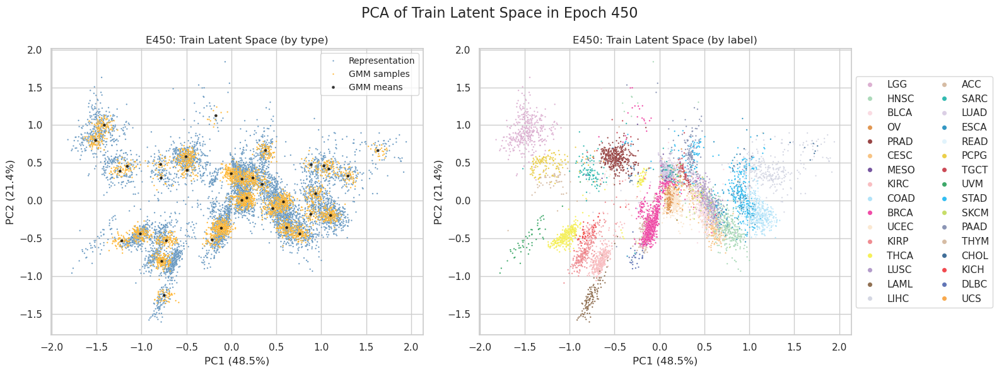

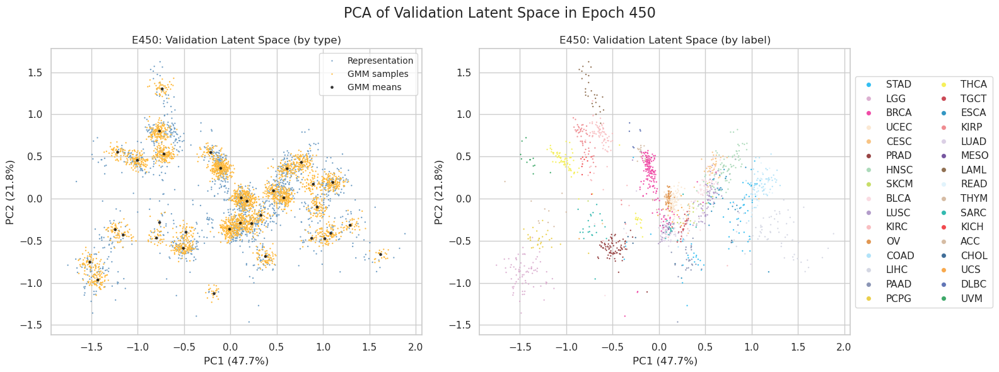

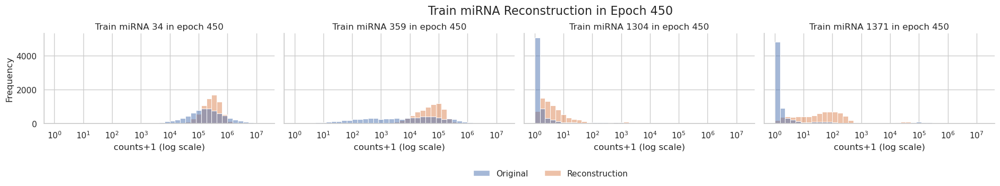

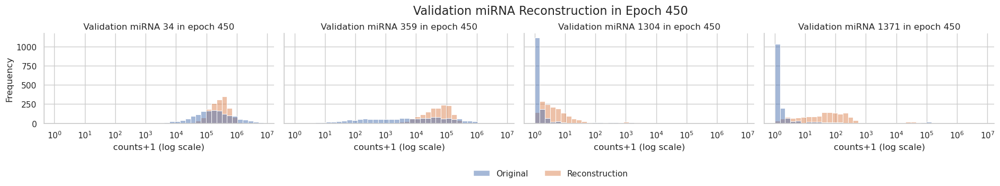

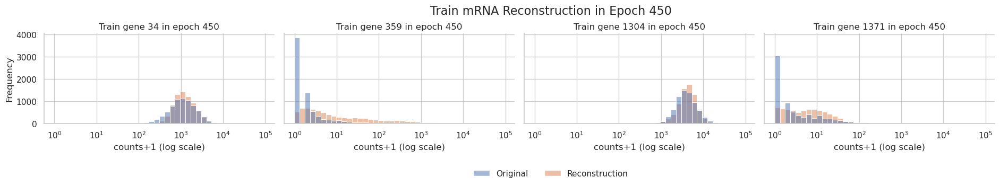

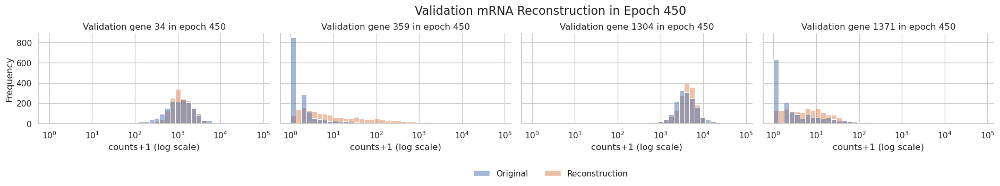

 30%|██████████████████████████▊                                                             | 456/1500 [26:51<1:25:39,  4.92s/it]

455 train_loss: 10.701425171487035 train_loss_decoder: 8.577827173445995 train_recon_mirna: 1.9726662821076515 train_recon_mrna: 6.605160891338343 train_gmm: 2.123597998041041 train_mse: 496740064.0 train_mae: 3664.3408203125 train_r2: 0.39493870735168457 train_spearman: 0.17800751328468323 train_pearson: 0.9150708317756653 train_msle: 10.72850513458252
455 test_loss: 10.734484821994956 test_loss_decoder: 8.610850402148913 test_recon_mirna: 1.9901968843551874 test_recon_mrna: 6.620653517793725 test_gmm: 2.1236344198460433 test_mse: 417232352.0 test_mae: 3387.098876953125 test_r2: 0.41470229625701904 test_spearman: 0.1834607571363449 test_pearson: 0.9034234881401062 test_msle: 11.007193565368652


 31%|███████████████████████████                                                             | 461/1500 [27:11<1:11:02,  4.10s/it]

460 train_loss: 10.695850890990252 train_loss_decoder: 8.57191668926602 train_recon_mirna: 1.970760757092407 train_recon_mrna: 6.601155932173613 train_gmm: 2.123934201724232 train_mse: 491597888.0 train_mae: 3646.997314453125 train_r2: 0.4012022018432617 train_spearman: 0.18135906755924225 train_pearson: 0.9150547385215759 train_msle: 11.253220558166504
460 test_loss: 10.726549480671094 test_loss_decoder: 8.602783930777331 test_recon_mirna: 1.9883529167497045 test_recon_mrna: 6.614431014027627 test_gmm: 2.1237655498937626 test_mse: 409359680.0 test_mae: 3362.779541015625 test_r2: 0.4257461428642273 test_spearman: 0.1883680522441864 test_pearson: 0.9015541076660156 test_msle: 11.513435363769531


 31%|███████████████████████████▎                                                            | 466/1500 [27:29<1:06:40,  3.87s/it]

465 train_loss: 10.690430468209168 train_loss_decoder: 8.566217512321836 train_recon_mirna: 1.9691281271422778 train_recon_mrna: 6.597089385179558 train_gmm: 2.124212955887331 train_mse: 489378624.0 train_mae: 3634.8935546875 train_r2: 0.40390539169311523 train_spearman: 0.18215657770633698 train_pearson: 0.9149191975593567 train_msle: 11.071990966796875
465 test_loss: 10.716234760830018 test_loss_decoder: 8.592400579800039 test_recon_mirna: 1.9845260773601514 test_recon_mrna: 6.607874502439887 test_gmm: 2.1238341810299786 test_mse: 409017152.0 test_mae: 3356.002685546875 test_r2: 0.4262266159057617 test_spearman: 0.18802815675735474 test_pearson: 0.902090311050415 test_msle: 11.23443603515625


 31%|███████████████████████████▋                                                            | 471/1500 [27:49<1:07:10,  3.92s/it]

470 train_loss: 10.684793263943943 train_loss_decoder: 8.560216082019632 train_recon_mirna: 1.967128580474851 train_recon_mrna: 6.593087501544782 train_gmm: 2.12457718192431 train_mse: 485625728.0 train_mae: 3616.0078125 train_r2: 0.40847665071487427 train_spearman: 0.17851072549819946 train_pearson: 0.9146955013275146 train_msle: 10.83260440826416
470 test_loss: 10.710542949986232 test_loss_decoder: 8.586669993637832 test_recon_mirna: 1.9823263826515676 test_recon_mrna: 6.604343610986264 test_gmm: 2.1238729563484 test_mse: 411151808.0 test_mae: 3365.705078125 test_r2: 0.42323213815689087 test_spearman: 0.188078835606575 test_pearson: 0.9022136926651001 test_msle: 11.066102981567383


 32%|████████████████████████████▌                                                             | 476/1500 [28:06<59:15,  3.47s/it]

475 train_loss: 10.679439787487736 train_loss_decoder: 8.554550071182078 train_recon_mirna: 1.9653117015097648 train_recon_mrna: 6.589238369672314 train_gmm: 2.1248897163056575 train_mse: 479324448.0 train_mae: 3587.1474609375 train_r2: 0.41615206003189087 train_spearman: 0.1813938468694687 train_pearson: 0.9140763282775879 train_msle: 11.005163192749023
475 test_loss: 10.704838687361805 test_loss_decoder: 8.580452087620722 test_recon_mirna: 1.9800611829968713 test_recon_mrna: 6.600390904623851 test_gmm: 2.124386599741083 test_mse: 405211776.0 test_mae: 3342.542236328125 test_r2: 0.4315648674964905 test_spearman: 0.19223515689373016 test_pearson: 0.9010070562362671 test_msle: 11.2740478515625


 32%|████████████████████████████▊                                                             | 481/1500 [28:23<56:08,  3.31s/it]

480 train_loss: 10.674058724019346 train_loss_decoder: 8.548910990636895 train_recon_mirna: 1.963514709877871 train_recon_mrna: 6.585396280759024 train_gmm: 2.1251477333824527 train_mse: 480374752.0 train_mae: 3594.109619140625 train_r2: 0.4148726463317871 train_spearman: 0.18616147339344025 train_pearson: 0.9139910340309143 train_msle: 10.989496231079102
480 test_loss: 10.699018544189954 test_loss_decoder: 8.574777067477967 test_recon_mirna: 1.977605595485232 test_recon_mrna: 6.597171471992735 test_gmm: 2.124241476711987 test_mse: 401342496.0 test_mae: 3327.003173828125 test_r2: 0.43699270486831665 test_spearman: 0.19860108196735382 test_pearson: 0.9002858996391296 test_msle: 11.144583702087402


 32%|█████████████████████████████▏                                                            | 486/1500 [28:39<54:04,  3.20s/it]

485 train_loss: 10.668631762865461 train_loss_decoder: 8.543219763090729 train_recon_mirna: 1.961600340353571 train_recon_mrna: 6.581619422737159 train_gmm: 2.125411999774732 train_mse: 474707680.0 train_mae: 3563.640869140625 train_r2: 0.4217755198478699 train_spearman: 0.1825450360774994 train_pearson: 0.9138231873512268 train_msle: 10.711517333984375
485 test_loss: 10.6967509146928 test_loss_decoder: 8.571776505782514 test_recon_mirna: 1.975071174752832 test_recon_mrna: 6.596705331029682 test_gmm: 2.1249744089102847 test_mse: 399909792.0 test_mae: 3317.984375 test_r2: 0.4390025734901428 test_spearman: 0.19653768837451935 test_pearson: 0.8996972441673279 test_msle: 10.831378936767578


 33%|█████████████████████████████▍                                                            | 491/1500 [28:55<54:38,  3.25s/it]

490 train_loss: 10.663342258101228 train_loss_decoder: 8.537552802004807 train_recon_mirna: 1.9597028200945188 train_recon_mrna: 6.577849981910288 train_gmm: 2.1257894560964194 train_mse: 473665280.0 train_mae: 3558.73583984375 train_r2: 0.42304527759552 train_spearman: 0.18456479907035828 train_pearson: 0.9136467576026917 train_msle: 10.637431144714355
490 test_loss: 10.69044373852672 test_loss_decoder: 8.565301073684857 test_recon_mirna: 1.9744069639165434 test_recon_mrna: 6.590894109768314 test_gmm: 2.125142664841863 test_mse: 397736608.0 test_mae: 3304.394287109375 test_r2: 0.44205111265182495 test_spearman: 0.19659318029880524 test_pearson: 0.9014783501625061 test_msle: 10.869447708129883


 33%|█████████████████████████████▊                                                            | 496/1500 [29:11<54:33,  3.26s/it]

495 train_loss: 10.6581358300472 train_loss_decoder: 8.532001306880707 train_recon_mirna: 1.957914163712616 train_recon_mrna: 6.574087143168091 train_gmm: 2.126134523166494 train_mse: 468764704.0 train_mae: 3536.89111328125 train_r2: 0.4290144443511963 train_spearman: 0.18793794512748718 train_pearson: 0.9134785532951355 train_msle: 10.696878433227539
495 test_loss: 10.685476147774402 test_loss_decoder: 8.560037205516949 test_recon_mirna: 1.9720532330589895 test_recon_mrna: 6.58798397245796 test_gmm: 2.1254389422574542 test_mse: 397959136.0 test_mae: 3307.328369140625 test_r2: 0.44173896312713623 test_spearman: 0.19738240540027618 test_pearson: 0.9010154008865356 test_msle: 10.872400283813477


 33%|██████████████████████████████                                                            | 501/1500 [29:27<54:19,  3.26s/it]

500 train_loss: 10.652949521825835 train_loss_decoder: 8.526369686470485 train_recon_mirna: 1.955811623232907 train_recon_mrna: 6.570558063237577 train_gmm: 2.1265798353553507 train_mse: 467942304.0 train_mae: 3531.047607421875 train_r2: 0.4300162196159363 train_spearman: 0.1910640001296997 train_pearson: 0.9135901927947998 train_msle: 10.633620262145996
500 test_loss: 10.68124453894751 test_loss_decoder: 8.555582662873528 test_recon_mirna: 1.9712949713877734 test_recon_mrna: 6.584287691485755 test_gmm: 2.1256618760739827 test_mse: 391735008.0 test_mae: 3281.244140625 test_r2: 0.4504702091217041 test_spearman: 0.20277200639247894 test_pearson: 0.9013593196868896 test_msle: 10.972644805908203


 34%|██████████████████████████████▎                                                           | 506/1500 [29:44<54:22,  3.28s/it]

505 train_loss: 10.647811205478202 train_loss_decoder: 8.520914230974538 train_recon_mirna: 1.9540622294335912 train_recon_mrna: 6.566852001540948 train_gmm: 2.126896974503664 train_mse: 463829536.0 train_mae: 3510.954345703125 train_r2: 0.43502581119537354 train_spearman: 0.1921803504228592 train_pearson: 0.9125680327415466 train_msle: 10.459734916687012
505 test_loss: 10.674926838182042 test_loss_decoder: 8.54862514495365 test_recon_mirna: 1.9686482749487257 test_recon_mrna: 6.579976870004925 test_gmm: 2.1263016932283927 test_mse: 385996224.0 test_mae: 3252.960205078125 test_r2: 0.45852065086364746 test_spearman: 0.20281633734703064 test_pearson: 0.9018574357032776 test_msle: 10.782369613647461


 34%|██████████████████████████████▋                                                           | 511/1500 [30:00<53:15,  3.23s/it]

510 train_loss: 10.642892396768723 train_loss_decoder: 8.515519857913134 train_recon_mirna: 1.9523135593040504 train_recon_mrna: 6.563206298609084 train_gmm: 2.1273725388555897 train_mse: 457941568.0 train_mae: 3480.003662109375 train_r2: 0.4421977400779724 train_spearman: 0.1927361637353897 train_pearson: 0.9127482771873474 train_msle: 10.183563232421875
510 test_loss: 10.667899452357297 test_loss_decoder: 8.541842601652531 test_recon_mirna: 1.9657293299399003 test_recon_mrna: 6.576113271712631 test_gmm: 2.126056850704765 test_mse: 381908256.0 test_mae: 3234.7451171875 test_r2: 0.46425527334213257 test_spearman: 0.20419074594974518 test_pearson: 0.8999692797660828 test_msle: 10.603960037231445


 34%|██████████████████████████████▉                                                           | 516/1500 [30:16<53:46,  3.28s/it]

515 train_loss: 10.638171184694423 train_loss_decoder: 8.510483273829545 train_recon_mirna: 1.9508299232758095 train_recon_mrna: 6.559653350553735 train_gmm: 2.127687910864879 train_mse: 452880736.0 train_mae: 3461.35595703125 train_r2: 0.44836217164993286 train_spearman: 0.19532327353954315 train_pearson: 0.9123325943946838 train_msle: 10.582451820373535
515 test_loss: 10.663333484173599 test_loss_decoder: 8.536485373295022 test_recon_mirna: 1.9634553921095423 test_recon_mrna: 6.57302998118548 test_gmm: 2.126848110878576 test_mse: 378754144.0 test_mae: 3218.999267578125 test_r2: 0.46867990493774414 test_spearman: 0.20713646709918976 test_pearson: 0.9001595377922058 test_msle: 10.688251495361328


 35%|███████████████████████████████▎                                                          | 521/1500 [30:33<53:06,  3.25s/it]

520 train_loss: 10.633522844032514 train_loss_decoder: 8.505459438605177 train_recon_mirna: 1.9492768348568055 train_recon_mrna: 6.556182603748371 train_gmm: 2.1280634054273366 train_mse: 451355552.0 train_mae: 3451.543212890625 train_r2: 0.45021992921829224 train_spearman: 0.19493290781974792 train_pearson: 0.9124172329902649 train_msle: 10.295092582702637
520 test_loss: 10.65950188023932 test_loss_decoder: 8.532140418410705 test_recon_mirna: 1.9625920745340295 test_recon_mrna: 6.569548343876675 test_gmm: 2.1273614618286154 test_mse: 378399584.0 test_mae: 3213.06689453125 test_r2: 0.4691773056983948 test_spearman: 0.20801925659179688 test_pearson: 0.9008647203445435 test_msle: 10.551617622375488


 35%|███████████████████████████████▍                                                          | 525/1500 [30:45<52:11,  3.21s/it]

525 train_loss: 10.628753570878008 train_loss_decoder: 8.500379209188722 train_recon_mirna: 1.947749858003615 train_recon_mrna: 6.552629351185106 train_gmm: 2.1283743616892847 train_mse: 450532288.0 train_mae: 3441.973876953125 train_r2: 0.4512227177619934 train_spearman: 0.19327324628829956 train_pearson: 0.9122921228408813 train_msle: 9.861190795898438
525 test_loss: 10.65487440373554 test_loss_decoder: 8.527096158710693 test_recon_mirna: 1.9608206958390668 test_recon_mrna: 6.566275462871626 test_gmm: 2.127778245024847 test_mse: 376193952.0 test_mae: 3200.618896484375 test_r2: 0.4722713828086853 test_spearman: 0.2063726782798767 test_pearson: 0.899250864982605 test_msle: 10.073785781860352


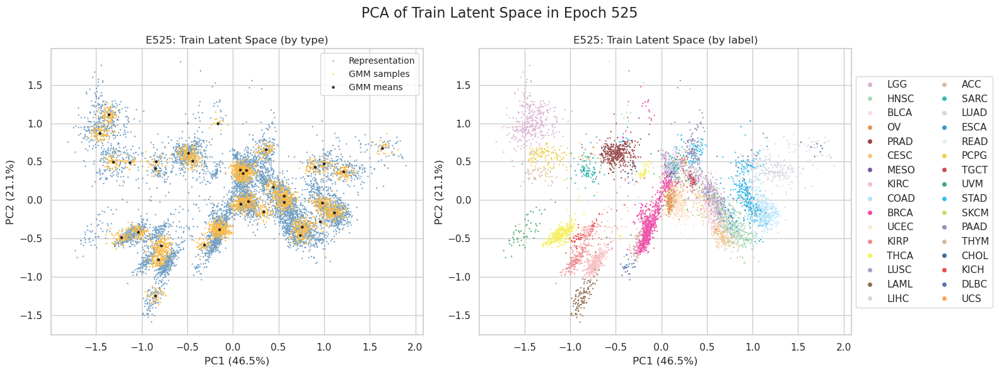

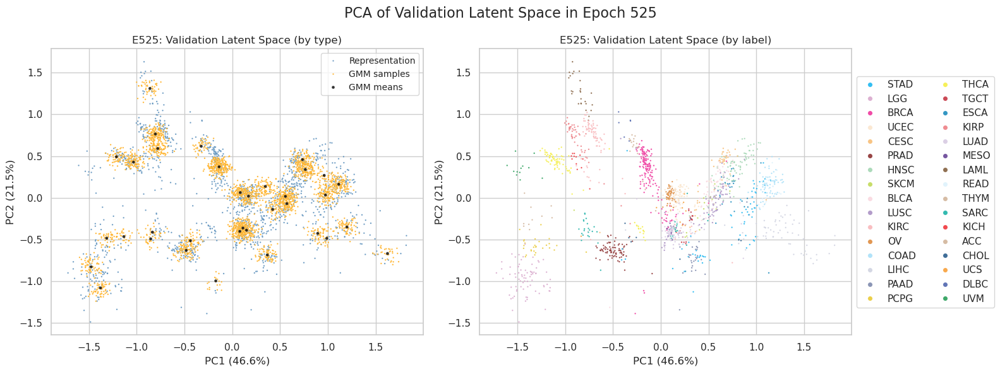

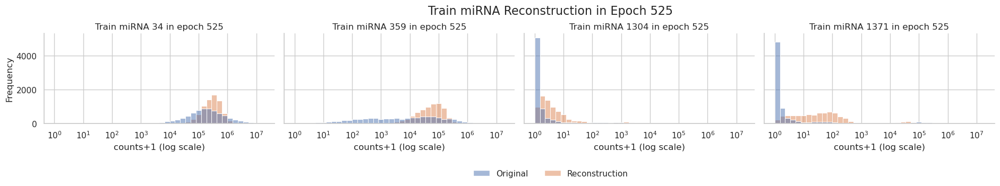

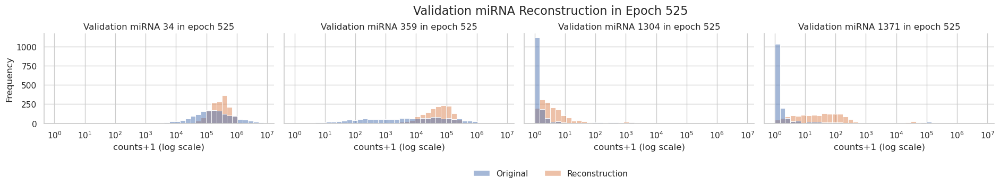

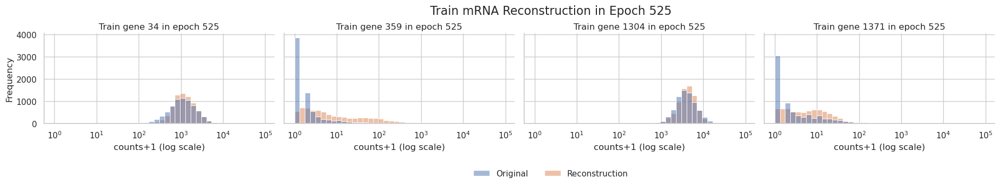

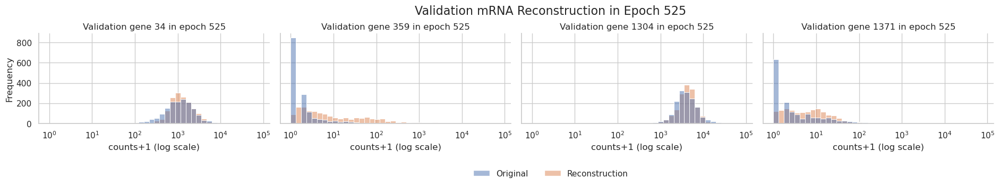

 35%|███████████████████████████████▏                                                        | 531/1500 [31:21<1:05:36,  4.06s/it]

530 train_loss: 10.623961658985898 train_loss_decoder: 8.495250411898201 train_recon_mirna: 1.9462008116434848 train_recon_mrna: 6.549049600254717 train_gmm: 2.1287112470876974 train_mse: 443833312.0 train_mae: 3413.10205078125 train_r2: 0.4593825340270996 train_spearman: 0.2017444223165512 train_pearson: 0.9118712544441223 train_msle: 10.117181777954102
530 test_loss: 10.650538169115958 test_loss_decoder: 8.522334396460725 test_recon_mirna: 1.9593337454834292 test_recon_mrna: 6.563000650977295 test_gmm: 2.128203772655234 test_mse: 369403968.0 test_mae: 3171.505126953125 test_r2: 0.4817964434623718 test_spearman: 0.20989446341991425 test_pearson: 0.9000304937362671 test_msle: 10.469147682189941


 36%|████████████████████████████████▏                                                         | 536/1500 [31:38<54:43,  3.41s/it]

535 train_loss: 10.619139233578675 train_loss_decoder: 8.490087716318929 train_recon_mirna: 1.944567717630024 train_recon_mrna: 6.545519998688904 train_gmm: 2.1290515172597475 train_mse: 444902400.0 train_mae: 3413.418212890625 train_r2: 0.4580802917480469 train_spearman: 0.19910717010498047 train_pearson: 0.9118513464927673 train_msle: 9.725519180297852
535 test_loss: 10.64840986260685 test_loss_decoder: 8.519616847414348 test_recon_mirna: 1.9603353598882052 test_recon_mrna: 6.5592814875261425 test_gmm: 2.128793015192504 test_mse: 370675488.0 test_mae: 3169.55908203125 test_r2: 0.4800127148628235 test_spearman: 0.21201248466968536 test_pearson: 0.8996098041534424 test_msle: 9.987958908081055


 36%|████████████████████████████████▍                                                         | 541/1500 [31:54<52:07,  3.26s/it]

540 train_loss: 10.614380285001332 train_loss_decoder: 8.48519424550852 train_recon_mirna: 1.943114437800203 train_recon_mrna: 6.542079807708317 train_gmm: 2.1291860394928115 train_mse: 438973600.0 train_mae: 3389.5283203125 train_r2: 0.4653019309043884 train_spearman: 0.20270398259162903 train_pearson: 0.9113115072250366 train_msle: 10.023651123046875
540 test_loss: 10.642095825222881 test_loss_decoder: 8.513136150922712 test_recon_mirna: 1.9563672876247988 test_recon_mrna: 6.556768863297913 test_gmm: 2.1289596743001695 test_mse: 366603904.0 test_mae: 3155.91015625 test_r2: 0.48572438955307007 test_spearman: 0.2127564400434494 test_pearson: 0.8985501527786255 test_msle: 10.319005966186523


 36%|████████████████████████████████                                                        | 546/1500 [32:14<1:00:49,  3.83s/it]

545 train_loss: 10.609529474447159 train_loss_decoder: 8.480210446347176 train_recon_mirna: 1.9414556735518822 train_recon_mrna: 6.5387547727952935 train_gmm: 2.129319028099984 train_mse: 436155488.0 train_mae: 3373.200927734375 train_r2: 0.4687345623970032 train_spearman: 0.2030729502439499 train_pearson: 0.9115704894065857 train_msle: 9.679255485534668
545 test_loss: 10.638013863529348 test_loss_decoder: 8.50880049868284 test_recon_mirna: 1.9543630997930956 test_recon_mrna: 6.554437398889744 test_gmm: 2.1292133648465077 test_mse: 361099616.0 test_mae: 3129.596923828125 test_r2: 0.49344587326049805 test_spearman: 0.2123638242483139 test_pearson: 0.8975728154182434 test_msle: 10.072203636169434


 37%|████████████████████████████████▎                                                       | 551/1500 [32:33<1:01:40,  3.90s/it]

550 train_loss: 10.604891676332441 train_loss_decoder: 8.475328762822842 train_recon_mirna: 1.9400787574281986 train_recon_mrna: 6.535250005394644 train_gmm: 2.129562913509598 train_mse: 428335488.0 train_mae: 3342.981201171875 train_r2: 0.4782598614692688 train_spearman: 0.20427212119102478 train_pearson: 0.9102237224578857 train_msle: 10.206563949584961
550 test_loss: 10.632718940474376 test_loss_decoder: 8.503347872485453 test_recon_mirna: 1.953077680554564 test_recon_mrna: 6.550270191930888 test_gmm: 2.1293710679889233 test_mse: 359315936.0 test_mae: 3129.487548828125 test_r2: 0.49594801664352417 test_spearman: 0.21490414440631866 test_pearson: 0.8971042633056641 test_msle: 10.487784385681152


 37%|█████████████████████████████████▎                                                        | 556/1500 [32:50<52:43,  3.35s/it]

555 train_loss: 10.600392737232228 train_loss_decoder: 8.470669643047872 train_recon_mirna: 1.9388891871687712 train_recon_mrna: 6.531780455879101 train_gmm: 2.129723094184356 train_mse: 429934816.0 train_mae: 3343.728759765625 train_r2: 0.47631174325942993 train_spearman: 0.20781514048576355 train_pearson: 0.9106334447860718 train_msle: 9.787951469421387
555 test_loss: 10.630937367363847 test_loss_decoder: 8.50119516970455 test_recon_mirna: 1.9532618746091381 test_recon_mrna: 6.5479332950954126 test_gmm: 2.1297421976592976 test_mse: 358103776.0 test_mae: 3118.306640625 test_r2: 0.4976484179496765 test_spearman: 0.21769456565380096 test_pearson: 0.8965213894844055 test_msle: 10.030274391174316


 37%|█████████████████████████████████▋                                                        | 561/1500 [33:06<50:52,  3.25s/it]

560 train_loss: 10.595679862264145 train_loss_decoder: 8.465755519119009 train_recon_mirna: 1.9372314567728466 train_recon_mrna: 6.528524062346162 train_gmm: 2.129924343145137 train_mse: 427555136.0 train_mae: 3333.7802734375 train_r2: 0.47921037673950195 train_spearman: 0.2045227587223053 train_pearson: 0.9102764129638672 train_msle: 9.69261360168457
560 test_loss: 10.622590861728202 test_loss_decoder: 8.492795813043395 test_recon_mirna: 1.9496721315649341 test_recon_mrna: 6.543123681478462 test_gmm: 2.1297950486848065 test_mse: 355507840.0 test_mae: 3101.00390625 test_r2: 0.5012900829315186 test_spearman: 0.21472935378551483 test_pearson: 0.8957857489585876 test_msle: 9.81070327758789


 38%|█████████████████████████████████▉                                                        | 566/1500 [33:22<51:08,  3.29s/it]

565 train_loss: 10.591136087849488 train_loss_decoder: 8.460996116717375 train_recon_mirna: 1.935886522817888 train_recon_mrna: 6.525109593899487 train_gmm: 2.130139971132114 train_mse: 423410912.0 train_mae: 3311.78076171875 train_r2: 0.4842582941055298 train_spearman: 0.21102362871170044 train_pearson: 0.9100355505943298 train_msle: 9.482583999633789
565 test_loss: 10.620535916491171 test_loss_decoder: 8.490807800707106 test_recon_mirna: 1.9494597890965417 test_recon_mrna: 6.541348011610565 test_gmm: 2.1297281157840655 test_mse: 355063584.0 test_mae: 3099.659912109375 test_r2: 0.5019132494926453 test_spearman: 0.22121010720729828 test_pearson: 0.8959923386573792 test_msle: 9.737342834472656


 38%|██████████████████████████████████▎                                                       | 571/1500 [33:41<58:45,  3.79s/it]

570 train_loss: 10.586985274176474 train_loss_decoder: 8.45661521777862 train_recon_mirna: 1.9347953138080936 train_recon_mrna: 6.521819903970525 train_gmm: 2.1303700563978554 train_mse: 418641120.0 train_mae: 3292.34228515625 train_r2: 0.4900681972503662 train_spearman: 0.21153610944747925 train_pearson: 0.909874439239502 train_msle: 9.814099311828613
570 test_loss: 10.613874111750722 test_loss_decoder: 8.483732451772259 test_recon_mirna: 1.9462327148507772 test_recon_mrna: 6.537499736921482 test_gmm: 2.130141659978462 test_mse: 349673664.0 test_mae: 3083.946044921875 test_r2: 0.5094742774963379 test_spearman: 0.22219966351985931 test_pearson: 0.8963544368743896 test_msle: 10.078826904296875


 38%|█████████████████████████████████▊                                                      | 576/1500 [34:01<1:02:00,  4.03s/it]

575 train_loss: 10.582661531265114 train_loss_decoder: 8.45202159669235 train_recon_mirna: 1.933377543028318 train_recon_mrna: 6.518644053664032 train_gmm: 2.1306399345727627 train_mse: 414308448.0 train_mae: 3270.62255859375 train_r2: 0.49534571170806885 train_spearman: 0.21303080022335052 train_pearson: 0.9097958207130432 train_msle: 9.550195693969727
575 test_loss: 10.609888325800597 test_loss_decoder: 8.479487050046776 test_recon_mirna: 1.9455925921914112 test_recon_mrna: 6.533894457855364 test_gmm: 2.1304012757538198 test_mse: 349024512.0 test_mae: 3077.224365234375 test_r2: 0.5103849172592163 test_spearman: 0.22117795050144196 test_pearson: 0.8972564935684204 test_msle: 9.84747314453125


 39%|██████████████████████████████████▊                                                       | 581/1500 [34:19<52:30,  3.43s/it]

580 train_loss: 10.578375139605269 train_loss_decoder: 8.447478670087367 train_recon_mirna: 1.9320445645553814 train_recon_mrna: 6.515434105531987 train_gmm: 2.130896469517902 train_mse: 412932256.0 train_mae: 3262.820068359375 train_r2: 0.49702197313308716 train_spearman: 0.21390511095523834 train_pearson: 0.9102175831794739 train_msle: 9.362702369689941
580 test_loss: 10.605341101064512 test_loss_decoder: 8.474442358059914 test_recon_mirna: 1.9430120350271607 test_recon_mrna: 6.531430323032754 test_gmm: 2.130898743004598 test_mse: 345446272.0 test_mae: 3053.56396484375 test_r2: 0.515404462814331 test_spearman: 0.22189848124980927 test_pearson: 0.8982666730880737 test_msle: 9.669718742370605


 39%|███████████████████████████████████▏                                                      | 586/1500 [34:35<49:39,  3.26s/it]

585 train_loss: 10.574453277522803 train_loss_decoder: 8.443341241002033 train_recon_mirna: 1.9309608935482256 train_recon_mrna: 6.5123803474538065 train_gmm: 2.1311120365207694 train_mse: 407772096.0 train_mae: 3241.822265625 train_r2: 0.5033073425292969 train_spearman: 0.21619921922683716 train_pearson: 0.9097598791122437 train_msle: 9.661399841308594
585 test_loss: 10.602552340180067 test_loss_decoder: 8.471304516446786 test_recon_mirna: 1.9414148197115153 test_recon_mrna: 6.52988969673527 test_gmm: 2.131247823733281 test_mse: 339248000.0 test_mae: 3029.48046875 test_r2: 0.5240995287895203 test_spearman: 0.22371526062488556 test_pearson: 0.8977023959159851 test_msle: 9.934983253479004


 39%|███████████████████████████████████▍                                                      | 591/1500 [34:51<49:53,  3.29s/it]

590 train_loss: 10.570256769199673 train_loss_decoder: 8.43896559699175 train_recon_mirna: 1.9297232186183555 train_recon_mrna: 6.509242378373395 train_gmm: 2.1312911722079235 train_mse: 408156000.0 train_mae: 3239.057861328125 train_r2: 0.5028398036956787 train_spearman: 0.2177303582429886 train_pearson: 0.9095988273620605 train_msle: 9.287476539611816
590 test_loss: 10.597461471987042 test_loss_decoder: 8.46610364247022 test_recon_mirna: 1.9397742976597354 test_recon_mrna: 6.526329344810485 test_gmm: 2.1313578295168236 test_mse: 335083904.0 test_mae: 3003.109130859375 test_r2: 0.5299409627914429 test_spearman: 0.22475941479206085 test_pearson: 0.89809650182724 test_msle: 9.49392032623291


 40%|███████████████████████████████████▊                                                      | 596/1500 [35:07<48:24,  3.21s/it]

595 train_loss: 10.566069896239632 train_loss_decoder: 8.434556292738398 train_recon_mirna: 1.9284815394272339 train_recon_mrna: 6.5060747533111645 train_gmm: 2.1315136035012348 train_mse: 404463008.0 train_mae: 3221.25439453125 train_r2: 0.5073380470275879 train_spearman: 0.21871232986450195 train_pearson: 0.9088129997253418 train_msle: 9.082128524780273
595 test_loss: 10.592846440968156 test_loss_decoder: 8.461410208703388 test_recon_mirna: 1.9394079651582565 test_recon_mrna: 6.522002243545132 test_gmm: 2.1314362322647686 test_mse: 334114848.0 test_mae: 3002.62451171875 test_r2: 0.5313003659248352 test_spearman: 0.22768966853618622 test_pearson: 0.89765864610672 test_msle: 9.411131858825684


 40%|████████████████████████████████████                                                      | 600/1500 [35:20<47:57,  3.20s/it]

600 train_loss: 10.561826191796014 train_loss_decoder: 8.43009962805144 train_recon_mirna: 1.9270806844957062 train_recon_mrna: 6.503018943555735 train_gmm: 2.1317265637445737 train_mse: 401701760.0 train_mae: 3210.3427734375 train_r2: 0.5107014179229736 train_spearman: 0.21973179280757904 train_pearson: 0.9095805287361145 train_msle: 9.218912124633789
600 test_loss: 10.588677334611763 test_loss_decoder: 8.456873605351245 test_recon_mirna: 1.9370351095418252 test_recon_mrna: 6.519838495809418 test_gmm: 2.131803729260519 test_mse: 331663968.0 test_mae: 2987.982421875 test_r2: 0.5347384810447693 test_spearman: 0.2265428751707077 test_pearson: 0.8984776735305786 test_msle: 9.495628356933594


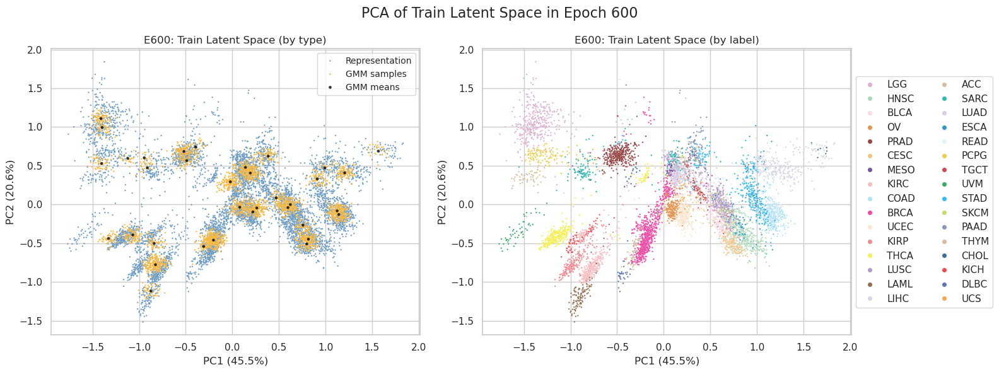

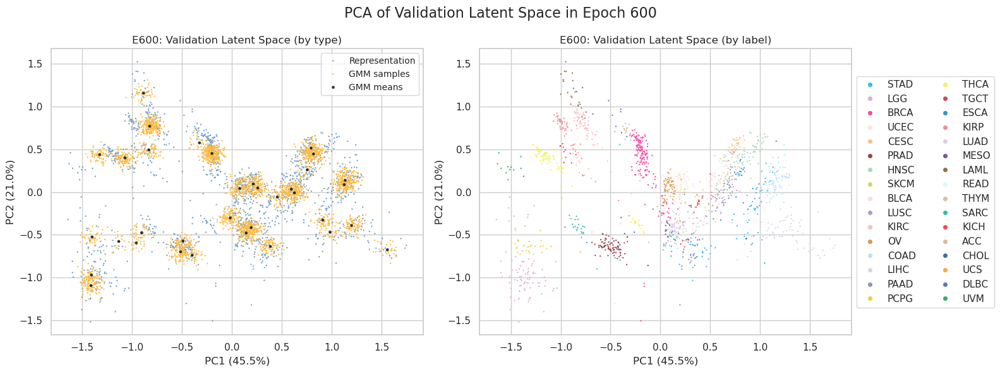

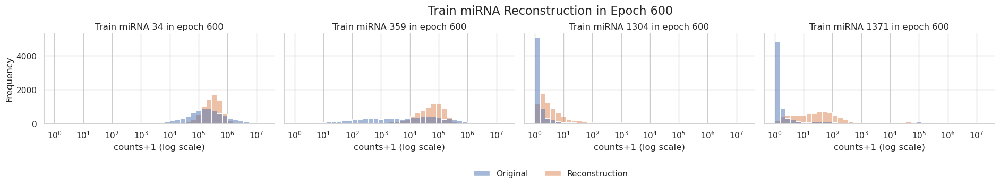

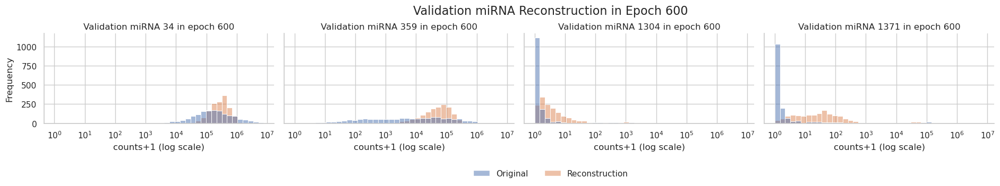

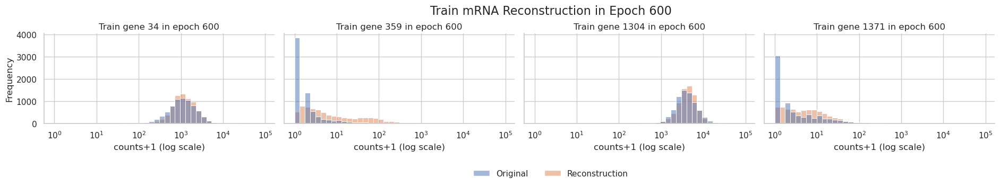

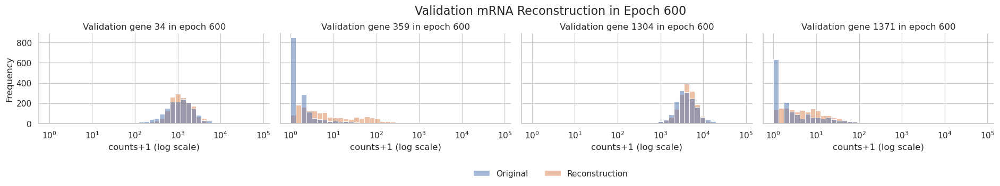

 40%|████████████████████████████████████▎                                                     | 606/1500 [35:55<59:24,  3.99s/it]

605 train_loss: 10.558249399733372 train_loss_decoder: 8.426289486984208 train_recon_mirna: 1.9260006400426035 train_recon_mrna: 6.500288846941604 train_gmm: 2.1319599127491635 train_mse: 399564320.0 train_mae: 3198.5634765625 train_r2: 0.5133049488067627 train_spearman: 0.22552138566970825 train_pearson: 0.9096274971961975 train_msle: 9.132938385009766
605 test_loss: 10.588685151613689 test_loss_decoder: 8.456647870981953 test_recon_mirna: 1.9375411883857663 test_recon_mrna: 6.519106682596187 test_gmm: 2.1320372806317343 test_mse: 329760608.0 test_mae: 2980.405029296875 test_r2: 0.5374085307121277 test_spearman: 0.23269633948802948 test_pearson: 0.8986349701881409 test_msle: 9.27938461303711


 41%|████████████████████████████████████▋                                                     | 611/1500 [36:12<53:23,  3.60s/it]

610 train_loss: 10.55445279001861 train_loss_decoder: 8.4222007671197 train_recon_mirna: 1.924691256163579 train_recon_mrna: 6.497509510956121 train_gmm: 2.1322520228989106 train_mse: 396633856.0 train_mae: 3184.501708984375 train_r2: 0.5168744325637817 train_spearman: 0.2273656278848648 train_pearson: 0.9092089533805847 train_msle: 9.219888687133789
610 test_loss: 10.584515821291637 test_loss_decoder: 8.452199129311387 test_recon_mirna: 1.9352429046628508 test_recon_mrna: 6.516956224648536 test_gmm: 2.1323166919802503 test_mse: 327990944.0 test_mae: 2974.072265625 test_r2: 0.5398910045623779 test_spearman: 0.23146483302116394 test_pearson: 0.8986089825630188 test_msle: 9.626011848449707


 41%|████████████████████████████████████▉                                                     | 616/1500 [36:32<57:41,  3.92s/it]

615 train_loss: 10.550966415500376 train_loss_decoder: 8.418452144596516 train_recon_mirna: 1.9237649202467915 train_recon_mrna: 6.494687224349725 train_gmm: 2.1325142709038594 train_mse: 395469952.0 train_mae: 3177.13134765625 train_r2: 0.5182921886444092 train_spearman: 0.22949087619781494 train_pearson: 0.9089886546134949 train_msle: 9.00672435760498
615 test_loss: 10.578873402331116 test_loss_decoder: 8.446299253970537 test_recon_mirna: 1.9331651670161953 test_recon_mrna: 6.513134086954342 test_gmm: 2.13257414836058 test_mse: 330057952.0 test_mae: 2980.488525390625 test_r2: 0.5369914174079895 test_spearman: 0.2337666004896164 test_pearson: 0.8987191319465637 test_msle: 9.265070915222168


 41%|█████████████████████████████████████▎                                                    | 621/1500 [36:51<55:29,  3.79s/it]

620 train_loss: 10.546840863712848 train_loss_decoder: 8.414072239912617 train_recon_mirna: 1.9224530171091763 train_recon_mrna: 6.49161922280344 train_gmm: 2.132768623800231 train_mse: 393354336.0 train_mae: 3166.18212890625 train_r2: 0.5208691358566284 train_spearman: 0.234145388007164 train_pearson: 0.9096086621284485 train_msle: 8.830350875854492
620 test_loss: 10.575490747287063 test_loss_decoder: 8.442760810448869 test_recon_mirna: 1.9317660664777063 test_recon_mrna: 6.510994743971162 test_gmm: 2.1327299368381945 test_mse: 326413088.0 test_mae: 2964.53466796875 test_r2: 0.5421044826507568 test_spearman: 0.23780457675457 test_pearson: 0.8997249603271484 test_msle: 9.2089204788208


 42%|█████████████████████████████████████▌                                                    | 626/1500 [37:10<55:15,  3.79s/it]

625 train_loss: 10.543164599607811 train_loss_decoder: 8.41023794264467 train_recon_mirna: 1.9211797329184837 train_recon_mrna: 6.489058209726186 train_gmm: 2.1329266569631407 train_mse: 392024160.0 train_mae: 3159.897705078125 train_r2: 0.5224893689155579 train_spearman: 0.23493938148021698 train_pearson: 0.9089646935462952 train_msle: 8.919639587402344
625 test_loss: 10.570694072407775 test_loss_decoder: 8.437928779399114 test_recon_mirna: 1.9306173348750704 test_recon_mrna: 6.507311444524044 test_gmm: 2.1327652930086614 test_mse: 325814560.0 test_mae: 2964.081298828125 test_r2: 0.542944073677063 test_spearman: 0.23865868151187897 test_pearson: 0.8991643190383911 test_msle: 9.296998977661133


 42%|█████████████████████████████████████▊                                                    | 631/1500 [37:29<56:42,  3.92s/it]

630 train_loss: 10.539495950047854 train_loss_decoder: 8.406422263197522 train_recon_mirna: 1.9201347189248945 train_recon_mrna: 6.486287544272627 train_gmm: 2.1330736868503326 train_mse: 387385856.0 train_mae: 3135.92822265625 train_r2: 0.5281391143798828 train_spearman: 0.23558315634727478 train_pearson: 0.9082379341125488 train_msle: 8.726848602294922
630 test_loss: 10.56747675489135 test_loss_decoder: 8.434743990502882 test_recon_mirna: 1.9289354195826127 test_recon_mrna: 6.50580857092027 test_gmm: 2.1327327643884684 test_mse: 322050048.0 test_mae: 2949.29638671875 test_r2: 0.548224925994873 test_spearman: 0.24036893248558044 test_pearson: 0.8979974985122681 test_msle: 9.03232192993164


 42%|██████████████████████████████████████▏                                                   | 636/1500 [37:49<56:07,  3.90s/it]

635 train_loss: 10.535763458269383 train_loss_decoder: 8.402508526957403 train_recon_mirna: 1.9188972921680236 train_recon_mrna: 6.48361123478938 train_gmm: 2.13325493131198 train_mse: 388841120.0 train_mae: 3141.490234375 train_r2: 0.5263665318489075 train_spearman: 0.2413853108882904 train_pearson: 0.9085356593132019 train_msle: 8.575886726379395
635 test_loss: 10.567970023336663 test_loss_decoder: 8.434661193020158 test_recon_mirna: 1.928022027843473 test_recon_mrna: 6.506639165176685 test_gmm: 2.1333088303165058 test_mse: 321630656.0 test_mae: 2944.050048828125 test_r2: 0.5488133430480957 test_spearman: 0.2455720454454422 test_pearson: 0.8988717794418335 test_msle: 8.883347511291504


 43%|██████████████████████████████████████▍                                                   | 641/1500 [38:08<55:46,  3.90s/it]

640 train_loss: 10.532686875936406 train_loss_decoder: 8.399264287795699 train_recon_mirna: 1.9178980332047972 train_recon_mrna: 6.4813662545909025 train_gmm: 2.1334225881407067 train_mse: 385781632.0 train_mae: 3125.7802734375 train_r2: 0.5300931930541992 train_spearman: 0.23913735151290894 train_pearson: 0.908380389213562 train_msle: 8.50816535949707
640 test_loss: 10.563344263447057 test_loss_decoder: 8.430047215738995 test_recon_mirna: 1.9272756722267808 test_recon_mrna: 6.502771543512215 test_gmm: 2.1332970477080626 test_mse: 320937664.0 test_mae: 2941.246337890625 test_r2: 0.5497854948043823 test_spearman: 0.24139076471328735 test_pearson: 0.8974714875221252 test_msle: 8.831335067749023


 43%|██████████████████████████████████████▊                                                   | 646/1500 [38:27<54:23,  3.82s/it]

645 train_loss: 10.529028141189887 train_loss_decoder: 8.395494892249019 train_recon_mirna: 1.9167659004002 train_recon_mrna: 6.478728991848819 train_gmm: 2.133533248940868 train_mse: 386449632.0 train_mae: 3124.788818359375 train_r2: 0.5292794704437256 train_spearman: 0.24152983725070953 train_pearson: 0.9090067148208618 train_msle: 8.151679992675781
645 test_loss: 10.559861160380528 test_loss_decoder: 8.426352336304733 test_recon_mirna: 1.9260000488489555 test_recon_mrna: 6.500352287455777 test_gmm: 2.1335088240757942 test_mse: 316036352.0 test_mae: 2913.466796875 test_r2: 0.5566610097885132 test_spearman: 0.24584586918354034 test_pearson: 0.8969366550445557 test_msle: 8.492705345153809


 43%|███████████████████████████████████████                                                   | 651/1500 [38:47<55:28,  3.92s/it]

650 train_loss: 10.525385603502128 train_loss_decoder: 8.391735787792372 train_recon_mirna: 1.9155826765094823 train_recon_mrna: 6.47615311128289 train_gmm: 2.1336498157097554 train_mse: 382218688.0 train_mae: 3110.474365234375 train_r2: 0.5344330668449402 train_spearman: 0.24524594843387604 train_pearson: 0.9092410802841187 train_msle: 8.499468803405762
650 test_loss: 10.552226232143818 test_loss_decoder: 8.418561720457722 test_recon_mirna: 1.924038382214798 test_recon_mrna: 6.494523338242924 test_gmm: 2.1336645116860953 test_mse: 312942144.0 test_mae: 2897.893798828125 test_r2: 0.5610016584396362 test_spearman: 0.25022515654563904 test_pearson: 0.8974282145500183 test_msle: 8.706707000732422


 44%|███████████████████████████████████████▎                                                  | 656/1500 [39:06<54:59,  3.91s/it]

655 train_loss: 10.522170241563531 train_loss_decoder: 8.38838538136649 train_recon_mirna: 1.9146747867738483 train_recon_mrna: 6.473710594592642 train_gmm: 2.133784860197041 train_mse: 383248320.0 train_mae: 3113.04833984375 train_r2: 0.5331789255142212 train_spearman: 0.24753603339195251 train_pearson: 0.908973753452301 train_msle: 8.310306549072266
655 test_loss: 10.55093876492564 test_loss_decoder: 8.417356694126944 test_recon_mirna: 1.9233160473266269 test_recon_mrna: 6.4940406468003165 test_gmm: 2.133582070798695 test_mse: 314898080.0 test_mae: 2907.204833984375 test_r2: 0.5582578182220459 test_spearman: 0.24984973669052124 test_pearson: 0.8984729051589966 test_msle: 8.603585243225098


 44%|███████████████████████████████████████▋                                                  | 661/1500 [39:26<54:32,  3.90s/it]

660 train_loss: 10.518675737930122 train_loss_decoder: 8.384796829502118 train_recon_mirna: 1.9134975655759527 train_recon_mrna: 6.4712992639261655 train_gmm: 2.133878908428004 train_mse: 380097952.0 train_mae: 3097.82861328125 train_r2: 0.5370162725448608 train_spearman: 0.2500709891319275 train_pearson: 0.9089380502700806 train_msle: 8.308635711669922
660 test_loss: 10.552031940622056 test_loss_decoder: 8.417805819325846 test_recon_mirna: 1.9225521402242298 test_recon_mrna: 6.495253679101616 test_gmm: 2.1342261212962104 test_mse: 311783136.0 test_mae: 2894.86083984375 test_r2: 0.5626275539398193 test_spearman: 0.2531743347644806 test_pearson: 0.8973194360733032 test_msle: 8.489156723022461


 44%|███████████████████████████████████████▉                                                  | 666/1500 [39:45<54:24,  3.91s/it]

665 train_loss: 10.51566077956731 train_loss_decoder: 8.381653084057234 train_recon_mirna: 1.9125645564284568 train_recon_mrna: 6.469088527628778 train_gmm: 2.134007695510076 train_mse: 376254016.0 train_mae: 3081.419921875 train_r2: 0.5416984558105469 train_spearman: 0.25126540660858154 train_pearson: 0.9083427786827087 train_msle: 8.569437980651855
665 test_loss: 10.544365080599366 test_loss_decoder: 8.409888247063815 test_recon_mirna: 1.920886435449147 test_recon_mrna: 6.489001811614669 test_gmm: 2.134476833535552 test_mse: 313285824.0 test_mae: 2902.469970703125 test_r2: 0.5605195760726929 test_spearman: 0.2514597177505493 test_pearson: 0.898457407951355 test_msle: 8.835624694824219


 45%|████████████████████████████████████████▎                                                 | 671/1500 [40:05<54:35,  3.95s/it]

670 train_loss: 10.512637622016433 train_loss_decoder: 8.37854112368665 train_recon_mirna: 1.9116216942075979 train_recon_mrna: 6.466919429479052 train_gmm: 2.1340964983297823 train_mse: 377667296.0 train_mae: 3087.289306640625 train_r2: 0.539976954460144 train_spearman: 0.25491413474082947 train_pearson: 0.9085820317268372 train_msle: 8.253493309020996
670 test_loss: 10.546019763965377 test_loss_decoder: 8.41139864264014 test_recon_mirna: 1.9240455613912513 test_recon_mrna: 6.48735308124889 test_gmm: 2.134621121325237 test_mse: 313112928.0 test_mae: 2898.615478515625 test_r2: 0.5607620477676392 test_spearman: 0.25466644763946533 test_pearson: 0.8996772766113281 test_msle: 8.403593063354492


 45%|████████████████████████████████████████▌                                                 | 675/1500 [40:21<53:15,  3.87s/it]

675 train_loss: 10.509223628839779 train_loss_decoder: 8.375061460425316 train_recon_mirna: 1.910409185499456 train_recon_mrna: 6.46465227492586 train_gmm: 2.134162168414463 train_mse: 375606944.0 train_mae: 3071.80029296875 train_r2: 0.5424866080284119 train_spearman: 0.25544291734695435 train_pearson: 0.9084945917129517 train_msle: 8.130674362182617
675 test_loss: 10.5432879451519 test_loss_decoder: 8.408771270115906 test_recon_mirna: 1.9187256805848611 test_recon_mrna: 6.490045589531046 test_gmm: 2.134516675035993 test_mse: 305866240.0 test_mae: 2860.481689453125 test_r2: 0.5709277391433716 test_spearman: 0.2562706470489502 test_pearson: 0.8996919393539429 test_msle: 8.295421600341797


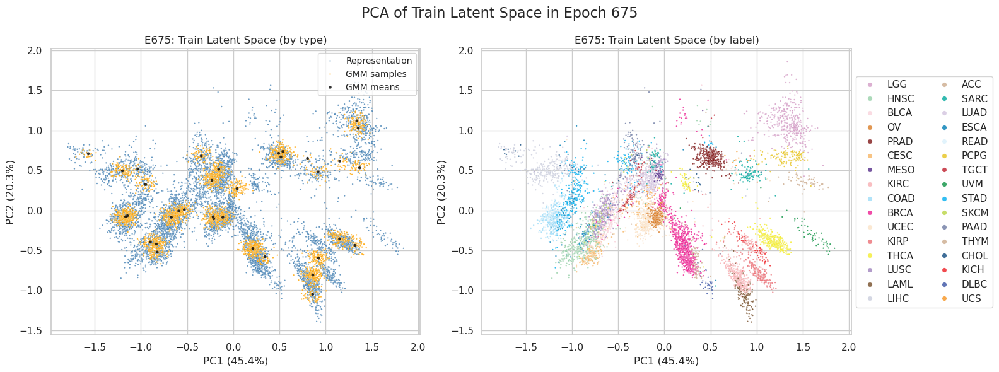

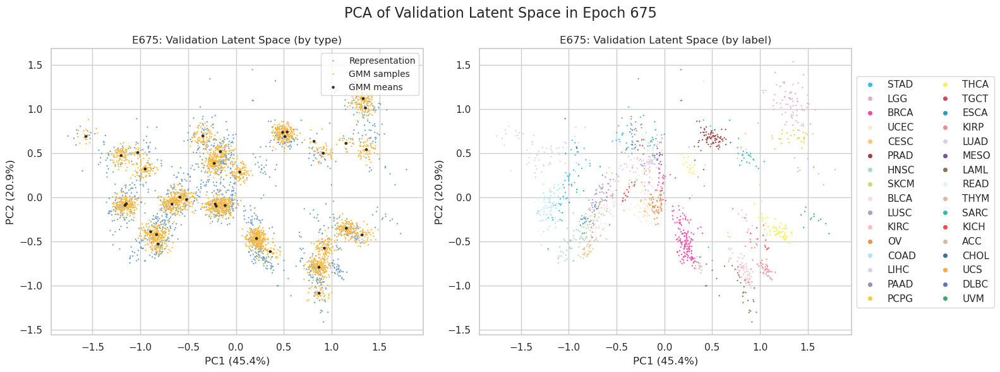

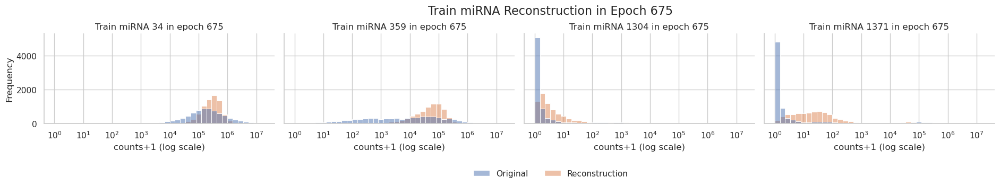

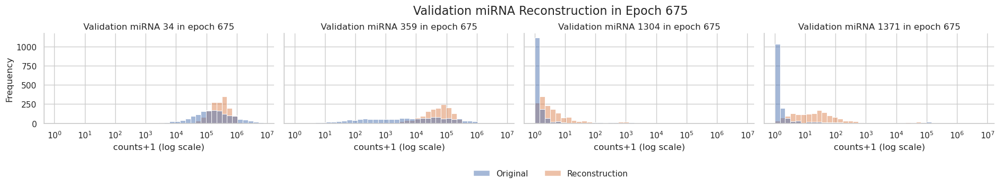

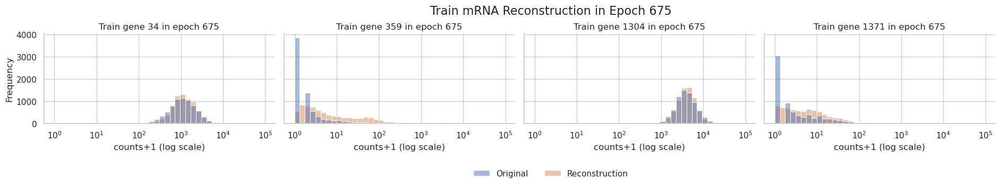

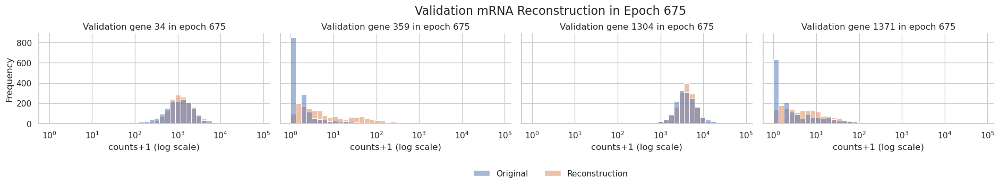

 45%|███████████████████████████████████████▉                                                | 681/1500 [41:02<1:06:24,  4.87s/it]

680 train_loss: 10.506119846427506 train_loss_decoder: 8.371778648736937 train_recon_mirna: 1.9092107071072175 train_recon_mrna: 6.46256794162972 train_gmm: 2.1343411976905693 train_mse: 375695840.0 train_mae: 3075.433837890625 train_r2: 0.542378306388855 train_spearman: 0.2589360773563385 train_pearson: 0.9089284539222717 train_msle: 8.23571491241455
680 test_loss: 10.537340252157195 test_loss_decoder: 8.40294727927091 test_recon_mirna: 1.9185576967339484 test_recon_mrna: 6.484389582536962 test_gmm: 2.1343929728862854 test_mse: 308724384.0 test_mae: 2877.965576171875 test_r2: 0.5669183731079102 test_spearman: 0.260270357131958 test_pearson: 0.8993207812309265 test_msle: 8.418547630310059


 46%|█████████████████████████████████████████▏                                                | 686/1500 [41:22<56:31,  4.17s/it]

685 train_loss: 10.5032164285133 train_loss_decoder: 8.368801057344097 train_recon_mirna: 1.908284612906896 train_recon_mrna: 6.460516444437201 train_gmm: 2.134415371169202 train_mse: 373842528.0 train_mae: 3063.145263671875 train_r2: 0.5446357727050781 train_spearman: 0.2618098258972168 train_pearson: 0.9090518951416016 train_msle: 7.937889575958252
685 test_loss: 10.533184776654785 test_loss_decoder: 8.398536652823104 test_recon_mirna: 1.917547866015908 test_recon_mrna: 6.480988786807196 test_gmm: 2.134648123831681 test_mse: 308018272.0 test_mae: 2870.839599609375 test_r2: 0.5679088830947876 test_spearman: 0.261549174785614 test_pearson: 0.8991578817367554 test_msle: 8.252557754516602


 46%|█████████████████████████████████████████▍                                                | 691/1500 [41:41<53:26,  3.96s/it]

690 train_loss: 10.499865292844365 train_loss_decoder: 8.365316223349861 train_recon_mirna: 1.9072380188112905 train_recon_mrna: 6.458078204538571 train_gmm: 2.134549069494504 train_mse: 372481984.0 train_mae: 3058.107421875 train_r2: 0.5462930202484131 train_spearman: 0.26375019550323486 train_pearson: 0.9091867208480835 train_msle: 8.119349479675293
690 test_loss: 10.531073671427691 test_loss_decoder: 8.396464783711153 test_recon_mirna: 1.9165727955372855 test_recon_mrna: 6.4798919881738675 test_gmm: 2.134608887716538 test_mse: 305038560.0 test_mae: 2863.729248046875 test_r2: 0.572088897228241 test_spearman: 0.2641865015029907 test_pearson: 0.899247944355011 test_msle: 8.393238067626953


 46%|█████████████████████████████████████████▊                                                | 696/1500 [42:01<53:28,  3.99s/it]

695 train_loss: 10.496956463969028 train_loss_decoder: 8.362353685520564 train_recon_mirna: 1.9062561081495328 train_recon_mrna: 6.456097577371031 train_gmm: 2.134602778448465 train_mse: 374049856.0 train_mae: 3065.226806640625 train_r2: 0.5443832278251648 train_spearman: 0.26164722442626953 train_pearson: 0.9097480177879333 train_msle: 8.080207824707031
695 test_loss: 10.529080645297714 test_loss_decoder: 8.394017960253361 test_recon_mirna: 1.9180160670925848 test_recon_mrna: 6.476001893160776 test_gmm: 2.1350626850443524 test_mse: 305804640.0 test_mae: 2865.097412109375 test_r2: 0.5710141658782959 test_spearman: 0.259537935256958 test_pearson: 0.89920973777771 test_msle: 8.304235458374023


 47%|██████████████████████████████████████████                                                | 701/1500 [42:20<52:09,  3.92s/it]

700 train_loss: 10.49414273755527 train_loss_decoder: 8.359366806240802 train_recon_mirna: 1.9052722219230935 train_recon_mrna: 6.454094584317708 train_gmm: 2.134775931314469 train_mse: 368491072.0 train_mae: 3035.055419921875 train_r2: 0.5511541962623596 train_spearman: 0.2658790051937103 train_pearson: 0.9093599915504456 train_msle: 7.770916938781738
700 test_loss: 10.524819446278268 test_loss_decoder: 8.389680131827683 test_recon_mirna: 1.914786200639867 test_recon_mrna: 6.4748939311878155 test_gmm: 2.1351393144505852 test_mse: 301744960.0 test_mae: 2844.822265625 test_r2: 0.5767091512680054 test_spearman: 0.2664189338684082 test_pearson: 0.8988374471664429 test_msle: 8.077394485473633


 47%|██████████████████████████████████████████▎                                               | 706/1500 [42:40<52:20,  3.96s/it]

705 train_loss: 10.491303013674637 train_loss_decoder: 8.356401967392676 train_recon_mirna: 1.9042573061356143 train_recon_mrna: 6.452144661257062 train_gmm: 2.1349010462819606 train_mse: 368114208.0 train_mae: 3034.933837890625 train_r2: 0.5516132116317749 train_spearman: 0.2692870497703552 train_pearson: 0.9088709354400635 train_msle: 7.93151330947876
705 test_loss: 10.521432265063632 test_loss_decoder: 8.386542291347187 test_recon_mirna: 1.913640390494144 test_recon_mrna: 6.472901900853043 test_gmm: 2.1348899737164455 test_mse: 297468864.0 test_mae: 2826.267822265625 test_r2: 0.5827077031135559 test_spearman: 0.2672584652900696 test_pearson: 0.8991526365280151 test_msle: 8.338728904724121


 47%|██████████████████████████████████████████▋                                               | 711/1500 [42:58<46:18,  3.52s/it]

710 train_loss: 10.488477762133328 train_loss_decoder: 8.353524316344469 train_recon_mirna: 1.903288580790963 train_recon_mrna: 6.450235735553505 train_gmm: 2.1349534457888604 train_mse: 366647552.0 train_mae: 3028.063720703125 train_r2: 0.5533997416496277 train_spearman: 0.2689613699913025 train_pearson: 0.9088404178619385 train_msle: 7.888797283172607
710 test_loss: 10.519789572806136 test_loss_decoder: 8.3847123254969 test_recon_mirna: 1.9123593499117044 test_recon_mrna: 6.472352975585194 test_gmm: 2.1350772473092374 test_mse: 304340736.0 test_mae: 2851.481689453125 test_r2: 0.5730677843093872 test_spearman: 0.2680108845233917 test_pearson: 0.8993938565254211 test_msle: 8.095611572265625


 48%|██████████████████████████████████████████▉                                               | 716/1500 [43:14<42:09,  3.23s/it]

715 train_loss: 10.485519859813168 train_loss_decoder: 8.350401737482779 train_recon_mirna: 1.9022389338311911 train_recon_mrna: 6.448162803651587 train_gmm: 2.1351181223303897 train_mse: 365123456.0 train_mae: 3020.3212890625 train_r2: 0.5552561283111572 train_spearman: 0.2719646692276001 train_pearson: 0.9080753922462463 train_msle: 7.976760387420654
715 test_loss: 10.517367898751791 test_loss_decoder: 8.381681235079698 test_recon_mirna: 1.912045266706363 test_recon_mrna: 6.469635968373335 test_gmm: 2.1356866636720926 test_mse: 304318688.0 test_mae: 2859.16845703125 test_r2: 0.5730987191200256 test_spearman: 0.2734347879886627 test_pearson: 0.899105966091156 test_msle: 8.15071964263916


 48%|███████████████████████████████████████████▎                                              | 721/1500 [43:30<42:12,  3.25s/it]

720 train_loss: 10.48266474815974 train_loss_decoder: 8.347433885657749 train_recon_mirna: 1.90125612409717 train_recon_mrna: 6.446177761560579 train_gmm: 2.135230862501991 train_mse: 360564544.0 train_mae: 2998.15771484375 train_r2: 0.5608092546463013 train_spearman: 0.2752744257450104 train_pearson: 0.909067690372467 train_msle: 7.67905330657959
720 test_loss: 10.515865161691748 test_loss_decoder: 8.38054155503944 test_recon_mirna: 1.9115906221309018 test_recon_mrna: 6.468950932908538 test_gmm: 2.135323606652308 test_mse: 297370688.0 test_mae: 2820.3232421875 test_r2: 0.5828454494476318 test_spearman: 0.2755413353443146 test_pearson: 0.8992152810096741 test_msle: 7.858538627624512


 48%|███████████████████████████████████████████▌                                              | 726/1500 [43:46<41:55,  3.25s/it]

725 train_loss: 10.480751695077737 train_loss_decoder: 8.345390929733389 train_recon_mirna: 1.9008282057841448 train_recon_mrna: 6.444562723949244 train_gmm: 2.1353607653443487 train_mse: 359857760.0 train_mae: 2991.6376953125 train_r2: 0.5616700649261475 train_spearman: 0.27711400389671326 train_pearson: 0.9086843729019165 train_msle: 7.59456205368042
725 test_loss: 10.51931947085198 test_loss_decoder: 8.383564797574998 test_recon_mirna: 1.9130270205372615 test_recon_mrna: 6.470537777037737 test_gmm: 2.135754673276983 test_mse: 297221216.0 test_mae: 2820.993408203125 test_r2: 0.5830551385879517 test_spearman: 0.2789205014705658 test_pearson: 0.899590015411377 test_msle: 7.723369121551514


 49%|███████████████████████████████████████████▊                                              | 731/1500 [44:03<41:51,  3.27s/it]

730 train_loss: 10.477911164620545 train_loss_decoder: 8.342470666442601 train_recon_mirna: 1.8995156264591766 train_recon_mrna: 6.442955039983425 train_gmm: 2.1354404981779442 train_mse: 361154560.0 train_mae: 3000.042724609375 train_r2: 0.5600905418395996 train_spearman: 0.2799525260925293 train_pearson: 0.9092109799385071 train_msle: 7.697836875915527
730 test_loss: 10.514769911060533 test_loss_decoder: 8.379000989731232 test_recon_mirna: 1.9113469170970883 test_recon_mrna: 6.467654072634143 test_gmm: 2.1357689213293005 test_mse: 295875424.0 test_mae: 2817.488037109375 test_r2: 0.5849429965019226 test_spearman: 0.2787703275680542 test_pearson: 0.8994364142417908 test_msle: 8.029345512390137


 49%|████████████████████████████████████████████▏                                             | 736/1500 [44:19<41:23,  3.25s/it]

735 train_loss: 10.47498440153421 train_loss_decoder: 8.339385701242481 train_recon_mirna: 1.8986528029225076 train_recon_mrna: 6.440732898319974 train_gmm: 2.135598700291728 train_mse: 359808000.0 train_mae: 2995.248779296875 train_r2: 0.5617307424545288 train_spearman: 0.2791006863117218 train_pearson: 0.909177839756012 train_msle: 7.605637073516846
735 test_loss: 10.50897610632616 test_loss_decoder: 8.373050384580619 test_recon_mirna: 1.9087127949223066 test_recon_mrna: 6.464337589658312 test_gmm: 2.1359257217455414 test_mse: 289875200.0 test_mae: 2781.329345703125 test_r2: 0.593360185623169 test_spearman: 0.28029748797416687 test_pearson: 0.8984520435333252 test_msle: 7.7633256912231445


 49%|████████████████████████████████████████████▍                                             | 741/1500 [44:35<40:52,  3.23s/it]

740 train_loss: 10.472583193428246 train_loss_decoder: 8.3367734419136 train_recon_mirna: 1.8977616783826776 train_recon_mrna: 6.439011763530923 train_gmm: 2.135809751514646 train_mse: 360170432.0 train_mae: 2991.863525390625 train_r2: 0.5612893104553223 train_spearman: 0.28292781114578247 train_pearson: 0.9090778827667236 train_msle: 7.366013050079346
740 test_loss: 10.50918354910648 test_loss_decoder: 8.373209752838134 test_recon_mirna: 1.9091885094371646 test_recon_mrna: 6.464021243400969 test_gmm: 2.135973796268345 test_mse: 296944288.0 test_mae: 2815.7568359375 test_r2: 0.5834435820579529 test_spearman: 0.2821534276008606 test_pearson: 0.8985100388526917 test_msle: 7.577402591705322


 50%|████████████████████████████████████████████▊                                             | 746/1500 [44:51<40:20,  3.21s/it]

745 train_loss: 10.470243463309373 train_loss_decoder: 8.334329930064321 train_recon_mirna: 1.896912425671958 train_recon_mrna: 6.437417504392363 train_gmm: 2.1359135332450516 train_mse: 356182304.0 train_mae: 2974.375732421875 train_r2: 0.5661470890045166 train_spearman: 0.28231683373451233 train_pearson: 0.9090902209281921 train_msle: 7.764628887176514
745 test_loss: 10.507004215896584 test_loss_decoder: 8.370932886015478 test_recon_mirna: 1.9076981995237197 test_recon_mrna: 6.4632346864917585 test_gmm: 2.136071329881107 test_mse: 291800672.0 test_mae: 2796.697265625 test_r2: 0.5906591415405273 test_spearman: 0.2815580368041992 test_pearson: 0.898746132850647 test_msle: 8.055058479309082


 50%|█████████████████████████████████████████████                                             | 750/1500 [45:04<40:04,  3.21s/it]

750 train_loss: 10.467540397239699 train_loss_decoder: 8.331499284615738 train_recon_mirna: 1.896086486023396 train_recon_mrna: 6.435412798592342 train_gmm: 2.1360411126239596 train_mse: 353114080.0 train_mae: 2958.111572265625 train_r2: 0.5698843598365784 train_spearman: 0.2833594083786011 train_pearson: 0.9079423546791077 train_msle: 7.468798637390137
750 test_loss: 10.503119177993417 test_loss_decoder: 8.366926481149767 test_recon_mirna: 1.90860437428393 test_recon_mrna: 6.458322106865837 test_gmm: 2.136192696843651 test_mse: 289895552.0 test_mae: 2783.04833984375 test_r2: 0.5933316349983215 test_spearman: 0.28007370233535767 test_pearson: 0.8985427618026733 test_msle: 7.761103630065918


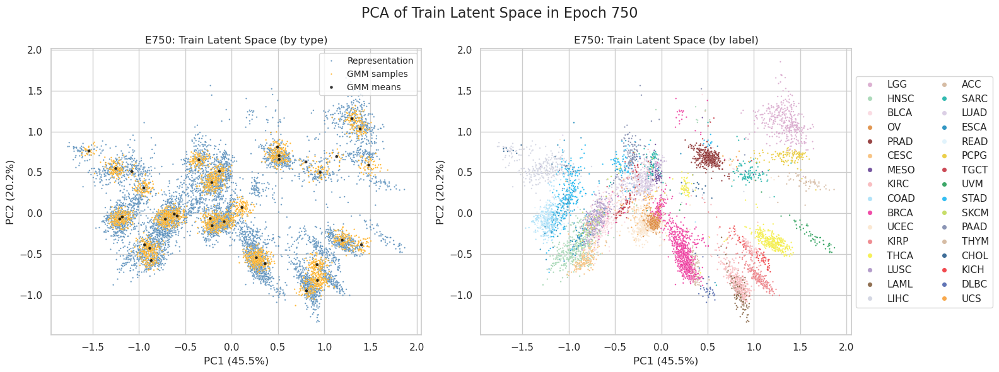

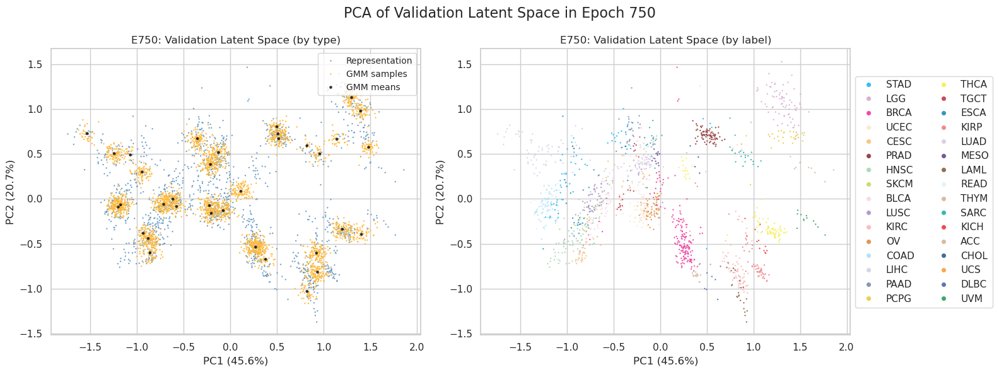

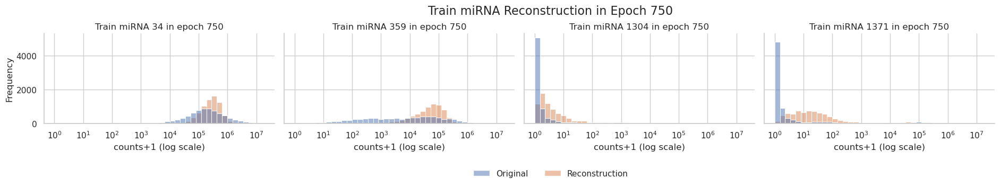

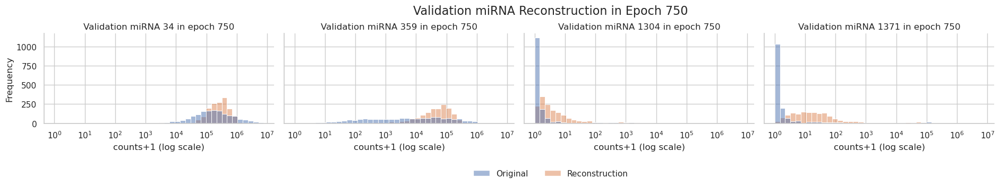

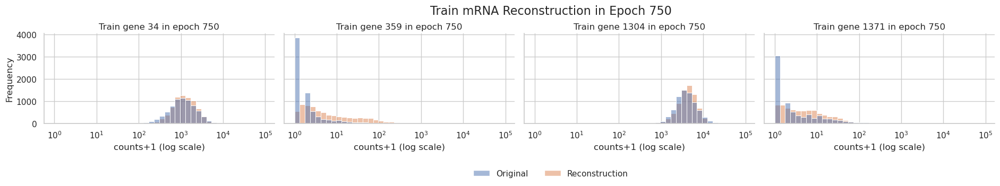

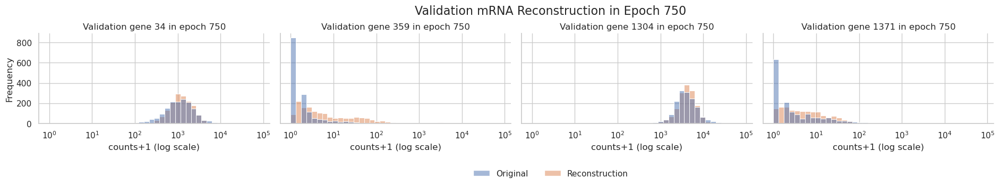

 50%|█████████████████████████████████████████████▎                                            | 756/1500 [45:38<49:07,  3.96s/it]

755 train_loss: 10.465860546062842 train_loss_decoder: 8.329649356692249 train_recon_mirna: 1.8954452938879667 train_recon_mrna: 6.434204062804283 train_gmm: 2.136211189370594 train_mse: 350138336.0 train_mae: 2940.05029296875 train_r2: 0.5735089778900146 train_spearman: 0.28880575299263 train_pearson: 0.908403217792511 train_msle: 7.389120578765869
755 test_loss: 10.501554720531207 test_loss_decoder: 8.364900628656322 test_recon_mirna: 1.9064548357750517 test_recon_mrna: 6.458445792881271 test_gmm: 2.1366540918748838 test_mse: 288003776.0 test_mae: 2768.642333984375 test_r2: 0.5959854125976562 test_spearman: 0.28420236706733704 test_pearson: 0.8988170623779297 test_msle: 7.705254554748535


 51%|█████████████████████████████████████████████▋                                            | 761/1500 [45:54<40:52,  3.32s/it]

760 train_loss: 10.463178365618578 train_loss_decoder: 8.326851768332745 train_recon_mirna: 1.8945835144265384 train_recon_mrna: 6.432268253906206 train_gmm: 2.1363265972858336 train_mse: 350177376.0 train_mae: 2938.696533203125 train_r2: 0.5734614133834839 train_spearman: 0.2907860577106476 train_pearson: 0.9084824323654175 train_msle: 7.22095251083374
760 test_loss: 10.501754214510923 test_loss_decoder: 8.365402176338087 test_recon_mirna: 1.9063902829493935 test_recon_mrna: 6.459011893388694 test_gmm: 2.1363520381728356 test_mse: 287446688.0 test_mae: 2766.732666015625 test_r2: 0.5967669486999512 test_spearman: 0.29015812277793884 test_pearson: 0.8989500999450684 test_msle: 7.404815196990967


 51%|█████████████████████████████████████████████▉                                            | 766/1500 [46:10<38:57,  3.18s/it]

765 train_loss: 10.460942016928911 train_loss_decoder: 8.32441112754413 train_recon_mirna: 1.8935649547330728 train_recon_mrna: 6.430846172811056 train_gmm: 2.1365308893847823 train_mse: 354375040.0 train_mae: 2961.68359375 train_r2: 0.5683484077453613 train_spearman: 0.29169759154319763 train_pearson: 0.9087661504745483 train_msle: 7.301789283752441
765 test_loss: 10.498997345781651 test_loss_decoder: 8.36234645045725 test_recon_mirna: 1.9052237474785467 test_recon_mrna: 6.457122702978705 test_gmm: 2.136650895324401 test_mse: 286366528.0 test_mae: 2763.783447265625 test_r2: 0.5982821583747864 test_spearman: 0.2899009883403778 test_pearson: 0.8987826108932495 test_msle: 7.6045002937316895


 51%|██████████████████████████████████████████████▎                                           | 771/1500 [46:26<39:35,  3.26s/it]

770 train_loss: 10.45864153040739 train_loss_decoder: 8.321975056234782 train_recon_mirna: 1.8928400038741782 train_recon_mrna: 6.429135052360604 train_gmm: 2.1366664741726074 train_mse: 349692928.0 train_mae: 2934.77587890625 train_r2: 0.574051558971405 train_spearman: 0.2931843101978302 train_pearson: 0.9081847071647644 train_msle: 7.265181541442871
770 test_loss: 10.494275122568741 test_loss_decoder: 8.357424827803973 test_recon_mirna: 1.9047058024216954 test_recon_mrna: 6.452719025382277 test_gmm: 2.1368502947647685 test_mse: 284210688.0 test_mae: 2755.672607421875 test_r2: 0.6013064384460449 test_spearman: 0.2872404456138611 test_pearson: 0.8979882597923279 test_msle: 7.4590163230896


 52%|██████████████████████████████████████████████▌                                           | 776/1500 [46:43<39:07,  3.24s/it]

775 train_loss: 10.456414190812849 train_loss_decoder: 8.319612605879408 train_recon_mirna: 1.892062033981415 train_recon_mrna: 6.427550571897994 train_gmm: 2.13680158493344 train_mse: 347837728.0 train_mae: 2926.084716796875 train_r2: 0.5763112902641296 train_spearman: 0.2951974868774414 train_pearson: 0.908625602722168 train_msle: 7.187003135681152
775 test_loss: 10.497634776623526 test_loss_decoder: 8.3602226318724 test_recon_mirna: 1.9042875081424966 test_recon_mrna: 6.455935123729903 test_gmm: 2.137412144751126 test_mse: 288665760.0 test_mae: 2775.7587890625 test_r2: 0.5950567722320557 test_spearman: 0.2928243577480316 test_pearson: 0.8994089961051941 test_msle: 7.351629734039307


 52%|██████████████████████████████████████████████▊                                           | 781/1500 [46:59<39:03,  3.26s/it]

780 train_loss: 10.454184171744535 train_loss_decoder: 8.317259795929338 train_recon_mirna: 1.891143872035797 train_recon_mrna: 6.426115923893541 train_gmm: 2.136924375815196 train_mse: 350549728.0 train_mae: 2941.660888671875 train_r2: 0.5730079412460327 train_spearman: 0.29728418588638306 train_pearson: 0.9087927937507629 train_msle: 6.972804546356201
780 test_loss: 10.494653577866435 test_loss_decoder: 8.357415530824532 test_recon_mirna: 1.9048695094165446 test_recon_mrna: 6.452546021407987 test_gmm: 2.137238047041903 test_mse: 285387520.0 test_mae: 2757.262451171875 test_r2: 0.5996555685997009 test_spearman: 0.2961437702178955 test_pearson: 0.8988580107688904 test_msle: 7.187846660614014


 52%|███████████████████████████████████████████████▏                                          | 786/1500 [47:15<38:30,  3.24s/it]

785 train_loss: 10.452297963340941 train_loss_decoder: 8.315112075530545 train_recon_mirna: 1.890300981297076 train_recon_mrna: 6.424811094233468 train_gmm: 2.137185887810397 train_mse: 346788416.0 train_mae: 2921.191650390625 train_r2: 0.5775893926620483 train_spearman: 0.29921746253967285 train_pearson: 0.9082815051078796 train_msle: 7.075632095336914
785 test_loss: 10.490768386241042 test_loss_decoder: 8.353046209473614 test_recon_mirna: 1.9037265002617525 test_recon_mrna: 6.449319709211862 test_gmm: 2.1377221767674275 test_mse: 289861120.0 test_mae: 2779.568359375 test_r2: 0.5933799147605896 test_spearman: 0.2955741286277771 test_pearson: 0.899624764919281 test_msle: 7.318807601928711


 53%|███████████████████████████████████████████████▍                                          | 791/1500 [47:31<38:49,  3.29s/it]

790 train_loss: 10.44997631534217 train_loss_decoder: 8.312716688876062 train_recon_mirna: 1.8893548201912291 train_recon_mrna: 6.423361868684832 train_gmm: 2.1372596264661077 train_mse: 343393280.0 train_mae: 2901.978271484375 train_r2: 0.5817248821258545 train_spearman: 0.3016529679298401 train_pearson: 0.9080414175987244 train_msle: 6.873320579528809
790 test_loss: 10.491695551579626 test_loss_decoder: 8.35382148587219 test_recon_mirna: 1.9022352821477426 test_recon_mrna: 6.451586203724448 test_gmm: 2.1378740657074355 test_mse: 278952064.0 test_mae: 2726.7294921875 test_r2: 0.6086832284927368 test_spearman: 0.2938782572746277 test_pearson: 0.8994123339653015 test_msle: 7.2542524337768555


 53%|███████████████████████████████████████████████▊                                          | 796/1500 [47:48<38:01,  3.24s/it]

795 train_loss: 10.447964379903034 train_loss_decoder: 8.31055898150256 train_recon_mirna: 1.8887430280147344 train_recon_mrna: 6.421815953487826 train_gmm: 2.1374053984004737 train_mse: 345059584.0 train_mae: 2914.367919921875 train_r2: 0.5796952247619629 train_spearman: 0.3024492561817169 train_pearson: 0.908711850643158 train_msle: 7.009950637817383
795 test_loss: 10.491717619539088 test_loss_decoder: 8.353761994989 test_recon_mirna: 1.90283839712422 test_recon_mrna: 6.45092359786478 test_gmm: 2.1379556245500884 test_mse: 284254976.0 test_mae: 2752.109619140625 test_r2: 0.601244330406189 test_spearman: 0.2965461015701294 test_pearson: 0.8987920880317688 test_msle: 7.327659606933594


 53%|████████████████████████████████████████████████                                          | 801/1500 [48:04<38:39,  3.32s/it]

800 train_loss: 10.446116471253442 train_loss_decoder: 8.308498269737052 train_recon_mirna: 1.8880765820908438 train_recon_mrna: 6.420421687646209 train_gmm: 2.1376182015163887 train_mse: 343955104.0 train_mae: 2903.943359375 train_r2: 0.581040620803833 train_spearman: 0.3055829703807831 train_pearson: 0.9085400104522705 train_msle: 6.91964864730835
800 test_loss: 10.486483723992814 test_loss_decoder: 8.3485253584279 test_recon_mirna: 1.9015449617216331 test_recon_mrna: 6.446980396706267 test_gmm: 2.137958365564915 test_mse: 282611008.0 test_mae: 2740.859130859375 test_r2: 0.6035504341125488 test_spearman: 0.2994142472743988 test_pearson: 0.8991557955741882 test_msle: 7.167404651641846


 54%|████████████████████████████████████████████████▎                                         | 806/1500 [48:20<37:48,  3.27s/it]

805 train_loss: 10.44396922835318 train_loss_decoder: 8.306185632487406 train_recon_mirna: 1.8871983161406325 train_recon_mrna: 6.418987316346774 train_gmm: 2.137783595865775 train_mse: 340658560.0 train_mae: 2891.025390625 train_r2: 0.585055947303772 train_spearman: 0.3078610897064209 train_pearson: 0.9086265563964844 train_msle: 6.9886698722839355
805 test_loss: 10.485228434238751 test_loss_decoder: 8.347135164265572 test_recon_mirna: 1.900906254537552 test_recon_mrna: 6.44622890972802 test_gmm: 2.1380932699731794 test_mse: 282129056.0 test_mae: 2738.82421875 test_r2: 0.6042265295982361 test_spearman: 0.3053017258644104 test_pearson: 0.900020956993103 test_msle: 7.24290132522583


 54%|████████████████████████████████████████████████▋                                         | 811/1500 [48:37<37:44,  3.29s/it]

810 train_loss: 10.442303912171496 train_loss_decoder: 8.304437574715307 train_recon_mirna: 1.886542568423413 train_recon_mrna: 6.417895006291893 train_gmm: 2.137866337456191 train_mse: 339601152.0 train_mae: 2882.0947265625 train_r2: 0.5863440036773682 train_spearman: 0.30994877219200134 train_pearson: 0.9090977907180786 train_msle: 6.594151496887207
810 test_loss: 10.481881295533757 test_loss_decoder: 8.343535812284989 test_recon_mirna: 1.900393422383226 test_recon_mrna: 6.443142389901763 test_gmm: 2.138345483248769 test_mse: 281436736.0 test_mae: 2731.913818359375 test_r2: 0.6051977276802063 test_spearman: 0.30464106798171997 test_pearson: 0.89958655834198 test_msle: 7.003015995025635


 54%|████████████████████████████████████████████████▉                                         | 816/1500 [48:53<37:14,  3.27s/it]

815 train_loss: 10.440436209763504 train_loss_decoder: 8.302368495466588 train_recon_mirna: 1.8857543756862434 train_recon_mrna: 6.416614119780344 train_gmm: 2.1380677142969153 train_mse: 338575680.0 train_mae: 2881.35400390625 train_r2: 0.5875930786132812 train_spearman: 0.3090893626213074 train_pearson: 0.9084872007369995 train_msle: 7.095946311950684
815 test_loss: 10.486638784272433 test_loss_decoder: 8.347801453497308 test_recon_mirna: 1.9012249487038282 test_recon_mrna: 6.44657650479348 test_gmm: 2.1388373307751256 test_mse: 276565248.0 test_mae: 2713.843505859375 test_r2: 0.6120314598083496 test_spearman: 0.30834153294563293 test_pearson: 0.8987953066825867 test_msle: 7.294020175933838


 55%|█████████████████████████████████████████████████▎                                        | 821/1500 [49:10<37:35,  3.32s/it]

820 train_loss: 10.438358531281988 train_loss_decoder: 8.300149875863363 train_recon_mirna: 1.8849350904368343 train_recon_mrna: 6.415214785426529 train_gmm: 2.138208655418625 train_mse: 337464416.0 train_mae: 2872.2451171875 train_r2: 0.5889467000961304 train_spearman: 0.3114854693412781 train_pearson: 0.9082829356193542 train_msle: 6.680944919586182
820 test_loss: 10.482339481226923 test_loss_decoder: 8.34338208025105 test_recon_mirna: 1.9015257881803076 test_recon_mrna: 6.441856292070742 test_gmm: 2.138957400975873 test_mse: 274168672.0 test_mae: 2690.889404296875 test_r2: 0.6153934597969055 test_spearman: 0.3068784773349762 test_pearson: 0.8995399475097656 test_msle: 6.982223033905029


 55%|█████████████████████████████████████████████████▌                                        | 825/1500 [49:23<36:10,  3.22s/it]

825 train_loss: 10.436410730118183 train_loss_decoder: 8.298054683419291 train_recon_mirna: 1.8841202646342752 train_recon_mrna: 6.413934418785017 train_gmm: 2.1383560466988927 train_mse: 335547872.0 train_mae: 2865.39990234375 train_r2: 0.5912811160087585 train_spearman: 0.31459295749664307 train_pearson: 0.9080551862716675 train_msle: 6.935724258422852
825 test_loss: 10.47855559616377 test_loss_decoder: 8.339347582364542 test_recon_mirna: 1.8984040615923892 test_recon_mrna: 6.440943520772153 test_gmm: 2.139208013799229 test_mse: 271775136.0 test_mae: 2682.70556640625 test_r2: 0.6187511086463928 test_spearman: 0.3117380738258362 test_pearson: 0.897965133190155 test_msle: 7.22523307800293


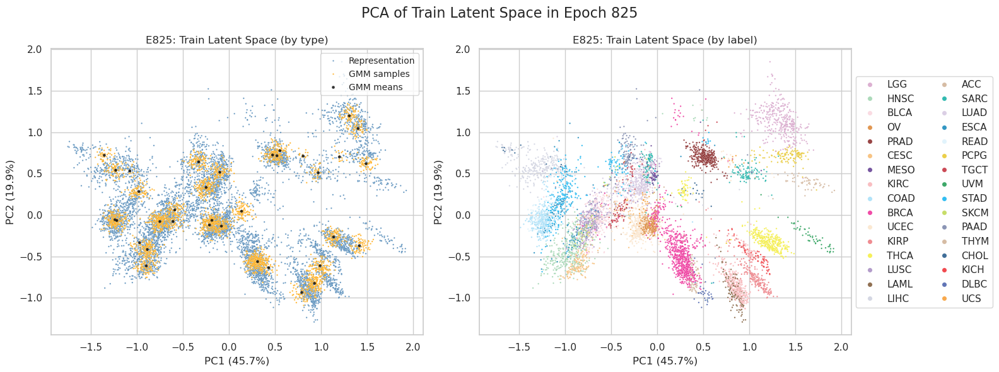

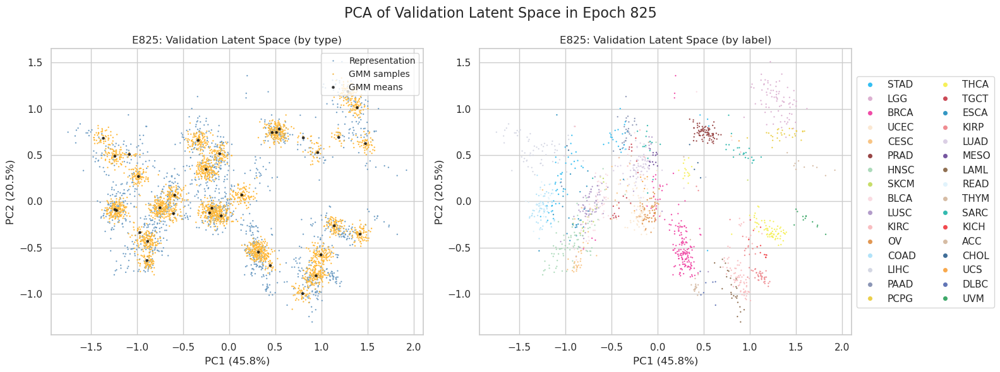

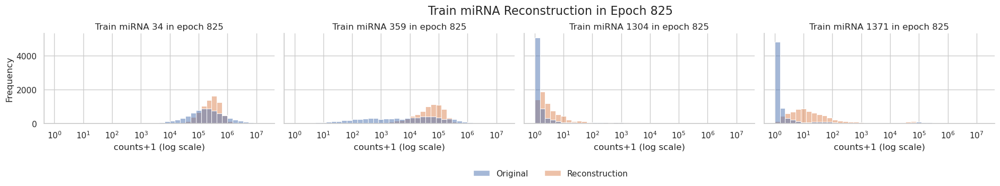

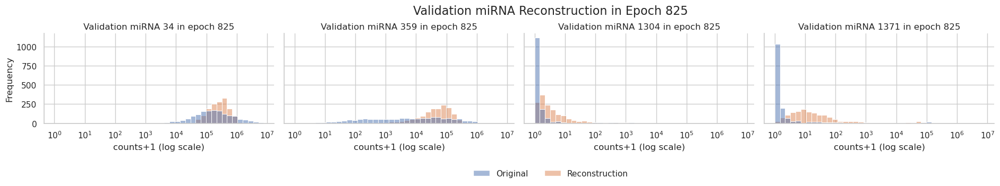

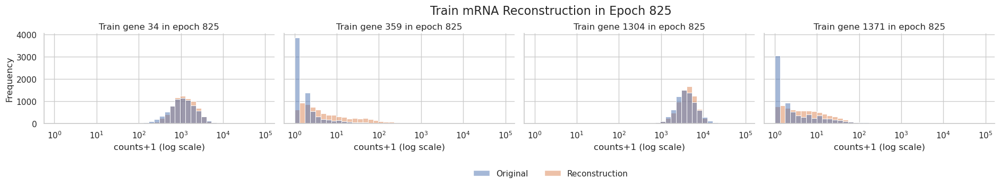

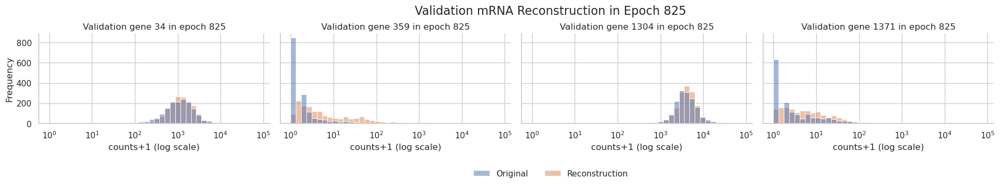

 55%|█████████████████████████████████████████████████▊                                        | 831/1500 [49:59<44:40,  4.01s/it]

830 train_loss: 10.435026785723354 train_loss_decoder: 8.29649870549689 train_recon_mirna: 1.8836604900549243 train_recon_mrna: 6.412838215441967 train_gmm: 2.138528080226463 train_mse: 336307360.0 train_mae: 2864.243408203125 train_r2: 0.5903560519218445 train_spearman: 0.31508392095565796 train_pearson: 0.9087390303611755 train_msle: 6.537690162658691
830 test_loss: 10.484090045866363 test_loss_decoder: 8.344701591872017 test_recon_mirna: 1.8992063176597187 test_recon_mrna: 6.4454952742122975 test_gmm: 2.1393884539943455 test_mse: 278216160.0 test_mae: 2716.975830078125 test_r2: 0.6097155809402466 test_spearman: 0.3132670521736145 test_pearson: 0.8979882001876831 test_msle: 6.891968727111816


 56%|██████████████████████████████████████████████████▏                                       | 836/1500 [50:15<36:49,  3.33s/it]

835 train_loss: 10.432904217810403 train_loss_decoder: 8.29422742378859 train_recon_mirna: 1.8827231396958446 train_recon_mrna: 6.411504284092745 train_gmm: 2.1386767940218148 train_mse: 334409920.0 train_mae: 2853.2548828125 train_r2: 0.5926672220230103 train_spearman: 0.3157438635826111 train_pearson: 0.908626914024353 train_msle: 6.6820173263549805
835 test_loss: 10.47674224134279 test_loss_decoder: 8.33792551144659 test_recon_mirna: 1.9002159924621524 test_recon_mrna: 6.4377095189844376 test_gmm: 2.138816729896201 test_mse: 273482592.0 test_mae: 2690.091064453125 test_r2: 0.6163558959960938 test_spearman: 0.3135546147823334 test_pearson: 0.8993626832962036 test_msle: 7.001432418823242


 56%|██████████████████████████████████████████████████▍                                       | 841/1500 [50:31<36:04,  3.29s/it]

840 train_loss: 10.431246439469644 train_loss_decoder: 8.292418281332871 train_recon_mirna: 1.8820775065415873 train_recon_mrna: 6.410340774791283 train_gmm: 2.1388281581367736 train_mse: 334197984.0 train_mae: 2855.18017578125 train_r2: 0.5929253697395325 train_spearman: 0.3172634243965149 train_pearson: 0.9092918038368225 train_msle: 6.594703674316406
840 test_loss: 10.473892269357982 test_loss_decoder: 8.33456212048073 test_recon_mirna: 1.897435439808349 test_recon_mrna: 6.43712668067238 test_gmm: 2.1393301488772525 test_mse: 276644128.0 test_mae: 2705.36865234375 test_r2: 0.6119208335876465 test_spearman: 0.3143860995769501 test_pearson: 0.8997337818145752 test_msle: 6.946295261383057


 56%|██████████████████████████████████████████████████▊                                       | 846/1500 [50:47<35:11,  3.23s/it]

845 train_loss: 10.42961370152799 train_loss_decoder: 8.29062409729619 train_recon_mirna: 1.881403895748879 train_recon_mrna: 6.409220201547311 train_gmm: 2.1389896042317993 train_mse: 334948544.0 train_mae: 2858.499755859375 train_r2: 0.5920111536979675 train_spearman: 0.3205801546573639 train_pearson: 0.9096342921257019 train_msle: 6.495497226715088
845 test_loss: 10.478679675820871 test_loss_decoder: 8.339223685536062 test_recon_mirna: 1.8980565933107307 test_recon_mrna: 6.441167092225332 test_gmm: 2.1394559902848087 test_mse: 272209088.0 test_mae: 2684.412353515625 test_r2: 0.6181423664093018 test_spearman: 0.31708237528800964 test_pearson: 0.8984588980674744 test_msle: 6.770972728729248


 57%|███████████████████████████████████████████████████                                       | 851/1500 [51:03<34:35,  3.20s/it]

850 train_loss: 10.427874791291028 train_loss_decoder: 8.28880515241652 train_recon_mirna: 1.8808079005572143 train_recon_mrna: 6.407997251859306 train_gmm: 2.139069638874507 train_mse: 332230848.0 train_mae: 2844.81787109375 train_r2: 0.5953214764595032 train_spearman: 0.3203452527523041 train_pearson: 0.9089928865432739 train_msle: 6.468194484710693
850 test_loss: 10.470558882616547 test_loss_decoder: 8.330856320731911 test_recon_mirna: 1.8966851048928424 test_recon_mrna: 6.434171215839069 test_gmm: 2.139702561884637 test_mse: 272232672.0 test_mae: 2684.3115234375 test_r2: 0.6181092858314514 test_spearman: 0.314731627702713 test_pearson: 0.8989478945732117 test_msle: 6.803689479827881


 57%|███████████████████████████████████████████████████▎                                      | 856/1500 [51:19<34:31,  3.22s/it]

855 train_loss: 10.425866941077691 train_loss_decoder: 8.286659673825412 train_recon_mirna: 1.8799019620397508 train_recon_mrna: 6.406757711785661 train_gmm: 2.13920726725228 train_mse: 326979968.0 train_mae: 2816.464599609375 train_r2: 0.6017173528671265 train_spearman: 0.3213309347629547 train_pearson: 0.9089246392250061 train_msle: 6.744029998779297
855 test_loss: 10.469848222983243 test_loss_decoder: 8.3300137843425 test_recon_mirna: 1.895195082968385 test_recon_mrna: 6.434818701374114 test_gmm: 2.139834438640744 test_mse: 268380000.0 test_mae: 2663.53466796875 test_r2: 0.6235138773918152 test_spearman: 0.3182765543460846 test_pearson: 0.9005789160728455 test_msle: 7.022675514221191


 57%|███████████████████████████████████████████████████▋                                      | 861/1500 [51:35<34:01,  3.19s/it]

860 train_loss: 10.42471587138829 train_loss_decoder: 8.285328550731354 train_recon_mirna: 1.8795624477913955 train_recon_mrna: 6.405766102939959 train_gmm: 2.139387320656936 train_mse: 328022592.0 train_mae: 2823.637939453125 train_r2: 0.600447416305542 train_spearman: 0.32076191902160645 train_pearson: 0.9092172980308533 train_msle: 6.783600330352783
860 test_loss: 10.475884720943885 test_loss_decoder: 8.33565031691732 test_recon_mirna: 1.8972099326668947 test_recon_mrna: 6.438440384250425 test_gmm: 2.140234404026565 test_mse: 264041744.0 test_mae: 2639.53271484375 test_r2: 0.6295995712280273 test_spearman: 0.3192406892776489 test_pearson: 0.8991529941558838 test_msle: 6.988293170928955


 58%|███████████████████████████████████████████████████▉                                      | 866/1500 [51:51<34:15,  3.24s/it]

865 train_loss: 10.422809279724127 train_loss_decoder: 8.28339261419832 train_recon_mirna: 1.8788050910537775 train_recon_mrna: 6.404587523144543 train_gmm: 2.1394166655258076 train_mse: 332264448.0 train_mae: 2845.195556640625 train_r2: 0.5952805280685425 train_spearman: 0.32711243629455566 train_pearson: 0.9095059633255005 train_msle: 6.500003337860107
865 test_loss: 10.472488827740433 test_loss_decoder: 8.331939555871818 test_recon_mirna: 1.8942371933229742 test_recon_mrna: 6.437702362548844 test_gmm: 2.1405492718686143 test_mse: 275167968.0 test_mae: 2703.465576171875 test_r2: 0.6139916181564331 test_spearman: 0.3220303952693939 test_pearson: 0.898850679397583 test_msle: 6.796248912811279


 58%|████████████████████████████████████████████████████▎                                     | 871/1500 [52:07<33:50,  3.23s/it]

870 train_loss: 10.421504265880564 train_loss_decoder: 8.281891072217435 train_recon_mirna: 1.8782623496178696 train_recon_mrna: 6.403628722599565 train_gmm: 2.139613193663129 train_mse: 326429568.0 train_mae: 2814.761962890625 train_r2: 0.6023877859115601 train_spearman: 0.32688108086586 train_pearson: 0.9092157483100891 train_msle: 6.652487277984619
870 test_loss: 10.472233926110473 test_loss_decoder: 8.331791228541158 test_recon_mirna: 1.8951300151820265 test_recon_mrna: 6.436661213359132 test_gmm: 2.1404426975693154 test_mse: 266404592.0 test_mae: 2657.347412109375 test_r2: 0.6262849569320679 test_spearman: 0.3256714940071106 test_pearson: 0.8991689682006836 test_msle: 6.914787769317627


 58%|████████████████████████████████████████████████████▌                                     | 876/1500 [52:24<34:07,  3.28s/it]

875 train_loss: 10.419324014060923 train_loss_decoder: 8.279612726213438 train_recon_mirna: 1.87718627324253 train_recon_mrna: 6.402426452970908 train_gmm: 2.139711287847485 train_mse: 328429664.0 train_mae: 2827.4658203125 train_r2: 0.5999515652656555 train_spearman: 0.32775405049324036 train_pearson: 0.9096466302871704 train_msle: 6.596292018890381
875 test_loss: 10.469980837379403 test_loss_decoder: 8.329141468213741 test_recon_mirna: 1.8952237032072983 test_recon_mrna: 6.433917765006443 test_gmm: 2.1408393691656604 test_mse: 268134304.0 test_mae: 2661.982421875 test_r2: 0.6238585710525513 test_spearman: 0.32798677682876587 test_pearson: 0.9003764986991882 test_msle: 6.799859046936035


 59%|████████████████████████████████████████████████████▊                                     | 881/1500 [52:40<33:39,  3.26s/it]

880 train_loss: 10.417916336379331 train_loss_decoder: 8.27806076899687 train_recon_mirna: 1.8764672621252576 train_recon_mrna: 6.401593506871612 train_gmm: 2.1398555673824626 train_mse: 330379872.0 train_mae: 2836.810546875 train_r2: 0.5975760817527771 train_spearman: 0.32853439450263977 train_pearson: 0.9101097583770752 train_msle: 6.4947404861450195
880 test_loss: 10.47398540881057 test_loss_decoder: 8.333389063472817 test_recon_mirna: 1.8944969082543832 test_recon_mrna: 6.438892155218434 test_gmm: 2.140596345337753 test_mse: 269209408.0 test_mae: 2667.495849609375 test_r2: 0.6223503351211548 test_spearman: 0.3239041268825531 test_pearson: 0.8997779488563538 test_msle: 6.80320405960083


 59%|█████████████████████████████████████████████████████▏                                    | 886/1500 [52:57<33:35,  3.28s/it]

885 train_loss: 10.41672771513413 train_loss_decoder: 8.276782422080593 train_recon_mirna: 1.876116910585743 train_recon_mrna: 6.400665511494851 train_gmm: 2.1399452930535365 train_mse: 323898752.0 train_mae: 2801.397216796875 train_r2: 0.6054705381393433 train_spearman: 0.3307780623435974 train_pearson: 0.9086861610412598 train_msle: 6.482067584991455
885 test_loss: 10.48172718200297 test_loss_decoder: 8.34054331068644 test_recon_mirna: 1.896154383540235 test_recon_mrna: 6.444388927146205 test_gmm: 2.141183871316529 test_mse: 269286432.0 test_mae: 2672.31103515625 test_r2: 0.6222423315048218 test_spearman: 0.3264327645301819 test_pearson: 0.8999010920524597 test_msle: 6.807266712188721


 59%|█████████████████████████████████████████████████████▍                                    | 891/1500 [53:13<33:16,  3.28s/it]

890 train_loss: 10.415376293583307 train_loss_decoder: 8.275272568014287 train_recon_mirna: 1.875620290722974 train_recon_mrna: 6.399652277291313 train_gmm: 2.140103725569019 train_mse: 323278752.0 train_mae: 2800.35498046875 train_r2: 0.6062257289886475 train_spearman: 0.33396244049072266 train_pearson: 0.9088528752326965 train_msle: 6.5174736976623535
890 test_loss: 10.46136331938192 test_loss_decoder: 8.320252397991664 test_recon_mirna: 1.8916677121273424 test_recon_mrna: 6.4285846858643225 test_gmm: 2.1411109213902564 test_mse: 262365680.0 test_mae: 2632.110107421875 test_r2: 0.6319507956504822 test_spearman: 0.3319856524467468 test_pearson: 0.9011318683624268 test_msle: 6.927829742431641


 60%|█████████████████████████████████████████████████████▊                                    | 896/1500 [53:29<33:03,  3.28s/it]

895 train_loss: 10.413914146832491 train_loss_decoder: 8.273683038527203 train_recon_mirna: 1.8749643639714664 train_recon_mrna: 6.398718674555736 train_gmm: 2.1402311083052887 train_mse: 323394720.0 train_mae: 2798.41015625 train_r2: 0.6060844659805298 train_spearman: 0.337032288312912 train_pearson: 0.9092066287994385 train_msle: 6.549750804901123
895 test_loss: 10.46088313994833 test_loss_decoder: 8.319991309983045 test_recon_mirna: 1.8915237239078715 test_recon_mrna: 6.4284675860751745 test_gmm: 2.1408918299652844 test_mse: 262238512.0 test_mae: 2629.499267578125 test_r2: 0.6321291923522949 test_spearman: 0.3356688916683197 test_pearson: 0.9011719822883606 test_msle: 6.862862586975098


 60%|██████████████████████████████████████████████████████                                    | 900/1500 [53:43<33:00,  3.30s/it]

900 train_loss: 10.412420250601407 train_loss_decoder: 8.27211373917871 train_recon_mirna: 1.874428871204798 train_recon_mrna: 6.397684867973911 train_gmm: 2.140306511422697 train_mse: 321171552.0 train_mae: 2789.9462890625 train_r2: 0.6087924242019653 train_spearman: 0.33672747015953064 train_pearson: 0.9095301628112793 train_msle: 6.611809730529785
900 test_loss: 10.458685890603864 test_loss_decoder: 8.317356427842045 test_recon_mirna: 1.8924327492257451 test_recon_mrna: 6.4249236786163 test_gmm: 2.14132946276182 test_mse: 262849040.0 test_mae: 2634.771240234375 test_r2: 0.6312727332115173 test_spearman: 0.33444058895111084 test_pearson: 0.9014036059379578 test_msle: 6.928132057189941


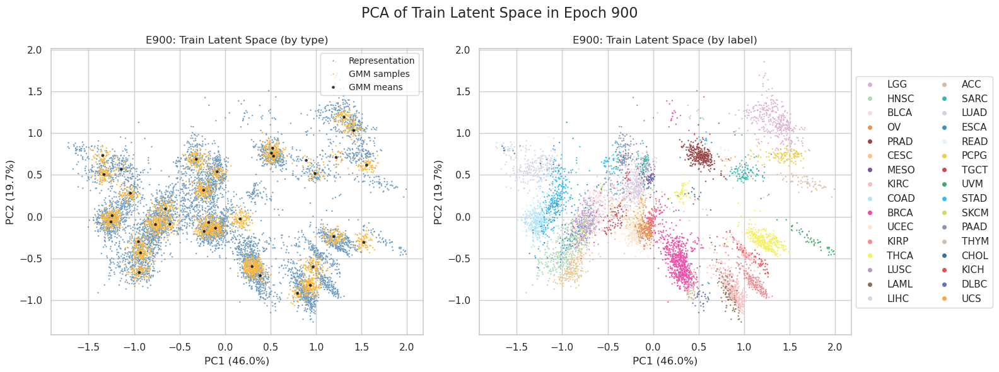

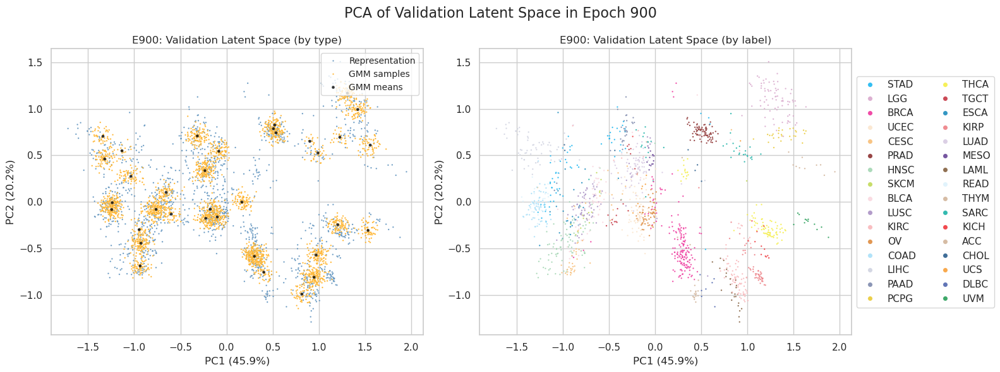

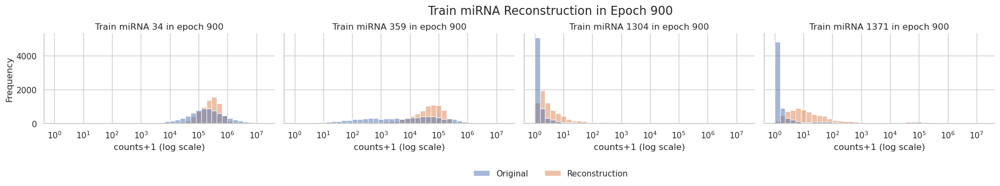

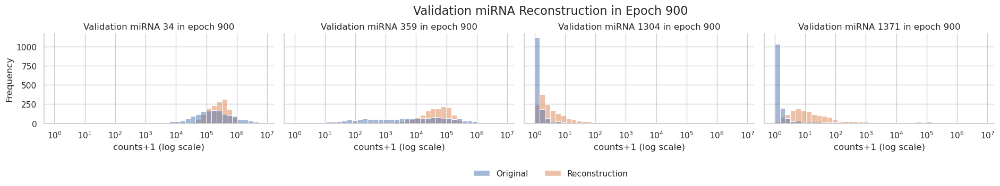

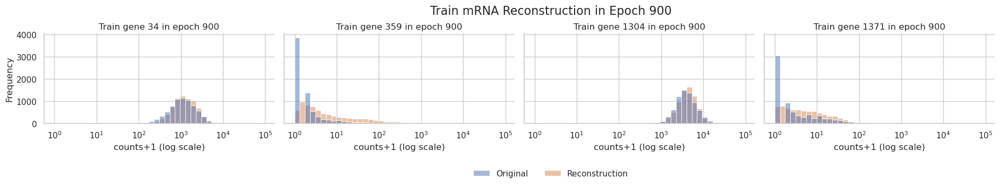

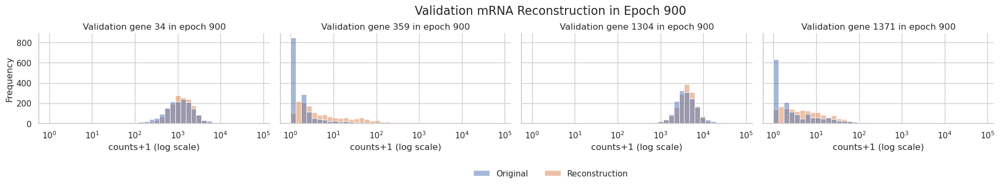

 60%|████████████████████████████████████████████████████▉                                   | 902/1500 [54:04<1:04:05,  6.43s/it]

In [ ]:
learning_rates={'dec':1e-4, 'rep':1e-2, 'gmm':1e-2}
weight_decay={'dec':1e-4, 'rep':1e-4, 'gmm':1e-4}
betas=(0.7, 0.9)
nepochs = 1500
pr = 5 # how often to print epoch
plot = 75 # how often to print plot

sample_mirna = ['MIMAT0000421', 'MIMAT0000422', 'MIMAT0000435', 'MIMAT0000728']
sample_index = [tcga_mirna.columns.get_loc(a) for a in sample_mirna]

print(sample_index)
subset = sample_index[0]

loss_tab = train_midgd(dgd, train_loader, validation_loader, device,
                       learning_rates=learning_rates, weight_decay=weight_decay, betas=betas, 
                       nepochs=nepochs, fold=None, pr=pr, plot=plot, 
                       reduction_type=reduction_type, scaling_type=scaling_type,
                       sample_index=sample_index, subset=subset, wandb_log=False, early_stopping=50, is_plot=True)

# Plotting Loss

In [ ]:
# Set the aesthetic style of the plots
sns.set_style("whitegrid")

# Create a figure to hold the subplots
plt.figure(figsize=(20, 6))
plt.subplots_adjust(wspace=0.3)

plt.subplot(1, 3, 1)
sns.lineplot(x="epoch", y="train_recon_mirna", data=loss_tab, label="Train")
sns.lineplot(x="epoch", y="test_recon_mirna", data=loss_tab, label="Test")
plt.title("miRNA reconstruction loss")
plt.xlabel("Epoch")
plt.ylabel("Reconstruction loss")

plt.subplot(1, 3, 2)
sns.lineplot(x="epoch", y="train_recon_mrna", data=loss_tab, label="Train")
sns.lineplot(x="epoch", y="test_recon_mrna", data=loss_tab, label="Test")
plt.title("mRNA reconstruction loss")
plt.xlabel("Epoch")
plt.ylabel("Reconstruction loss")

plt.subplot(1, 3, 3)
sns.lineplot(x="epoch", y="train_gmm", data=loss_tab, label="Train")
sns.lineplot(x="epoch", y="test_gmm", data=loss_tab, label="Test")
plt.title("GMM loss")
plt.xlabel("Epoch")
plt.ylabel("GMM loss")

# Display the plots
plt.show()

In [ ]:
# Set the aesthetic style of the plots
sns.set_style("whitegrid")

# Create a figure to hold the subplots
plt.figure(figsize=(24, 6))
plt.subplots_adjust(wspace=0.3)

# First subplot for R-squared
plt.subplot(1, 4, 1)
sns.lineplot(x="epoch", y="train_r2", data=loss_tab, label="Train")
sns.lineplot(x="epoch", y="test_r2", data=loss_tab, label="Test")
plt.title("R^2")
plt.xlabel("Epoch")
plt.ylabel("R^2")

# Second subplot for Corr
plt.subplot(1, 4, 2)
sns.lineplot(x="epoch", y="train_spearman", data=loss_tab, label="Train")
sns.lineplot(x="epoch", y="test_spearman", data=loss_tab, label="Test")
plt.title("Spearman")
plt.xlabel("Epoch")
plt.ylabel("Spearman")

# Third subplot for MSE
plt.subplot(1, 4, 3)
sns.lineplot(x="epoch", y="train_pearson", data=loss_tab, label="Train")
sns.lineplot(x="epoch", y="test_pearson", data=loss_tab, label="Test")
plt.title("Pearson")
plt.xlabel("Epoch")
plt.ylabel("Pearson")

# Fourth subplot for MAE
plt.subplot(1, 4, 4)
sns.lineplot(x="epoch", y="train_mae", data=loss_tab, label="Train")
sns.lineplot(x="epoch", y="test_mae", data=loss_tab, label="Test")
plt.title("MAE")
plt.xlabel("Epoch")
plt.ylabel("MAE")

# Display the plots
plt.show()

# Save Model

In [ ]:
torch.save(dgd, "models/midgd-ms-filtered-best-4.pth")

# Overall Model Performance

In [ ]:
from base.engine.predict import learn_new_representation #, learn_new_representation_mrna

In [ ]:
new_rep = learn_new_representation(dgd, test_loader, learning_rates=1e-2, weight_decay=0., test_epochs=50)
dgd.test_rep = new_rep

In [ ]:
mirna_annot = pd.read_table("data/TCGA_mirna_anno_iso_match.tsv", sep='\t', index_col=[0])

# Change column name
mirna_column = pd.Series(train_mirna.columns[:-4])

# Convert mirna_annot DataFrame to a dictionary for mapping
mapping_dict = dict(zip(mirna_annot['mature_iso_id'], mirna_annot['mature_iso_name_miRBase']))

# Replace the values in mirna_column using the mapping dictionary
mirna_column = mirna_column.map(mapping_dict).fillna(mirna_column)
mirna_column = np.array(mirna_column)

print(mirna_column)

def _add_columns(X, y, data_loader):
    X = X.assign(tissue=data_loader.dataset.tissue_type)
    X = X.assign(sample=data_loader.dataset.sample_type)
    X = X.assign(color=data_loader.dataset.color)
    X = X.assign(cancer_type=data_loader.dataset.label)
    
    y = y.assign(tissue=data_loader.dataset.tissue_type)
    y = y.assign(sample=data_loader.dataset.sample_type)
    y = y.assign(color=data_loader.dataset.color)
    y = y.assign(cancer_type=data_loader.dataset.label)
    return X, y

def _get_data_prediction(dgd, data_loader, mirna_column_name, dataset="train"):
    with torch.inference_mode():
        scaling = torch.mean(data_loader.dataset.mirna_data, axis=1)
        if dataset == "train":
            X, _ = dgd.forward(dgd.train_rep()) 
        elif dataset == "val":
            X, _ = dgd.forward(dgd.val_rep()) 
        elif dataset == "test":
            X, _ = dgd.forward(dgd.test_rep()) 
        X = X * scaling.unsqueeze(1).to(device)
        X = X.detach().cpu().numpy()
        X = pd.DataFrame(X, columns=mirna_column_name)

        y = data_loader.dataset.mirna_data
        y = y.detach().cpu().numpy()
        y = pd.DataFrame(y, columns=mirna_column_name)
        
        X, y = _add_columns(X, y, data_loader)
    return X, y

def _get_data_pred_from_rep(dgd, test_rep, data_loader, mirna_column_name):
    with torch.inference_mode():
        scaling = torch.mean(data_loader.dataset.mirna_data, axis=1)
        X, _ = dgd.forward(test_rep.z) 
        X = X * scaling.unsqueeze(1).to(device)
        X = X.detach().cpu().numpy()
        X = pd.DataFrame(X, columns=mirna_column_name)

        y = data_loader.dataset.mirna_data
        y = y.detach().cpu().numpy()
        y = pd.DataFrame(y, columns=mirna_column_name)
        
        X, y = _add_columns(X, y, data_loader)
    return X, y
    
def generate_analysis_data(dgd, train_loader, validation_loader, test_loader, mirna_column_name, subset=False, dataset="test"):
    if subset:
        if dataset == "train":
            X_train, y_train = _get_data_prediction(dgd, train_loader, mirna_column_name, dataset="train")
            train = pd.DataFrame(
                data={
                    'X': X_train[subset], 
                    'y': y_train[subset],
                    'cancer_type': train_loader.dataset.label,
                    'tissue': train_loader.dataset.tissue_type,
                    'color': train_loader.dataset.color
                }
            )
            return train
        elif dataset == "val":
            X_val, y_val = _get_data_prediction(dgd, validation_loader, mirna_column_name, dataset="val")
            val = pd.DataFrame(
                data={
                    'X': X_val[subset], 
                    'y': y_val[subset],
                    'cancer_type': validation_loader.dataset.label,
                    'tissue': validation_loader.dataset.tissue_type,
                    'color': validation_loader.dataset.color
                }
            )
            return val
        elif dataset == "test":
            X_test, y_test = _get_data_prediction(dgd, test_loader, mirna_column_name, dataset="test")
            test = pd.DataFrame(
                data={
                    'X': X_test[subset], 
                    'y': y_test[subset],
                    'cancer_type': test_loader.dataset.label,
                    'tissue': test_loader.dataset.tissue_type,
                    'color': test_loader.dataset.color
                }
            )
            return test
    else:
        X_train, y_train = _get_data_prediction(dgd, train_loader, mirna_column_name, dataset="train")
        X_val, y_val = _get_data_prediction(dgd, validation_loader, mirna_column_name, dataset="val")
        X_test, y_test = _get_data_prediction(dgd, test_loader, mirna_column_name, dataset="test")
        
    return X_train, y_train, X_val, y_val, X_test, y_test

def get_mirna_data(dgd, data_loader, subset, mirna_column_name=mirna_column, dataset="test"):
    return generate_analysis_data(dgd, *data_loader, mirna_column_name, subset=subset, dataset=dataset)

X_train, y_train, X_val, y_val, X_test, y_test = generate_analysis_data(dgd, train_loader, validation_loader, test_loader, mirna_column)

In [ ]:
from scipy import stats

def calculate_corr(X, y, axis=0):
    spearman_corr = []
    pearson_corr = []
    spearman_pval = []
    pearson_pval = []
    r2 = []
    r2_pval = []
    X = X.iloc[:,:-4]
    y = y.iloc[:,:-4]
    
    if axis == 0:
        for i in range(y.shape[1]):
            # Calculate Spearman correlation coefficient
            spearman, spearman_p = stats.spearmanr(X.iloc[:, i], y.iloc[:, i])
            pearson, pearson_p = stats.pearsonr(X.iloc[:, i], y.iloc[:, i])
            _, _, r_value, r_p, _ = stats.linregress(X.iloc[:, i], y.iloc[:, i])
            
            spearman_corr.append(spearman)
            pearson_corr.append(pearson)
            r2.append(r_value**2)
            spearman_pval.append(spearman_p)
            pearson_pval.append(pearson_p)
            r2_pval.append(r_p)
        
        corr_data = pd.DataFrame(
            data={  
                'pearson': pearson_corr,
                'spearman': spearman_corr,
                'r2': r2,
                'pearson_p': pearson_pval,
                'spearman_p': spearman_pval,
                'r2_p': r2_pval,
                'mirna': X.columns
            },
            index=np.arange(0, len(X.columns))
        )
    elif axis == 1:
        for i in range(y.shape[0]):
            # Calculate Spearman correlation coefficient
            spearman, spearman_p = stats.spearmanr(X.iloc[i, :], y.iloc[i, :])
            pearson, pearson_p = stats.pearsonr(X.iloc[i, :], y.iloc[i, :])
            _, _, r_value, r_p, _ = stats.linregress(X.iloc[i, :], y.iloc[i, :])
            
            spearman_corr.append(spearman)
            pearson_corr.append(pearson)
            r2.append(r_value**2)
            spearman_pval.append(spearman_p)
            pearson_pval.append(pearson_p)
            r2_pval.append(r_p)
        
        corr_data = pd.DataFrame(
            data={  
                'pearson': pearson_corr,
                'spearman': spearman_corr,
                'r2': r2,
                'pearson_p': pearson_pval,
                'spearman_p': spearman_pval,
                'r2_p': r2_pval,
                'mirna': X.index[:-4]
            },
            index=np.arange(0, len(X.index))
        )
    else:
        raise ValueError("Axis must be 0 (columns) or 1 (rows).")
    
    return corr_data.sort_values(by='pearson', ascending=False, ignore_index=True)

def calculate_pearson(X, y, sparsity):
    pearson_corr = []
    pearson_pval = []
    
    for i in range(y_test.shape[1]-4):
        # Calculate Spearman correlation coefficient
        pearson, pearson_p = stats.pearsonr(X.iloc[:,i], y.iloc[:,i])
        pearson_corr.append(pearson)
        pearson_pval.append(pearson_p)
        
    corr_data = pd.DataFrame(
        data={  
            'mirna': X.columns[:-4],
            'pearson': pearson_corr,
            'sparsity': np.repeat(sparsity, len(X.columns[:-4]))
        },
        index=np.arange(0, len(X.columns[:-4]))
    )
    return corr_data.sort_values(by='pearson', ascending=False, ignore_index=True)

def calculate_spearman(X, y, sparsity):
    spearman_corr = []
    spearman_pval = []
    
    for i in range(y_test.shape[1]-4):
        # Calculate Spearman correlation coefficient
        spearman, spearman_p = stats.spearmanr(X.iloc[:,i], y.iloc[:,i])
        spearman_corr.append(spearman)
        spearman_pval.append(spearman_p)
        
    corr_data = pd.DataFrame(
        data={  
            'mirna': X.columns[:-4],
            'spearman': spearman_corr,
            'sparsity': np.repeat(sparsity, len(X.columns[:-4]))
        },
        index=np.arange(0, len(X.columns[:-4]))
    )
    return corr_data.sort_values(by='spearman', ascending=False, ignore_index=True)

def plot_average_correlation(savedir='plots', filename='None'):
    sns.set_theme(style="whitegrid")
    sns.set_style("white")
    fig = plt.figure(figsize=(8,3))
    
    plt.subplot(1, 2, 1)
    sns.histplot(data=corr_data, x='spearman', bins=35)
    # plt.title("Spearman's Correlation")
    plt.xlabel("Spearman's Correlation")
    mean_spearman = corr_data['spearman'].mean()
    plt.axvline(mean_spearman, color='red', linestyle='dashed', linewidth=1)
    plt.text(mean_spearman, plt.gca().get_ylim()[1] * 0.9, f'Mean: {mean_spearman:.2f}', color='red')
    
    plt.subplot(1,2,2)
    sns.histplot(data=corr_data, x='pearson', bins=30)
    # plt.title("Pearson's Correlation")
    plt.xlabel("Pearson's Correlation")
    plt.ylabel("")
    mean_pearson = corr_data['pearson'].mean()
    plt.axvline(mean_pearson, color='red', linestyle='dashed', linewidth=1)
    plt.text(mean_pearson, plt.gca().get_ylim()[1] * 0.9, f'Mean: {mean_pearson:.2f}', color='red')
    
    # Add the main title to the figure
    # fig.suptitle("samples correlation histogram", fontsize=16)
    
    # Display the plots
    sns.despine()
    plt.tight_layout()
    if filename:
        plt.savefig(os.path.join(savedir, filename))
    plt.show()

In [ ]:
corr_data = calculate_corr(X_test, y_test, axis=0)

In [ ]:
plot_average_correlation(corr_data, filename=None)